In [88]:
# import packages
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
plt.style.use('seaborn')
pd.options.mode.chained_assignment = None 
from matplotlib.lines import Line2D
import scipy
from numba import jit
import plotly.graph_objects as go
import networkx as nx
import seaborn as sns
import pingouin as pg
import pandas as pd
import scipy.stats as stats
import warnings

In [2]:
## Load data and clean up

In [4]:
fl = "year_origin_hs02_6.tsv.bz2"
data = pd.read_csv(fl, converters={'hs02':str}, compression="bz2", delimiter="\t") #Import HS codes as strings to preserve formatting
data.head()

,year,origin,hs02,export_val,import_val,export_rca,import_rca
0,2003,ago,010110,NaN,2739.0,NaN,0.003994
1,2003,ago,010190,NaN,15691.0,NaN,0.038321
2,2003,ago,010290,17821.54,2566670.0,0.005119,1.310820
3,2003,ago,010410,NaN,32997.0,NaN,0.068981
4,2003,ago,010420,6711.52,16355.0,0.067391,0.291989


In [5]:
data.rename(columns = {'hs02':'HSCode'}, inplace = True)
#data.rename(columns = {'year':'Time'}, inplace = True)

In [6]:
data.head()

,year,origin,HSCode,export_val,import_val,export_rca,import_rca
0,2003,ago,010110,NaN,2739.0,NaN,0.003994
1,2003,ago,010190,NaN,15691.0,NaN,0.038321
2,2003,ago,010290,17821.54,2566670.0,0.005119,1.310820
3,2003,ago,010410,NaN,32997.0,NaN,0.068981
4,2003,ago,010420,6711.52,16355.0,0.067391,0.291989


In [7]:
data.origin.nunique()

238

In [8]:
## insert Country Code
cntry_codes = pd.read_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\countrycodes.csv')

In [9]:
data1 = pd.merge(data, cntry_codes, on = 'origin', how = 'left')#, indicator="indicator_column")

In [10]:
data1.head()

,year,origin,HSCode,export_val,import_val,export_rca,import_rca,cntry,ORIGIN
0,2003,ago,010110,NaN,2739.0,NaN,0.003994,Angola,AGO
1,2003,ago,010190,NaN,15691.0,NaN,0.038321,Angola,AGO
2,2003,ago,010290,17821.54,2566670.0,0.005119,1.310820,Angola,AGO
3,2003,ago,010410,NaN,32997.0,NaN,0.068981,Angola,AGO
4,2003,ago,010420,6711.52,16355.0,0.067391,0.291989,Angola,AGO


In [11]:
data1.origin.nunique()

238

In [12]:
# read green product list
gp_category = pd.read_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Copy of Environmental Green Goods_All_FIXED.csv', usecols=range(4))
gp_category['HSCode'] = gp_category['HSCode'].astype(str)
gp_category.rename(columns={'Environmental theme or medium' : 'Theme'}, inplace = True)

In [13]:
gp_category.head()

,HSCode,Medium,Theme,Color
0,840410,APC,Air pollution control,cyan
1,840420,APC,Air pollution control,cyan
2,840490,APC,Air pollution control,cyan
3,840510,APC,Air pollution control,cyan
4,841410,APC,Air pollution control,cyan


In [14]:
GPCodes = gp_category.HSCode.unique()
len(GPCodes)
type(GPCodes)
GHSCode = GPCodes.tolist()

In [15]:
data1['HSCode'] = data1['HSCode'].astype(str)

In [16]:
data2 = pd.merge(data1, gp_category,on = 'HSCode', how = 'left')

In [17]:
data2['Medium'] =  data2['Medium'].fillna(0)
data2['gp2'] = data2['Medium'].apply(lambda x: 'No' if x == 0 else 'Yes')

In [18]:
## Read In other products Catgeories

In [19]:
data2['categ_no'] = data2['HSCode'].str[:2]

In [20]:
prod_category = pd.read_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Products Category.csv', usecols=range(4))
prod_category['categ_no']=prod_category['categ_no'].apply(lambda x: '{0:0>2}'.format(x))
prod_category['categ_no'] = prod_category['categ_no'].astype(str)
prod_category.head(n=3)

,categ_no,Category,Category_Num,Category_Color
0,01,Agriculture,1,yellow
1,02,Agriculture,1,yellow
2,03,Agriculture,1,yellow


In [21]:
data2.origin.nunique()

238

In [22]:
exports_All = pd.merge(data2, prod_category,on = 'categ_no', how = 'left')
#exports_All .loc[f["categ_no"] <= "15", "Category"] = 'Agriculture'

In [23]:
exports_All.Medium.unique()

array([0, 'WAT', 'HEM', 'SWM', 'REP', 'NVA', 'EPP', 'NRP', 'CRE', 'APC',
       'SWR', 'MON'], dtype=object)

In [24]:
exports_All.origin.nunique()

238

In [25]:
exports_All.loc[exports_All.gp2 == 'No' , 'Medium'] = 'Not Green' # Filling Zero with Not Green

In [26]:
exports_All.Medium.unique()

array(['Not Green', 'WAT', 'HEM', 'SWM', 'REP', 'NVA', 'EPP', 'NRP',
       'CRE', 'APC', 'SWR', 'MON'], dtype=object)

In [27]:
exports_All.tail()

,year,origin,HSCode,export_val,import_val,export_rca,import_rca,cntry,ORIGIN,Medium,Theme,Color,gp2,categ_no,Category,Category_Num,Category_Color
11589844,2017,ven,970190,24000.0,36462.0,0.066,0.309,Venezuela,VEN,Not Green,NaN,NaN,No,97,Textiles,0,seagreen
11589845,2017,ven,970200,NaN,3233.0,NaN,0.016,Venezuela,VEN,Not Green,NaN,NaN,No,97,Textiles,0,seagreen
11589846,2017,ven,970300,31573.0,55322.0,0.006,0.033,Venezuela,VEN,Not Green,NaN,NaN,No,97,Textiles,0,seagreen
11589847,2017,ven,970500,811994.0,NaN,0.529,NaN,Venezuela,VEN,Not Green,NaN,NaN,No,97,Textiles,0,seagreen
11589848,2017,ven,970600,3123.0,1150.0,0.001,0.002,Venezuela,VEN,Not Green,NaN,NaN,No,97,Textiles,0,seagreen


### Building proximity network

In [28]:
exports_All["cntry_export"] = exports_All[["year", "origin", "export_val"]].groupby(by=["year", "origin"]).transform(np.sum)
exports_All["prod_export"] = exports_All[["year", "HSCode", "export_val"]].groupby(by=["year", "HSCode"]).transform(np.sum)
exports_All["world_export"] = exports_All[["year", "export_val"]].groupby(by=["year"]).transform(np.sum)

In [29]:
exports_All["rca"] = (exports_All["export_val"] / exports_All["cntry_export"]) / (exports_All["prod_export"] / exports_All["world_export"])

In [30]:
exports_All.rename(columns = {'ORIGIN':'ORG'}, inplace = True)

In [31]:
exports_All.head(n=2)

,year,origin,HSCode,export_val,import_val,export_rca,import_rca,cntry,ORG,Medium,...,Color,gp2,categ_no,Category,Category_Num,Category_Color,cntry_export,prod_export,world_export,rca
0,2003,ago,010110,NaN,2739.0,NaN,0.003994,Angola,AGO,Not Green,...,NaN,No,01,Agriculture,1,yellow,7.575925e+09,1.193018e+09,7.412907e+12,NaN
1,2003,ago,010190,NaN,15691.0,NaN,0.038321,Angola,AGO,Not Green,...,NaN,No,01,Agriculture,1,yellow,7.575925e+09,7.123363e+08,7.412907e+12,NaN


In [32]:
rca = {}
exports_All = exports_All[exports_All.origin.apply(lambda x: "xx" not in x)]
for year in exports_All.year.unique():
    df=exports_All[exports_All.year == year]
    yr = df.pivot_table(index='origin', columns='HSCode', values='rca') #aggfunc='sum'
    #yr = exports_All[exports_All.year == year].copy().set_index(['origin', 'HSCode'],append=False).unstack('HSCode')['rca']
    rca[year] = yr
rca[2011].head()


HSCode,010110,010190,010210,010290,010310,010391,010392,010410,010420,010511,...,961620,961700,961800,970110,970190,970200,970300,970400,970500,970600
origin,,,,,,,,,,,,,,,,,,,,,
abw,NaN,0.01787,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,0.095709,0.038259,NaN,NaN,0.057650,NaN,NaN,NaN
afg,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.223422,NaN,NaN,0.700123,NaN,1.699083,6.787797
ago,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.000549,0.002275,NaN,NaN,NaN,NaN,NaN
aia,3.90755,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,10.048861,NaN,NaN,411.680276,NaN,NaN,NaN
alb,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,0.039845,NaN,NaN,0.051828,2.77073,9.331005,0.330042


### Generate Yearly Binary Mcp Matrices

In [33]:
mcp = {}
for year in rca.keys():
    mcp[year] = rca[year].fillna(0.0).applymap(lambda x: 1 if x >= 1.0 else 0.0)
mcp[2011].head()

HSCode,010110,010190,010210,010290,010310,010391,010392,010410,010420,010511,...,961620,961700,961800,970110,970190,970200,970300,970400,970500,970600
origin,,,,,,,,,,,,,,,,,,,,,
abw,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
afg,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0
ago,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
aia,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0
alb,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0


In [34]:
#just for testing output
products = mcp[2003]

In [35]:
@jit(nopython=True)
def coexport_probability(data, num_products, col_sums):
    proximity = np.empty((num_products, num_products))
    for index1 in range(0,num_products):
        for index2 in range(0,num_products):
            if index2 > index1:
                continue
            numerator = (data[index1] * data[index2]).sum()
            denominator = max(col_sums[index1], col_sums[index2])
            if denominator == 0.0:
                cond_prob = np.nan
            else:
                cond_prob = numerator / denominator
            proximity[index1][index2] = cond_prob
            proximity[index2][index1] = cond_prob
    return proximity

def proximity_matrix_numba(mcp, fillna=False):
    products = sorted(list(mcp.columns))
    num_products = len(products)
    col_sums = mcp.sum().values
    data = mcp.T.values#as_matrix()
    proximity = coexport_probability(data, num_products, col_sums) #Call Jit Function
    # Return DataFrame Representation #
    proximity = pd.DataFrame(proximity, index=products, columns=products)
    proximity.index.name = 'productcode1'
    proximity.columns.name = 'productcode2'
    if fillna:
        proximity = proximity.fillna(0.0)
    return proximity

## Get proximity Matrix

In [36]:
proximity = {}
for year in mcp.keys():
    proximity[year] = proximity_matrix_numba(mcp[year])
print(proximity)

{2003: productcode2    010110    010190    010210    010290    010310    010391  \
productcode1                                                               
010110        1.000000  0.241379  0.166667  0.095238  0.176471  0.000000   
010190        0.241379  1.000000  0.206897  0.344828  0.275862  0.103448   
010210        0.166667  0.206897  1.000000  0.380952  0.277778  0.166667   
010290        0.095238  0.344828  0.380952  1.000000  0.190476  0.095238   
010310        0.176471  0.275862  0.277778  0.190476  1.000000  0.294118   
...                ...       ...       ...       ...       ...       ...   
970200        0.153846  0.206897  0.222222  0.142857  0.294118  0.230769   
970300        0.090909  0.181818  0.090909  0.030303  0.121212  0.030303   
970400        0.088889  0.200000  0.177778  0.111111  0.155556  0.066667   
970500        0.068182  0.181818  0.090909  0.045455  0.113636  0.022727   
970600        0.055556  0.083333  0.111111  0.083333  0.111111  0.027778   

prod

In [37]:
prox = proximity[2017]
prox.head(n=3)

productcode2,010110,010190,010210,010290,010310,010391,010392,010410,010420,010511,...,961620,961700,961800,970110,970190,970200,970300,970400,970500,970600
productcode1,,,,,,,,,,,,,,,,,,,,,
010110,1.000000,0.454545,0.230769,0.121212,0.307692,0.153846,0.222222,0.105263,0.176471,0.266667,...,0.076923,0.0,0.117647,0.277778,0.131579,0.285714,0.217391,0.157895,0.111111,0.210526
010190,0.454545,1.000000,0.307692,0.212121,0.272727,0.181818,0.318182,0.136364,0.136364,0.333333,...,0.045455,0.0,0.045455,0.272727,0.184211,0.272727,0.260870,0.236842,0.166667,0.181818
010210,0.230769,0.307692,1.000000,0.515152,0.307692,0.192308,0.384615,0.307692,0.192308,0.333333,...,0.000000,0.0,0.076923,0.153846,0.210526,0.153846,0.076923,0.157895,0.166667,0.076923


In [38]:
exports_All.cntry.nunique()

230

In [39]:
# Define the values to check for
values_to_remove = ['blx', 'yug' , 'ant','Antarctica']

# Use boolean indexing to keep rows that do not have those values
exports_All = exports_All[~exports_All['cntry'].isin(values_to_remove)]

In [40]:
exports_All.cntry.nunique()

226

In [41]:
exports_All.HSCode.nunique()

5219

In [42]:
test = exports_All.loc[(exports_All.origin == "rus") & (exports_All.HSCode == '380210')]  ## Only Green Products in the world 380210
test

,year,origin,HSCode,export_val,import_val,export_rca,import_rca,cntry,ORG,Medium,...,Color,gp2,categ_no,Category,Category_Num,Category_Color,cntry_export,prod_export,world_export,rca
508317,2003,rus,380210,1893058.96,4014952.35,0.18233,0.721013,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,1.328666e+11,5.792397e+08,7.412907e+12,0.182339
1265590,2004,rus,380210,3332255.40,7186592.59,0.26500,1.100000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,1.829493e+11,6.270320e+08,9.130051e+12,0.265211
2044928,2005,rus,380210,6173853.46,9478122.94,0.36400,1.132000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,2.459722e+11,7.127041e+08,1.032701e+13,0.363694
2838207,2006,rus,380210,4044879.64,12095851.70,0.21600,1.189000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,2.972421e+11,7.510771e+08,1.190702e+13,0.215732
3633245,2007,rus,380210,2888156.12,21269523.71,0.12800,1.466000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,3.479807e+11,8.937660e+08,1.376785e+13,0.127852
4423201,2008,rus,380210,3528401.78,23042786.35,0.11000,1.160000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,4.636467e+11,1.116020e+09,1.616483e+13,0.110227
5203243,2009,rus,380210,1958152.40,22376937.86,0.07700,1.513000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,2.907580e+11,1.077704e+09,1.234843e+13,0.077166
5984633,2010,rus,380210,2294403.58,32358562.69,0.07000,1.658000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,3.836908e+11,1.283311e+09,1.512551e+13,0.070480
6762809,2011,rus,380210,3651616.22,34187225.70,0.08700,1.337000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,5.054439e+11,1.494034e+09,1.806701e+13,0.087365
7540163,2012,rus,380210,4182117.52,39139164.21,0.10000,1.384000,Russia,RUS,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,4.765776e+11,1.536490e+09,1.752611e+13,0.100096


In [43]:
exports_All.cntry.unique()

array(['Angola', 'Burundi', 'Benin', 'Burkina Faso',
       'Central African Republic', "Cote d'Ivoire", 'Cameroon',
       'Congo, Democratic Republic of the', 'Congo, Republic of the',
       'Comoros', 'Cabo Verde', 'Djibouti', 'Algeria', 'Egypt', 'Eritrea',
       'Western Sahara', 'Ethiopia', 'Gabon', 'Ghana', 'Guinea',
       'Gambia, The', 'Guinea-Bissau', 'Equatorial Guinea', 'Kenya',
       'Liberia', 'Libya', 'Morocco', 'Madagascar', 'Mali', 'Mozambique',
       'Mauritania', 'Mauritius', 'Malawi', 'Niger', 'Nigeria', 'Rwanda',
       'Sudan', 'Senegal', 'Saint Helena', 'Sierra Leone', 'Somalia',
       'Sao Tome and Principe', 'Seychelles', 'Chad', 'Togo', 'Tunisia',
       'Tanzania', 'Uganda', 'South Africa', 'Zambia', 'Zimbabwe',
       'French Southern Territories', 'Bouvet Island',
       'Heard Island and McDonald Islands',
       'South Georgia and the South Sandwich Islands', 'Afghanistan',
       'United Arab Emirates', 'Armenia', 'Azerbaijan', 'Bangladesh',
       

### Number of competitivley exported green products

In [44]:
datagp = exports_All.loc[exports_All.gp2 == "Yes"]  ## Only Green Products in the world

In [45]:
datagp

,year,origin,HSCode,export_val,import_val,export_rca,import_rca,cntry,ORG,Medium,...,Color,gp2,categ_no,Category,Category_Num,Category_Color,cntry_export,prod_export,world_export,rca
1007,2003,ago,380210,NaN,6895.0,NaN,0.020708,Angola,AGO,WAT,...,blue,Yes,38,Chemicals,5,lightcoral,7.575925e+09,5.792397e+08,7.412907e+12,NaN
1088,2003,ago,390940,NaN,12319.0,NaN,0.020226,Angola,AGO,HEM,...,Purple,Yes,39,Chemicals,5,lightcoral,7.575925e+09,1.059595e+09,7.412907e+12,NaN
1118,2003,ago,392010,NaN,640933.0,NaN,0.210471,Angola,AGO,SWM,...,orange,Yes,39,Chemicals,5,lightcoral,7.575925e+09,5.297708e+09,7.412907e+12,NaN
1120,2003,ago,392030,NaN,60568.0,NaN,0.112678,Angola,AGO,HEM,...,Purple,Yes,39,Chemicals,5,lightcoral,7.575925e+09,9.351284e+08,7.412907e+12,NaN
1134,2003,ago,392111,NaN,75294.0,NaN,0.261585,Angola,AGO,HEM,...,Purple,Yes,39,Chemicals,5,lightcoral,7.575925e+09,5.007437e+08,7.412907e+12,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11589699,2017,ven,903300,NaN,602191.0,NaN,0.453000,Venezuela,VEN,MON,...,green,Yes,90,Machinery,7,teal,2.817977e+10,2.369077e+09,1.624145e+13,NaN
11589764,2017,ven,940510,2859.0,2379235.0,0.000,0.253000,Venezuela,VEN,HEM,...,Purple,Yes,94,Textiles,0,seagreen,2.817977e+10,1.680231e+10,1.624145e+13,0.000098
11589765,2017,ven,940520,4350.0,210174.0,0.001,0.115000,Venezuela,VEN,HEM,...,Purple,Yes,94,Textiles,0,seagreen,2.817977e+10,3.262700e+09,1.624145e+13,0.000768
11589767,2017,ven,940540,28443.0,12676828.0,0.001,1.179000,Venezuela,VEN,HEM,...,Purple,Yes,94,Textiles,0,seagreen,2.817977e+10,1.917441e+10,1.624145e+13,0.000855


In [929]:
datagp.cntry.nunique()

226

In [47]:
RCAW0 = datagp.loc[(datagp.rca >=1)] ### only green products with RCA>1

In [48]:
RCAW0.rca.min() ### check data correcteness

1.0000004095788826

In [49]:
RCAW0.cntry.nunique() # Only countries that had at least one competitivly exported green product exported

225

In [50]:
## Find number of competitive exported green products by country, year and by green theme
RCA_cntry0= RCAW0.groupby(by=["Medium","Theme","cntry","year",'origin'], as_index=False)["HSCode"].count()
RCA_cntry0 = RCA_cntry0.rename(columns={"HSCode": "Products_Count"})
RCA_cntry0

,Medium,Theme,cntry,year,origin,Products_Count
0,APC,Air pollution control,Afghanistan,2004,afg,1
1,APC,Air pollution control,Afghanistan,2005,afg,2
2,APC,Air pollution control,Afghanistan,2009,afg,1
3,APC,Air pollution control,Afghanistan,2010,afg,1
4,APC,Air pollution control,Albania,2003,alb,1
...,...,...,...,...,...,...
16679,WAT,Waste water management and potable water treat...,Zimbabwe,2006,zwe,1
16680,WAT,Waste water management and potable water treat...,Zimbabwe,2009,zwe,1
16681,WAT,Waste water management and potable water treat...,Zimbabwe,2010,zwe,1
16682,WAT,Waste water management and potable water treat...,Zimbabwe,2011,zwe,1


In [51]:
## Find competitive exported all green products by country and year
RCA_cntry_ga= RCAW0.groupby(by=["cntry","year",'origin'], as_index=False)["HSCode"].count()
RCA_cntry_ga = RCA_cntry_ga.rename(columns={"HSCode": "Products_Count"})
RCA_cntry_ga

,cntry,year,origin,Products_Count
0,Afghanistan,2003,afg,9
1,Afghanistan,2004,afg,8
2,Afghanistan,2005,afg,7
3,Afghanistan,2006,afg,5
4,Afghanistan,2007,afg,4
...,...,...,...,...
3044,Zimbabwe,2013,zwe,6
3045,Zimbabwe,2014,zwe,7
3046,Zimbabwe,2015,zwe,10
3047,Zimbabwe,2016,zwe,4


In [52]:
Economy_type =  pd.read_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Economy Type1.csv',encoding='ISO-8859-1')
Economy_type.head()

,Country,origin,Economy_type,code
0,Hong Kong,hkg,Developing,HKG
1,Sao Tome and Prinicipe,stp,Developing,STP
2,Taiwan Province of China,roc,Developing,ROC
3,United Kingdom,gbr,Major Developed,GBR
4,Republic of the Congo,cod,Developing,COD


In [53]:
Economy_type.Economy_type.unique()

array(['Developing', 'Major Developed ', 'Developed',
       'Economy in Transition'], dtype=object)

In [55]:
Economy_type.Country.nunique()  ## Countries with Economic designation and not islands or territories

213

In [56]:
Number_of_green_competitive_prod_world = pd.merge(RCA_cntry_ga, Economy_type,on = 'origin', how = 'left')

In [57]:
RCA_cntry_ga

,cntry,year,origin,Products_Count
0,Afghanistan,2003,afg,9
1,Afghanistan,2004,afg,8
2,Afghanistan,2005,afg,7
3,Afghanistan,2006,afg,5
4,Afghanistan,2007,afg,4
...,...,...,...,...
3044,Zimbabwe,2013,zwe,6
3045,Zimbabwe,2014,zwe,7
3046,Zimbabwe,2015,zwe,10
3047,Zimbabwe,2016,zwe,4


In [58]:
Number_of_green_competitive_prod_world

,cntry,year,origin,Products_Count,Country,Economy_type,code
0,Afghanistan,2003,afg,9,Afghanistan,Developing,AFG
1,Afghanistan,2004,afg,8,Afghanistan,Developing,AFG
2,Afghanistan,2005,afg,7,Afghanistan,Developing,AFG
3,Afghanistan,2006,afg,5,Afghanistan,Developing,AFG
4,Afghanistan,2007,afg,4,Afghanistan,Developing,AFG
...,...,...,...,...,...,...,...
3044,Zimbabwe,2013,zwe,6,Zimbabwe,Developing,ZWE
3045,Zimbabwe,2014,zwe,7,Zimbabwe,Developing,ZWE
3046,Zimbabwe,2015,zwe,10,Zimbabwe,Developing,ZWE
3047,Zimbabwe,2016,zwe,4,Zimbabwe,Developing,ZWE


In [59]:
Number_of_green_competitive_prod_world_w_medium = pd.merge(RCA_cntry0, Economy_type,on = 'origin', how = 'left')

In [60]:
chosen_cntry = ['Italy', 'United States','France', 'Japan','United Kingdom','Poland', 'Slovakia', 
                'Croatia', 'Bulgaria','Cyprus', 'Australia', 'Ukraine', 'China', 'Mexico', 'India', 'South Korea','Serbia', 'Vietnam', 
                'Brazil',  'South Africa', 'Russia','Indonesia', 'Jordan', 'Uganda','United Arab Emirates', 
                'Nepal','Uzbekistan','Ethiopia','Azerbaijan']
                

In [61]:
RCA_cntry1 = RCA_cntry_ga[RCA_cntry_ga['cntry'].isin(chosen_cntry)]
RCA_cntry1

,cntry,year,origin,Products_Count
150,Australia,2003,aus,14
151,Australia,2004,aus,18
152,Australia,2005,aus,16
153,Australia,2006,aus,14
154,Australia,2007,aus,14
...,...,...,...,...
2966,Vietnam,2013,vnm,30
2967,Vietnam,2014,vnm,29
2968,Vietnam,2015,vnm,28
2969,Vietnam,2016,vnm,21


In [62]:
RCA_cntry_ga = pd.merge(RCA_cntry_ga, Economy_type,on = 'origin', how = 'left')

In [63]:
RCA_cntry_ga.head()

,cntry,year,origin,Products_Count,Country,Economy_type,code
0,Afghanistan,2003,afg,9,Afghanistan,Developing,AFG
1,Afghanistan,2004,afg,8,Afghanistan,Developing,AFG
2,Afghanistan,2005,afg,7,Afghanistan,Developing,AFG
3,Afghanistan,2006,afg,5,Afghanistan,Developing,AFG
4,Afghanistan,2007,afg,4,Afghanistan,Developing,AFG


In [64]:
test = RCA_cntry_ga.loc[RCA_cntry_ga.origin == "usa" ]  ## Only Green Products in the world
test.head()

,cntry,year,origin,Products_Count,Country,Economy_type,code
2896,United States,2003,usa,131,United States of America,Major Developed,USA
2897,United States,2004,usa,137,United States of America,Major Developed,USA
2898,United States,2005,usa,142,United States of America,Major Developed,USA
2899,United States,2006,usa,135,United States of America,Major Developed,USA
2900,United States,2007,usa,136,United States of America,Major Developed,USA


NameError: name 'ax' is not defined

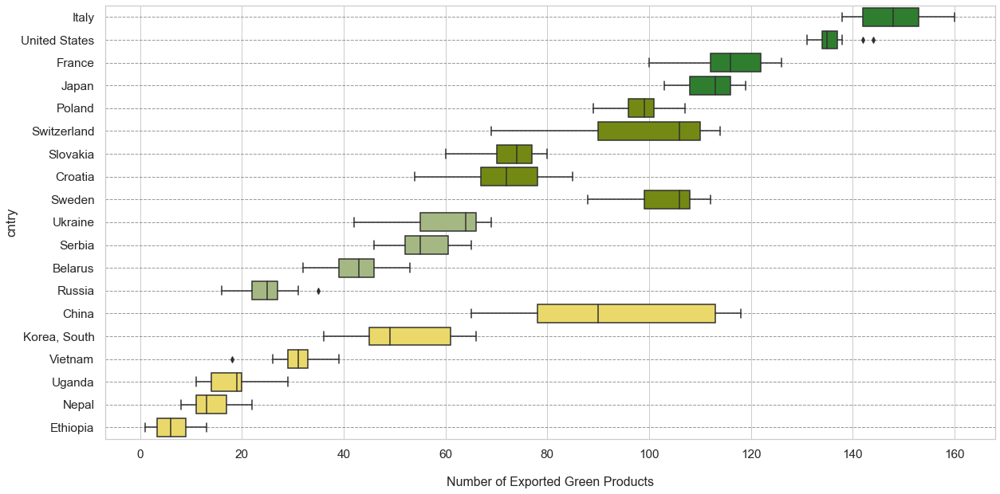

In [65]:
country_order = ['Italy', 'United States','France', 'Japan',
                 'Poland', 'Switzerland', 'Slovakia','Croatia','Sweden', 
                 'Ukraine', 'Serbia', 'Belarus', 'Russia', 
                 'China','Korea, South','Vietnam', 'Uganda','Nepal','Ethiopia']  
                 


#Define the colors in the desired order
colors = [ '#228B22','#228B22','#228B22','#228B22',
          #'#A9B200', '#A9B200','#A9B200','#A9B200','#7F9D00',
          '#7F9D00','#7F9D00','#7F9D00','#7F9D00','#7F9D00',
          #'#A8C17A','#A8C17A','#A8C17A','#A8C17A', '#A8C17A',
          #'#A9B200','#A9B200','#A9B200','#A9B200',
           '#A8C17A', '#A8C17A', '#A8C17A', '#A8C17A',
           '#FFE855','#FFE855','#FFE855','#FFE855','#FFE855','#FFE855']
          #'#D0C100','#D0C100','#FFE855','#D0C100',
          #'#A8C17A', '#A8C17A', '#A8C17A', '#A8C17A','#A8C17A','#A8C17A']
         #  '#98FF98', '#98FF98','#98FF98','#98FF98',
         # '#A9B200', '#D0C100','#7F9D00','#FFE855','#FFE855','#FFE855']
    

# Filter the DataFrame to include only rows where the year is less than 2016
filtered_df = RCA_cntry_ga[RCA_cntry_ga['year'] < 2016]

# Create a copy of the filtered DataFrame
dd = filtered_df.copy()
    
            
#dd = RCA_cntry_ga.copy()   



# Separate data based on status
major_developed_data = dd[dd['Economy_type'] == 'Major Developed ']['Products_Count']
developing_data = dd[dd['Economy_type'] == 'Developing']['Products_Count']
transitioning_data = dd[dd['Economy_type'] == 'Economy in Transition']['Products_Count']
developed_data = dd[dd['Economy_type'] == 'Developed']['Products_Count']


data_to_plot = [major_developed_data, developed_data, transitioning_data, developing_data]

# Create a custom palette using the specified colors
custom_palette = sns.color_palette(colors)


# Set the style parameters
sns.set(style='whitegrid', font_scale=1.4)

#plt.figure(figsize=(15, 8))  # Adjust the dimensions as needed
plt.figure(figsize=(20, 10))  # Adjust the dimensions as needed

# Create the boxplot and specify the color for the boxes and whiskers
sns.boxplot(x=dd['Products_Count'], y=dd['cntry'], order=country_order, palette=colors)
whiskerprops = dict(color='black')
    
# Customize labels and appearance
plt.xlabel("Number of Exported Green Products", size=16, labelpad=20)
    
# Set the grid lines to grey
plt.grid(axis='y', linestyle='--', alpha=0.8, color='grey')

for spine in ax.spines.values():
    spine.set_edgecolor('grey')  # Set frame color to black
    spine.set_linewidth(1)  # Set frame linewidth
    
plt.ylabel("", size=10)
# Adjust the figure size (you might want to tweak these dimensions)
# Adjust the figure size to spread it out vertically

# Save the plot as a PDF
#plt.savefig('boxplot0.pdf', format='pdf')
#plt.savefig('boxplot0.png', format='png')

# You can save the plot with the custom colors to a specific file path
#file_path = r'C:\Users\hanee\Hanin\Journal Paper 01\Extension\Results 2\DATA_EXTENSION\SEM Data\Graph\Final Figures\Number_of_competitively_exported_by_country_rev.png'
#plt.savefig(file_path, format='png')

# Display the plot
plt.show()

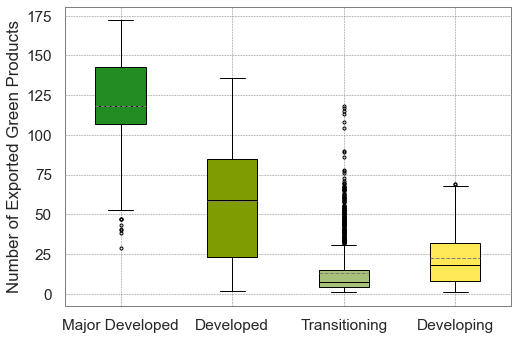

In [66]:

# Define the colors in the desired order
colors = ['#228B22', '#7F9D00', '#A8C17A', '#FFE855','#FFE855']
boxprops = dict(facecolor='#1F9D8A')
whiskerprops = dict(color='black')  # Light blue color for whiskers
medianprops = dict(color='black')  # Set median line color to black


# Filter the DataFrame to include only rows where the year is less than 2016
filtered_df = RCA_cntry_ga[RCA_cntry_ga['year'] < 2016]

# Create a copy of the filtered DataFrame
dd = filtered_df.copy()

# Separate data based on status
major_developed_data = dd.loc[dd['Economy_type'] == 'Major Developed ']['Products_Count']
developing_data = dd.loc[dd['Economy_type'] == 'Developing']['Products_Count']
transitioning_data = dd.loc[dd['Economy_type'] == 'Economy in Transition']['Products_Count']
developed_data = dd.loc[dd['Economy_type'] == 'Developed']['Products_Count']    


# Create a boxplot with custom colors for each category
fig, ax = plt.subplots()

data_to_plot = [major_developed_data, developed_data, developing_data, transitioning_data]

box_colors = [colors[0], colors[1], colors[2], colors[3],colors[4]]

bp = ax.boxplot(data_to_plot, patch_artist=True, meanline=True, showmeans=True, sym='.',boxprops=boxprops, whiskerprops=whiskerprops, medianprops=medianprops, meanprops={'color': 'grey'})


# Customize the x-axis labels
ax.set_xticklabels(['Major Developed', 'Developed', 'Transitioning', 'Developing'])
ax.set_facecolor('white')
plt.grid(color='grey', linestyle='--', linewidth=0.5)

for spine in ax.spines.values():
    spine.set_edgecolor('grey')  # Set frame color to black
    spine.set_linewidth(1)  # Set frame linewidth

# Add labels and title
ax.set_ylabel('Number of Exported Green Products')

# Customize box colors based on categories
for patch, color in zip(bp['boxes'], box_colors):
    patch.set(facecolor=color)

# Save the plot as a PDF
#plt.savefig('boxplot.pdf', format='pdf')
#plt.savefig('boxplot.png', format='png')

# You can save the plot with the custom colors to a specific file path
#file_path = r'C:\Users\hanee\Hanin\Journal Paper 01\Extension\Results 2\DATA_EXTENSION\SEM Data\Graph\Final Figures\Number_of_competitively_exported_by_country_economy.rev.png'
#plt.savefig(file_path, format='png')

# Display the plot
plt.show()

In [67]:
transitioning_data = dd.loc[dd['Economy_type'] == 'Economy in Transition']
transitioning_data.cntry.unique()

array(['Albania', 'Armenia', 'Azerbaijan', 'Belarus',
       'Bosnia and Herzegovina', 'Georgia', 'Kazakhstan', 'Kyrgyzstan',
       'Macedonia', 'Moldova', 'Montenegro', 'Russia', 'Serbia',
       'Tajikistan', 'Turkmenistan', 'Ukraine', 'Uzbekistan'],
      dtype=object)

### ANOVA Test - Green Capabilities Disparities

In [77]:
major_developed_data = RCA_cntry_ga[RCA_cntry_ga['Economy_type'] == 'Major Developed ']['Products_Count']
developing_data = RCA_cntry_ga[RCA_cntry_ga['Economy_type'] == 'Developing']['Products_Count']
transitioning_data = RCA_cntry_ga[RCA_cntry_ga['Economy_type'] == 'Economy in Transition']['Products_Count']
developed_data = RCA_cntry_ga[RCA_cntry_ga['Economy_type'] == 'Developed']['Products_Count']
All_developed_data = RCA_cntry_ga[(RCA_cntry_ga['Economy_type'] == 'Developed') | (RCA_cntry_ga['Economy_type'] == 'Major Developed ')]['Products_Count']

In [78]:
import pingouin as pg
import pandas as pd
import scipy.stats as stats

# Sample data for three groups

# Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(major_developed_data, developing_data, transitioning_data, developed_data)

# Print the results
print("F-statistic:", f_statistic)
print("P-value:", p_value)

# Check if the p-value is less than the significance level (e.g., 0.05) to determine statistical significance
alpha = 0.05
if p_value < alpha:
    print("The groups have different means (statistically significant).")

    # Perform Tukey's HSD post-hoc test for pairwise comparisons
    data = np.concatenate([major_developed_data, developing_data, transitioning_data,developed_data])
    labels = ['major_developed_data'] * len(major_developed_data) + ['developing_data'] * len(developing_data) +    ['transitioning_data'] * len(transitioning_data) + ['developed_data'] * len(developed_data) 

    df = pd.DataFrame({'Value': data, 'Group': labels})
    
    posthoc = pg.pairwise_gameshowell(data=df, dv='Value', between='Group')
    print(posthoc)
    #tukey = pairwise_tukeyhsd(data, labels)
    #print(tukey.summary())
else:
    print("The groups do not have different means (not statistically significant).")

F-statistic: 1232.0843844661822
P-value: 0.0
The groups have different means (statistically significant).
                      A                     B     mean(A)     mean(B)  \
0        developed_data       developing_data   58.369892   12.746640   
1        developed_data  major_developed_data   58.369892  117.171429   
2        developed_data    transitioning_data   58.369892   22.074380   
3       developing_data  major_developed_data   12.746640  117.171429   
4       developing_data    transitioning_data   12.746640   22.074380   
5  major_developed_data    transitioning_data  117.171429   22.074380   

         diff        se          T          df          pval    hedges  
0   45.623252  1.726863  26.419725  503.034571  1.099121e-13  2.165799  
1  -58.801536  3.886553 -15.129483  156.424486  0.000000e+00 -1.614450  
2   36.295512  2.041093  17.782393  702.343290  0.000000e+00  1.155770  
3 -104.424788  3.515743 -29.702057  106.024449  4.773959e-15 -6.131554  
4   -9.327740  1.

In [79]:
major_developed_data = dd[dd['Economy_type'] == 'Major Developed ']['Products_Count']
developing_data = dd[dd['Economy_type'] == 'Developing']['Products_Count']
transitioning_data = dd[dd['Economy_type'] == 'Economy in Transition']['Products_Count']
developed_data = dd[dd['Economy_type'] == 'Developed']['Products_Count']
All_developed_data = dd[(dd['Economy_type'] == 'Developed') | (dd['Economy_type'] == 'Major Developed ')]['Products_Count']

In [80]:

import pingouin as pg
import pandas as pd
import scipy.stats as stats

# Sample data for three groups

# Perform one-way ANOVA
f_statistic, p_value = stats.f_oneway(major_developed_data, developing_data, transitioning_data,developed_data)

# Print the results
print("F-statistic:", f_statistic)
print("P-value:", p_value)

# Check if the p-value is less than the significance level (e.g., 0.05) to determine statistical significance
alpha = 0.05
if p_value < alpha:
    print("The groups have different means (statistically significant).")

    # Perform Tukey's HSD post-hoc test for pairwise comparisons
    data = np.concatenate([major_developed_data, developing_data, transitioning_data,developed_data])
    labels = ['major_developed_data'] * len(major_developed_data) + ['developing_data'] * len(developing_data) +    ['transitioning_data'] * len(transitioning_data) + ['developed_data'] * len(developed_data) 

    df = pd.DataFrame({'Value': data, 'Group': labels})
    
    posthoc = pg.pairwise_gameshowell(data=df, dv='Value', between='Group')
    print(posthoc)
    #tukey = pairwise_tukeyhsd(data, labels)
    #print(tukey.summary())
else:
    print("The groups do not have different means (not statistically significant).")

F-statistic: 1082.6793967234441
P-value: 0.0
The groups have different means (statistically significant).
                      A                     B     mean(A)     mean(B)  \
0        developed_data       developing_data   58.491315   12.899194   
1        developed_data  major_developed_data   58.491315  118.461538   
2        developed_data    transitioning_data   58.491315   22.282297   
3       developing_data  major_developed_data   12.899194  118.461538   
4       developing_data    transitioning_data   12.899194   22.282297   
5  major_developed_data    transitioning_data  118.461538   22.282297   

         diff        se          T          df          pval    hedges  
0   45.592122  1.850984  24.631285  435.709591  2.916556e-13  2.170507  
1  -59.970223  4.179023 -14.350296  135.005676  7.505108e-14 -1.648500  
2   36.209018  2.204102  16.428014  609.095482  2.911005e-13  1.151960  
3 -105.562345  3.782829 -27.905658   91.733075  2.653433e-14 -6.219729  
4   -9.383103  1.

# PART 2: Green Sector Space Generation

In [81]:
RCA_df = exports_All[exports_All['year'] < 2016]  

In [82]:
RCA_df.rename(columns = {'rca':'RCA'}, inplace = True)
RCA_df.HSCode.nunique()

5219

In [83]:
RCA_df.head()

,year,origin,HSCode,export_val,import_val,export_rca,import_rca,cntry,ORG,Medium,...,Color,gp2,categ_no,Category,Category_Num,Category_Color,cntry_export,prod_export,world_export,RCA
0,2003,ago,010110,NaN,2739.0,NaN,0.003994,Angola,AGO,Not Green,...,NaN,No,01,Agriculture,1,yellow,7.575925e+09,1.193018e+09,7.412907e+12,NaN
1,2003,ago,010190,NaN,15691.0,NaN,0.038321,Angola,AGO,Not Green,...,NaN,No,01,Agriculture,1,yellow,7.575925e+09,7.123363e+08,7.412907e+12,NaN
2,2003,ago,010290,17821.54,2566670.0,0.005119,1.310820,Angola,AGO,Not Green,...,NaN,No,01,Agriculture,1,yellow,7.575925e+09,3.406397e+09,7.412907e+12,0.005119
3,2003,ago,010410,NaN,32997.0,NaN,0.068981,Angola,AGO,Not Green,...,NaN,No,01,Agriculture,1,yellow,7.575925e+09,8.321685e+08,7.412907e+12,NaN
4,2003,ago,010420,6711.52,16355.0,0.067391,0.291989,Angola,AGO,Not Green,...,NaN,No,01,Agriculture,1,yellow,7.575925e+09,9.744354e+07,7.412907e+12,0.067394


In [104]:
def relatednessSector(initial_year,final_year,origin,th):
    initial_df = RCA_df.loc[(RCA_df.year == initial_year) & (RCA_df.origin == origin) & (RCA_df.gp2 == 'Yes')] #RCA_df[initial_year]

    final_df = RCA_df.loc[(RCA_df.year == final_year) & (RCA_df.origin == origin) & (RCA_df.gp2 == 'Yes')] #RCA_df[final_year]
    
    
    ## Temporary variable.. check original data
    initial_df['Time'] = initial_year
    final_df['Time'] = final_year
    
    
    # new green products
    new_gp_list = pd.merge(initial_df.loc[(initial_df.origin == origin) & (initial_df.RCA < th )],
                           final_df.loc[(final_df.origin == origin) & (final_df.RCA >=1)], how ='inner', on = ["origin","HSCode", 'Medium'])

    new_gp_list = new_gp_list[['origin','HSCode','Medium','year_x','year_y','RCA_x','RCA_y']]
    print(new_gp_list)## correct
    if len(new_gp_list) != 0 : 
        new_product = new_gp_list.HSCode.unique()
        #print(new_product)## correct
        #new_product = new_gp_list['HSCode'].tolist()
        #new_product = new_gp_list[:,0]
        #print(new_product)
        #new_gp_list['P2'] = 
        
        RCA1 = mcp[initial_year][mcp[initial_year].index == origin]
        #print(RCA1)
        RCA1 = RCA1.loc[:, (RCA1 != 0).any(axis=0)]
        relatedness = proximity[initial_year]
        
        relatedness = relatedness.filter(items = new_gp_list.HSCode, axis = 0)
        relatedness = relatedness.filter(items = RCA1.columns)
        #print("check2",relatedness)
    
        #relatedness = relatedness.fillna(0) 
    
           
        relatedness2 = relatedness.T
        #print(relatedness2)
        relatedness3 = relatedness.T
        #print(relatedness3)
        
        relatedness2.reset_index(inplace=True)
        #print(relatedness2)
        relatedness22 = relatedness2.copy()
        #relatedness22.replace(1, 0, inplace=True)
        #print(relatedness22)
        
        Maxx = relatedness22.max() 
        #print(Maxx)
        MaxV = pd.DataFrame(Maxx)
        #print(MaxV)
        MaxV.reset_index(inplace=True)
        
        MaxV.rename(columns = {'productcode1':'HSCode'}, inplace = True)
        MaxV.rename(columns = {0:'Max_proximity'}, inplace = True)
        new_gp = pd.merge(new_gp_list,MaxV, on= ["HSCode"] , how = "inner")
        #print(type(relatedness3))
        TEST = new_gp['Max_proximity'].tolist()
        new = pd.DataFrame()
        for p in new_product:
            #newp = pd.DataFrame()
            for t in TEST:
                #print(relatedness3.index[relatedness3[p]==t].tolist())
                Test2 = relatedness3.index[relatedness3[p]==t].tolist()
                k = [relatedness3.index[relatedness3[p]==t]]
                Test3 = {'Max_proximity': [t],'HSCode': [p], 'P2_Original':k}
                Testt = pd.DataFrame(Test3)
                #print('Test3',Test3)
                new = new.append(Testt)
                #print(new)
        
        Final = pd.DataFrame(new)
        #print('Final',Final)
            
        new_gp2 = pd.merge(new_gp,new, on= ["HSCode","Max_proximity"] , how = "inner")  
        new_gp2['RCA_threshold'] = th
        #print(new_gp2)
        df = pd.DataFrame(new_gp2)
        
        
    else:
        
        print("The list is empty.")
        
        data = {'origin':origin, 'HSCode':  [0],'Max_proximity': [0],'P2_Original':[0],'Medium': [0], 'year_x': initial_year ,'year_y':final_year,'RCA_x': [0],'RCA_y':[0]}
        df = pd.DataFrame(data)
        
    return df

In [89]:
# Suppress specific warning
warnings.simplefilter(action='ignore', category=FutureWarning)

# It's good practice to reset the warning filter if needed for other parts of your code
#warnings.simplefilter(action='default', category=FutureWarning)

In [105]:
#Testing the code
relatednessSector(2003,2013, 'swe' ,0.5)

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    swe  390940    HEM    2003    2013  0.399030  1.227566
1    swe  840681    REP    2003    2013  0.423303  1.290201
2    swe  841011    REP    2003    2013  0.497282  1.758912
3    swe  851420    SWM    2003    2013  0.373650  1.304277


,origin,HSCode,Medium,year_x,year_y,RCA_x,RCA_y,Max_proximity,P2_Original,RCA_threshold
0,swe,390940,HEM,2003,2013,0.399030,1.227566,0.529412,"Index(['480269', '721240', '722011', '870810']...",0.5
1,swe,840681,REP,2003,2013,0.423303,1.290201,0.625,"Index(['841231'], dtype='object', name='produc...",0.5
2,swe,841011,REP,2003,2013,0.497282,1.758912,0.647059,"Index(['480269'], dtype='object', name='produc...",0.5
3,swe,851420,SWM,2003,2013,0.373650,1.304277,0.6,"Index(['841920'], dtype='object', name='produc...",0.5


In [91]:
origins = RCA_df.origin.unique()
years = RCA_df.year.unique()

In [92]:
years

array([2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013,
       2014, 2015], dtype=int64)

In [ ]:
## I did_origins, missing1, Missing2 and complied at the end due to computer memory limitation
out3 = pd.DataFrame()
for origin in origins:
    for y in years:
        out =  relatednessSector(y,y+10, origin ,0.5)
        out1 = pd.DataFrame(out)
        out3 = out3.append(out1)

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ben  841381    WAT    2004    2014  0.094683  1.144745
[0.37037037037037035]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ben  841440    APC    2005    2015  0.065212  6.071004
1    ben  846291    SWM    2005    2015  0.033671  5.207211
[0.36, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    bfa  841440    APC    2004    2014  0.346844  4.290397
1    bfa  901590    MON    2004    2014  0.126350  1.014863
[0.36666666666666664, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    civ  901590    MON    2003    2013  0.178747  1.434632
[0.3076923076923077]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    civ  890790    SWR    2004    2014  0.014900  10.968972
1    civ  901590    MON    2004    2014  0.051403   1.054952
[0.35714285714285715, 0.3225806451612903]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    civ  392010    SWM    2005    2015  0.049490  1.457266
1    civ  901590    MON    2005    2015  0.045905  3.408062
[0.5588235294117647, 0.32]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cmr  848130    WAT    2004    2014  0.161007  1.739202
1    cmr  901580    MON    2004    2014  0.382848  4.822411
2    cmr  901590    MON    2004    2014  0.083919  6.231602
3    cmr  903090    MON    2004    2014  0.068848  2.851625
[0.3333333333333333, 0.25, 0.24, 0.1875]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cmr  841381    WAT    2005    2015  0.499992  1.011922
1    cmr  842940    SWM    2005    2015  0.175186  1.668125
2    cmr  901580    MON    2005    2015  0.107434  1.473283
3    cmr  901590    MON    2005    2015  0.020700  7.070150
[0.32, 0.34782608695652173, 0.36363636363636365, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cog  901580    MON    2003    2013  0.213679  2.383983
1    cog  901590    MON    2003    2013  0.014681  1.079123
[0.25925925925925924, 0.23809523809523808]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cog  890790    SWR    2004    2014  0.010049  1.667164
1    cog  901580    MON    2004    2014  0.023897  3.637666
2    cog  901590    MON    2004    2014  0.117276  3.567025
3    cog  902680    MON    2004    2014  0.231535  1.890363
4    cog  903089    MON    2004    2014  0.145744  2.005888
[0.22727272727272727, 0.25, 0.24, 0.4, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cpv  903039    MON    2003    2013  0.379852  2.391532
[0.47058823529411764]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cpv  840999    NVA    2005    2015  0.285808  1.923311
[0.5357142857142857]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    dji  732690    WAT    2005    2015  0.037042  9.880550
1    dji  848190    WAT    2005    2015  0.059102  1.447398
2    dji  903210    MON    2005    2015  0.079352  7.925998
[0.5769230769230769, 0.5789473684210527, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    egy  392111    HEM    2003    2013  0.144704  1.085054
1    egy  732190    CRE    2003    2013  0.273366  2.633357
2    egy  732490    WAT    2003    2013  0.245467  2.491863
3    egy  841790    SWM    2003    2013  0.065303  3.051292
4    egy  850421    REP    2003    2013  0.004733  2.812952
5    egy  850422    REP    2003    2013  0.215658  1.686479
6    egy  902830    HEM    2003    2013  0.010002  5.565838
[0.5925925925925926, 0.5, 0.48148148148148145, 0.5714285714285714, 0.4634146341463415, 0.5161290322580645, 0.4090909090909091]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    egy  392010    SWM    2004    2014  0.167028  1.127817
1    egy  732190    CRE    2004    2014  0.433563  1.488317
2    egy  732490    WAT    2004    2014  0.219312  3.418468
3    egy  761100    REP    2004    2014  0.131216  1.385854
4    egy  761290    SWM    2004    2014  0.001667  2.459821
5    egy  841790    SWM    2004    2014  0.093125  2.622905
6    egy  850421    REP    2004    2014  0.024053  4.332588
7    egy  851629    SWR    2004    2014  0.015999  3.124149
8    egy  902830    HEM    2004    2014  0.002054  3.313852
[0.5428571428571428, 0.52, 0.6190476190476191, 0.6, 0.4838709677419355, 0.5, 0.5121951219512195, 0.4375, 0.4444444444444444]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    egy  392010    SWM    2005    2015  0.091534  1.375228
1    egy  732190    CRE    2005    2015  0.164654  2.386276
2    egy  732490    WAT    2005    2015  0.227860  3.286367
3    egy  851629    SWR    2005    2015  0.000893  3.252456
4    egy  853720    REP    2005    2015  0.338290  1.109287
5    egy  902810    MON    2005    2015  0.337131  2.121014
6    egy  902830    HEM    2005    2015  0.223956  7.775142
[0.6176470588235294, 0.5217391304347826, 0.6086956521739131, 0.4444444444444444, 0.5, 0.5, 0.4482758620689655]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    eth  850680    CRE    2004    2014  0.045916  1.206879
[0.391304347826087]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gab  901580    MON    2003    2013  0.091854  1.554532
1    gab  901590    MON    2003    2013  0.330913  1.053211
[0.23333333333333334, 0.23809523809523808]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gab  730690    WAT    2004    2014  0.081176  3.147689
1    gab  901590    MON    2004    2014  0.425995  3.568201
[0.475, 0.43333333333333335]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gab  901580    MON    2005    2015  0.353684  2.251287
[0.2608695652173913]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gha  901590    MON    2003    2013  0.009038  1.534241
[0.38095238095238093]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gha  392510    REP    2004    2014  0.199716  1.725554
1    gha  730690    WAT    2004    2014  0.168515  1.255729
2    gha  841320    WAT    2004    2014  0.401599  1.315602
[0.5238095238095238, 0.5, 0.4230769230769231]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gha  730690    WAT    2005    2015  0.291557  1.153114
[0.5106382978723404]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gin  901580    MON    2005    2015  0.125115  2.143713
[0.36363636363636365]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gmb  871419    CRE    2004    2014  0.098229  1.773574
[0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ken  681019    HEM    2003    2013  0.161627  1.902820
1    ken  730820    REP    2003    2013  0.345249  1.306240
2    ken  840490    APC    2003    2013  0.013378  1.235387
3    ken  841090    REP    2003    2013  0.352991  1.599255
4    ken  841280    REP    2003    2013  0.347929  2.783840
5    ken  847982    SWM    2003    2013  0.026673  1.189362
6    ken  850161    REP    2003    2013  0.488091  4.831784
7    ken  871639    CRE    2003    2013  0.123636  1.127681
8    ken  901580    MON    2003    2013  0.199364  2.198115
9    ken  901590    MON    2003    2013  0.237473  2.090639
[0.5217391304347826, 0.5555555555555556, 0.5238095238095238, 0.48484848484848486, 0.4, 0.5294117647058824, 0.4090909090909091, 0.52, 0.3333333333333333, 0.3103448275862069]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ken  392010    SWM    2004    2014  0.463369  1.635214
1    ken  730630    WAT    2004    2014  0.319807  1.038120
2    ken  841280    REP    2004    2014  0.010217  1.208376
3    ken  841960    APC    2004    2014  0.028256  3.743336
4    ken  850161    REP    2004    2014  0.216437  2.125902
5    ken  850680    CRE    2004    2014  0.452617  4.138136
6    ken  860800    CRE    2004    2014  0.008530  5.138598
7    ken  871639    CRE    2004    2014  0.024876  1.052403
8    ken  901590    MON    2004    2014  0.010574  3.057466
9    ken  903089    MON    2004    2014  0.138493  1.417776
[0.5428571428571428, 0.5161290322580645, 0.36363636363636365, 0.46153846153846156, 0.391304347826087, 0.4166666666666667, 0.4444444444444444, 0.5, 0.2962962962962963, 0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ken  730820    REP    2005    2015  0.488042  1.442806
[0.5208333333333334]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    lbr  850164    REP    2003    2013  0.484965  1.192536
[0.5217391304347826]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    mar  730820    REP    2003    2013  0.097533   1.589135
1    mar  761290    SWM    2003    2013  0.006754   4.649457
2    mar  841940    SWM    2003    2013  0.004502   1.326905
3    mar  847420    SWM    2003    2013  0.139834   1.245977
4    mar  850431    REP    2003    2013  0.213313   1.144334
5    mar  853090    CRE    2003    2013  0.016667   4.924751
6    mar  854390    WAT    2003    2013  0.068074   1.652718
7    mar  871411    CRE    2003    2013  0.342622  15.279706
[0.5526315789473685, 0.5833333333333334, 0.45, 0.42857142857142855, 0.5757575757575758, 0.43478260869565216, 0.42105263157894735, 0.4666666666666667]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mar  761290    SWM    2004    2014  0.057673  6.581056
1    mar  850431    REP    2004    2014  0.122190  1.305470
2    mar  853090    CRE    2004    2014  0.058592  8.216539
3    mar  853710    REP    2004    2014  0.126501  1.434076
4    mar  854390    WAT    2004    2014  0.204864  2.151230
[0.5161290322580645, 0.5625, 0.48148148148148145, 0.5714285714285714, 0.45]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mar  681019    HEM    2005    2015  0.472382  4.209104
1    mar  761290    SWM    2005    2015  0.045206  6.150138
2    mar  850431    REP    2005    2015  0.305811  1.224415
3    mar  853090    CRE    2005    2015  0.040810  7.856984
4    mar  853710    REP    2005    2015  0.258823  2.194037
5    mar  854390    WAT    2005    2015  0.497507  1.226721
[0.5, 0.48484848484848486, 0.5277777777777778, 0.43478260869565216, 0.5, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mdg  841440    APC    2003    2013  0.297958  5.649303
1    mdg  850161    REP    2003    2013  0.057534  1.415189
2    mdg  902610    MON    2003    2013  0.111351  1.553508
[0.42105263157894735, 0.4090909090909091, 0.65]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mdg  841350    WAT    2004    2014  0.016011  2.428178
1    mdg  902610    MON    2004    2014  0.089798  1.110213
[0.36363636363636365, 0.5294117647058824]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mli  871419    CRE    2003    2013  0.113391  1.076503
[0.375]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    moz  730690    WAT    2003    2013  0.055376  2.104105
1    moz  840420    APC    2003    2013  0.106111  1.137769
2    moz  842119    SWR    2003    2013  0.354396  1.233823
3    moz  848110    WAT    2003    2013  0.278092  1.476796
4    moz  860699    CRE    2003    2013  0.326293  4.378752
5    moz  890790    SWR    2003    2013  0.076117  3.034832
6    moz  901580    MON    2003    2013  0.154848  4.090428
7    moz  901590    MON    2003    2013  0.206779  9.795328
8    moz  903010    MON    2003    2013  0.046066  4.646351
[0.39473684210526316, 0.4117647058823529, 0.55, 0.47058823529411764, 0.5, 0.375, 0.3333333333333333, 0.2916666666666667, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    moz  380210    WAT    2004    2014  0.204121  6.996972
1    moz  901580    MON    2004    2014  0.243383  5.181905
[0.3181818181818182, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    moz  390940    HEM    2005    2015  0.021848  1.395713
1    moz  730820    REP    2005    2015  0.008926  1.249987
2    moz  850680    CRE    2005    2015  0.375412  1.882315
3    moz  901580    MON    2005    2015  0.345100  4.673624
4    moz  901590    MON    2005    2015  0.034801  5.015316
5    moz  903010    MON    2005    2015  0.130837  2.811621
6    moz  903089    MON    2005    2015  0.024380  1.017923
[0.3888888888888889, 0.5208333333333334, 0.3548387096774194, 0.22580645161290322, 0.2916666666666667, 0.3181818181818182, 0.4117647058823529]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mus  560790    EPP    2003    2013  0.123636  4.448101
1    mus  560811    NRP    2003    2013  0.430882  2.815006
2    mus  841440    APC    2003    2013  0.131034  7.689847
3    mus  846599    SWM    2003    2013  0.010790  2.323346
4    mus  847420    SWM    2003    2013  0.158535  1.299570
5    mus  854390    WAT    2003    2013  0.006111  1.003147
[0.4864864864864865, 0.4642857142857143, 0.4444444444444444, 0.47619047619047616, 0.4827586206896552, 0.42105263157894735]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mus  854390    WAT    2004    2014  0.342000  1.066539
1    mus  903089    MON    2004    2014  0.048145  3.387889
[0.5555555555555556, 0.6428571428571429]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mus  560790    EPP    2005    2015  0.129317  1.066320
1    mus  730900    WAT    2005    2015  0.193557  1.504277
2    mus  840420    APC    2005    2015  0.056633  2.182737
3    mus  842191    SWR    2005    2015  0.020968  1.316996
4    mus  850239    REP    2005    2015  0.111468  8.994297
[0.54, 0.6, 0.3888888888888889, 0.5263157894736842, 0.3888888888888889]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mwi  392510    REP    2003    2013  0.110341  1.293556
1    mwi  840510    APC    2003    2013  0.114425  3.796329
2    mwi  842940    SWM    2003    2013  0.059072  8.041999
[0.39473684210526316, 0.35714285714285715, 0.5238095238095238]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mwi  841440    APC    2004    2014  0.372742  3.449644
1    mwi  847982    SWM    2004    2014  0.241405  3.832453
2    mwi  901540    MON    2004    2014  0.352696  2.046782
[0.38235294117647056, 0.36363636363636365, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mwi  842940    SWM    2005    2015  0.091332  7.745515
1    mwi  902820    MON    2005    2015  0.192304  1.566300
[0.5, 0.4166666666666667]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ner  842940    SWM    2003    2013  0.130107  3.747023
1    ner  902790    MON    2003    2013  0.037638  1.107263
[0.3793103448275862, 0.45]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ner  841440    APC    2004    2014  0.037858  1.278617
1    ner  901580    MON    2004    2014  0.037019  7.269538
[0.42857142857142855, 0.2903225806451613]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    nga  731010    WAT    2004    2014  0.002944  7.994319
[0.375]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    rwa  901580    MON    2005    2015  0.117286  1.947084
[0.3181818181818182]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    sen  730431    WAT    2003    2013  0.096046  25.694918
1    sen  730490    WAT    2003    2013  0.268011   1.105532
2    sen  902730    MON    2003    2013  0.014756   1.626651
[0.42857142857142855, 0.4166666666666667, 0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     sen  392510    REP    2004    2014  0.334127   4.065158
1     sen  730490    WAT    2004    2014  0.384026   1.872415
2     sen  732190    CRE    2004    2014  0.067889   1.119186
3     sen  842940    SWM    2004    2014  0.449645   1.651597
4     sen  846599    SWM    2004    2014  0.005817  11.321749
5     sen  847420    SWM    2004    2014  0.125757   1.259997
6     sen  850164    REP    2004    2014  0.345210   1.868568
7     sen  850239    REP    2004    2014  0.379576   2.421624
8     sen  850300    REP    2004    2014  0.177571   1.360309
9     sen  850432    REP    2004    2014  0.123334   2.072223
10    sen  850433    REP    2004    2014  0.233940   4.932509
[0.5476190476190477, 0.4642857142857143, 0.44, 0.5, 0.47619047619047616, 0.5277777777777778, 0.4166666666666667, 0.35294117647058826, 0.5, 0.41379310344827586, 0.44]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sen  840510    APC    2005    2015  0.026075  4.437368
1    sen  842119    SWR    2005    2015  0.022879  3.758521
2    sen  842940    SWM    2005    2015  0.342506  2.742090
3    sen  850239    REP    2005    2015  0.138019  1.134741
4    sen  850421    REP    2005    2015  0.097727  1.067830
5    sen  902720    MON    2005    2015  0.085778  1.962551
[0.35714285714285715, 0.5625, 0.3076923076923077, 0.3888888888888889, 0.5227272727272727, 0.45454545454545453]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    shn  840991    NVA    2003    2013  0.043623  1.421399
[0.5294117647058824]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sle  730900    WAT    2004    2014  0.177174  1.088191
[0.575]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    stp  732690    WAT    2003    2013  0.164243  1.029104
[0.5806451612903226]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    stp  848180    WAT    2005    2015  0.054851  1.549592
1    stp  850431    REP    2005    2015  0.272768  1.857102
[0.6086956521739131, 0.45]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    syc  841989    WAT    2003    2013  0.105541  2.133574
[0.47058823529411764]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    syc  841581    REP    2005    2015  0.109652  5.556321
[0.3888888888888889]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y    RCA_x     RCA_y
0    tgo  903180    MON    2003    2013  0.00961  1.099857
[0.3125]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y   RCA_x     RCA_y
0    tgo  871419    CRE    2004    2014  0.4704  1.410439
[0.4666666666666667]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     tun  392010    SWM    2003    2013  0.081413  3.864410
1     tun  681019    HEM    2003    2013  0.373123  2.550212
2     tun  730630    WAT    2003    2013  0.443232  2.543136
3     tun  732510    WAT    2003    2013  0.089617  3.185048
4     tun  732690    WAT    2003    2013  0.479020  1.302895
5     tun  841280    REP    2003    2013  0.408681  1.057167
6     tun  841919    REP    2003    2013  0.102035  1.721657
7     tun  842119    SWR    2003    2013  0.190013  2.244522
8     tun  848190    WAT    2003    2013  0.040785  1.412497
9     tun  850422    REP    2003    2013  0.232966  1.348822
10    tun  851629    SWR    2003    2013  0.087470  1.046292
11    tun  853720    REP    2003    2013  0.215632  1.232992
12    tun  890790    SWR    2003    2013  0.439500  3.383850
13    tun  901530    MON    2003    2013  0.033309  1.175371
14    tun  901540    MON    2003    2013  0.064712  3.132164
15    tun  902810    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     tun  392010    SWM    2004    2014  0.117394   3.577886
1     tun  732510    WAT    2004    2014  0.054960   3.050930
2     tun  840999    NVA    2004    2014  0.379521   3.493341
3     tun  841919    REP    2004    2014  0.047601   1.413593
4     tun  842119    SWR    2004    2014  0.480174   1.671342
5     tun  842129    WAT    2004    2014  0.210556   1.029464
6     tun  848130    WAT    2004    2014  0.052603   1.798716
7     tun  848190    WAT    2004    2014  0.113211   1.359658
8     tun  850440    REP    2004    2014  0.131974   1.057090
9     tun  871492    CRE    2004    2014  0.023388   1.217320
10    tun  890790    SWR    2004    2014  0.316145   5.979219
11    tun  902519    MON    2004    2014  0.006810   1.257194
12    tun  902750    MON    2004    2014  0.008391   1.009722
13    tun  902890    HEM    2004    2014  0.223526  10.897112
14    tun  903031    MON    2004    2014  0.013891   4.358956
15    tu

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     tun  392010    SWM    2005    2015  0.162042   2.400743
1     tun  732510    WAT    2005    2015  0.222390   2.617863
2     tun  841440    APC    2005    2015  0.056531   1.128114
3     tun  842119    SWR    2005    2015  0.015738   1.720107
4     tun  848130    WAT    2005    2015  0.031781   1.791694
5     tun  848190    WAT    2005    2015  0.372341   1.456111
6     tun  850300    REP    2005    2015  0.497759   3.120399
7     tun  850421    REP    2005    2015  0.145767  10.400141
8     tun  850422    REP    2005    2015  0.410477   2.581205
9     tun  860729    CRE    2005    2015  0.062802   1.083502
10    tun  890790    SWR    2005    2015  0.340429   1.369400
11    tun  903031    MON    2005    2015  0.037627   3.513279
12    tun  903039    MON    2005    2015  0.434235   2.555574
13    tun  903289    REP    2005    2015  0.053039   1.165781
[0.5882352941176471, 0.5925925925925926, 0.34615384615384615, 0.5625, 

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    tza  730690    WAT    2003    2013  0.149674  7.283246
1    tza  847989    SWM    2003    2013  0.045853  2.024666
[0.48717948717948717, 0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    tza  731029    WAT    2004    2014  0.022677  1.241886
1    tza  842940    SWM    2004    2014  0.012006  1.023306
2    tza  847420    SWM    2004    2014  0.036790  1.111194
3    tza  850162    REP    2004    2014  0.099726  1.666383
4    tza  902680    MON    2004    2014  0.027706  1.127704
5    tza  903010    MON    2004    2014  0.109340  1.333513
[0.4864864864864865, 0.3333333333333333, 0.4, 0.42857142857142855, 0.3333333333333333, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    tza  730300    WAT    2005    2015  0.069596   2.758335
1    tza  731010    WAT    2005    2015  0.122270  24.434241
[0.4230769230769231, 0.5135135135135135]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    uga  730690    WAT    2003    2013  0.144213  64.362115
1    uga  730900    WAT    2003    2013  0.098065   2.232517
2    uga  842940    SWM    2003    2013  0.461389   1.076014
3    uga  850161    REP    2003    2013  0.352755   3.199191
4    uga  850162    REP    2003    2013  0.048368   1.182101
5    uga  850163    REP    2003    2013  0.220717   2.220693
6    uga  871499    CRE    2003    2013  0.133924   1.028591
7    uga  903010    MON    2003    2013  0.417364   1.267105
8    uga  903089    MON    2003    2013  0.121356   1.290890
[0.5121951219512195, 0.5405405405405406, 0.5238095238095238, 0.375, 0.38095238095238093, 0.4375, 0.35294117647058826, 0.4, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    uga  730900    WAT    2004    2014  0.120248  2.252109
1    uga  731010    WAT    2004    2014  0.111287  2.786314
2    uga  841960    APC    2004    2014  0.042207  1.896908
3    uga  850161    REP    2004    2014  0.487969  2.368631
4    uga  850433    REP    2004    2014  0.237593  1.030670
5    uga  903010    MON    2004    2014  0.237925  2.233086
[0.6, 0.4772727272727273, 0.5, 0.42857142857142855, 0.47058823529411764, 0.38095238095238093]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    uga  560790    EPP    2005    2015  0.243849  2.558684
1    uga  730300    WAT    2005    2015  0.090136  1.755778
2    uga  730820    REP    2005    2015  0.044765  1.703414
3    uga  730900    WAT    2005    2015  0.246789  1.328556
4    uga  850162    REP    2005    2015  0.320116  2.223845
5    uga  903089    MON    2005    2015  0.018966  2.633556
[0.5208333333333334, 0.4230769230769231, 0.5208333333333334, 0.5111111111111111, 0.42857142857142855, 0.375]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    zaf  730240    CRE    2003    2013  0.219043  2.445818
1    zaf  731029    WAT    2003    2013  0.363111  1.309447
2    zaf  840219    SWM    2003    2013  0.313025  1.057804
3    zaf  842833    SWM    2003    2013  0.427194  1.616009
4    zaf  842940    SWM    2003    2013  0.265449  1.079567
5    zaf  851430    SWM    2003    2013  0.205632  1.092418
6    zaf  851490    SWM    2003    2013  0.192802  1.134706
7    zaf  860210    CRE    2003    2013  0.023192  2.081878
8    zaf  860290    CRE    2003    2013  0.298274  6.888637
9    zaf  860699    CRE    2003    2013  0.146250  2.283344
[0.5882352941176471, 0.6285714285714286, 0.4666666666666667, 0.5652173913043478, 0.42857142857142855, 0.38461538461538464, 0.5555555555555556, 0.6190476190476191, 0.45454545454545453, 0.4782608695652174]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    zaf  730230    CRE    2004    2014  0.073037  1.845509
1    zaf  731029    WAT    2004    2014  0.460558  1.548998
2    zaf  841012    REP    2004    2014  0.004030  4.302334
3    zaf  850162    REP    2004    2014  0.326780  1.202857
4    zaf  860390    CRE    2004    2014  0.052128  1.750821
5    zaf  860500    CRE    2004    2014  0.014078  1.022010
6    zaf  860692    CRE    2004    2014  0.003681  3.584707
7    zaf  860699    CRE    2004    2014  0.315912  1.355954
8    zaf  902890    HEM    2004    2014  0.141118  1.483728
[0.6086956521739131, 0.5652173913043478, 0.6111111111111112, 0.45, 0.42857142857142855, 0.5454545454545454, 0.42857142857142855, 0.42857142857142855, 0.5172413793103449]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    zaf  840510    APC    2005    2015  0.186201  4.200814
1    zaf  842191    SWR    2005    2015  0.465376  1.109659
2    zaf  842220    SWM    2005    2015  0.338599  1.059978
3    zaf  850239    REP    2005    2015  0.084254  1.136411
4    zaf  851490    SWM    2005    2015  0.488056  3.536972
5    zaf  860290    CRE    2005    2015  0.181720  3.948946
6    zaf  860699    CRE    2005    2015  0.184559  1.024859
[0.45454545454545453, 0.5, 0.45, 0.4444444444444444, 0.5, 0.47368421052631576, 0.5555555555555556]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    zmb  681091    HEM    2003    2013  0.021372  2.058285
1    zmb  730300    WAT    2003    2013  0.327128  1.078013
2    zmb  841280    REP    2003    2013  0.031041  1.525589
[0.4375, 0.375, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    zwe  841280    REP    2003    2013  0.209709  1.034491
[0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    zwe  860729    CRE    2004    2014  0.056665  1.573912
[0.5263157894736842]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    zwe  450490    HEM    2005    2015  0.070331  1.589541
1    zwe  731010    WAT    2005    2015  0.450284  1.915024
[0.35, 0.45714285714285713]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    afg  854390    WAT    2003    2013  0.163993  2.454125
[0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    are  680800    HEM    2003    2013  0.234847  2.313519
1    are  681091    HEM    2003    2013  0.034070  1.609601
2    are  700800    HEM    2003    2013  0.310836  3.224366
3    are  701939    HEM    2003    2013  0.092675  4.088657
4    are  730290    CRE    2003    2013  0.084833  7.078022
5    are  730300    WAT    2003    2013  0.286109  4.054686
6    are  730490    WAT    2003    2013  0.474339  3.283220
7    are  730690    WAT    2003    2013  0.491407  4.547680
8    are  842121    WAT    2003    2013  0.375291  1.175459
[0.5, 0.5217391304347826, 0.4444444444444444, 0.4, 0.4857142857142857, 0.3888888888888889, 0.46153846153846156, 0.475, 0.4827586206896552]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    are  680610    HEM    2004    2014  0.302009  1.441079
1    are  680800    HEM    2004    2014  0.183330  2.191223
2    are  681091    HEM    2004    2014  0.188803  1.405809
3    are  840420    APC    2004    2014  0.209840  2.457163
4    are  841940    SWM    2004    2014  0.180784  2.051084
5    are  850422    REP    2004    2014  0.404567  3.149862
6    are  940540    HEM    2004    2014  0.130218  1.366819
[0.5, 0.47619047619047616, 0.5, 0.4666666666666667, 0.5, 0.4473684210526316, 0.45454545454545453]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    are  540500    HEM    2005    2015  0.006141  4.060743
1    are  680800    HEM    2005    2015  0.127191  2.423547
2    are  681011    HEM    2005    2015  0.351112  1.898248
3    are  681091    HEM    2005    2015  0.140844  2.858092
4    are  730630    WAT    2005    2015  0.314085  1.828587
5    are  841960    APC    2005    2015  0.040648  1.489759
6    are  850720    REP    2005    2015  0.097534  1.281281
[0.45454545454545453, 0.5, 0.5384615384615384, 0.5333333333333333, 0.5405405405405406, 0.5, 0.44]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    arm  841480    APC    2003    2013  0.412002  1.611214
1    arm  854390    WAT    2003    2013  0.056329  1.752782
2    arm  900190    REP    2003    2013  0.392415  1.272370
[0.4444444444444444, 0.42105263157894735, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    arm  841480    APC    2004    2014  0.020935  1.847243
1    arm  854390    WAT    2004    2014  0.003341  2.376847
2    arm  900580    MON    2004    2014  0.135342  1.566151
3    arm  903210    MON    2004    2014  0.360217  1.709638
[0.5, 0.47058823529411764, 0.3888888888888889, 0.5172413793103449]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    arm  840510    APC    2005    2015  0.267553  1.628303
1    arm  841480    APC    2005    2015  0.030694  1.031192
2    arm  860610    CRE    2005    2015  0.088670  1.052653
3    arm  903210    MON    2005    2015  0.082340  3.273139
[0.4375, 0.4782608695652174, 0.5882352941176471, 0.5769230769230769]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    aze  850239    REP    2005    2015  0.024503  1.571008
1    aze  853720    REP    2005    2015  0.165326  1.324325
2    aze  903190    MON    2005    2015  0.046168  1.617956
[0.42105263157894735, 0.44, 0.38095238095238093]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    bgd  560790    EPP    2003    2013  0.433195  30.514212
[0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    bgd  560790    EPP    2004    2014  0.148422  22.399468
1    bgd  900290    REP    2004    2014  0.007213   1.418598
[0.6, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    bgd  560790    EPP    2005    2015  0.132196  20.426744
1    bgd  900290    REP    2005    2015  0.036181   1.373894
[0.54, 0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    bhr  392510    REP    2003    2013  0.304473  14.471029
1    bhr  681091    HEM    2003    2013  0.116380   1.205719
2    bhr  730210    CRE    2003    2013  0.003132   9.150148
3    bhr  730890    REP    2003    2013  0.190019   2.678394
4    bhr  841199    REP    2003    2013  0.083762   1.776759
5    bhr  841581    REP    2003    2013  0.231558   3.570026
6    bhr  860799    CRE    2003    2013  0.436177   8.883979
[0.45161290322580644, 0.5, 0.42105263157894735, 0.5789473684210527, 0.4666666666666667, 0.5454545454545454, 0.47619047619047616]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    bhr  392510    REP    2004    2014  0.453472   8.292820
1    bhr  840999    NVA    2004    2014  0.019618   2.231971
2    bhr  841381    WAT    2004    2014  0.110347   1.276722
3    bhr  841581    REP    2004    2014  0.290562   6.677115
4    bhr  847420    SWM    2004    2014  0.010079   1.254998
5    bhr  850422    REP    2004    2014  0.308371   1.116432
6    bhr  890790    SWR    2004    2014  0.265376  10.990325
7    bhr  901540    MON    2004    2014  0.067255   1.176381
8    bhr  903281    MON    2004    2014  0.080640   1.296995
[0.5263157894736842, 0.45161290322580644, 0.4, 0.5714285714285714, 0.46875, 0.375, 0.32142857142857145, 0.38235294117647056, 0.4117647058823529]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     bhr  392510    REP    2005    2015  0.111866  15.342735
1     bhr  730210    CRE    2005    2015  0.032241  18.920007
2     bhr  730240    CRE    2005    2015  0.099906   1.250861
3     bhr  731010    WAT    2005    2015  0.140345   1.391164
4     bhr  732690    WAT    2005    2015  0.024398   1.708597
5     bhr  841199    REP    2005    2015  0.314693   2.372379
6     bhr  841790    SWM    2005    2015  0.030131   2.060233
7     bhr  848110    WAT    2005    2015  0.061553   1.808959
8     bhr  848140    WAT    2005    2015  0.219270   4.126007
9     bhr  901540    MON    2005    2015  0.018761  13.016837
10    bhr  901590    MON    2005    2015  0.025567   2.921390
11    bhr  902620    MON    2005    2015  0.379447   1.553613
12    bhr  902690    MON    2005    2015  0.140110   1.042170
13    bhr  902820    MON    2005    2015  0.015493   3.300185
14    bhr  903281    MON    2005    2015  0.033575   1.179818
[0.5, 0.

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    brn  730900    WAT    2003    2013  0.022196  1.409314
[0.43243243243243246]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    brn  680800    HEM    2004    2014  0.025506  1.898847
1    brn  730900    WAT    2004    2014  0.197905  1.063575
[0.5238095238095238, 0.4772727272727273]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    brn  841440    APC    2005    2015  0.037539  1.043903
1    brn  900580    MON    2005    2015  0.207949  1.010216
2    brn  901590    MON    2005    2015  0.027002  1.514102
[0.32, 0.2, 0.3181818181818182]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     chn  392113    HEM    2003    2013  0.401831  1.041771
1     chn  680800    HEM    2003    2013  0.447440  1.991641
2     chn  730431    WAT    2003    2013  0.160488  1.042626
3     chn  730820    REP    2003    2013  0.335203  1.507398
4     chn  840219    SWM    2003    2013  0.436899  1.136360
5     chn  840290    SWM    2003    2013  0.420933  2.471293
6     chn  840410    APC    2003    2013  0.404347  2.217866
7     chn  840420    APC    2003    2013  0.327809  1.078349
8     chn  840681    REP    2003    2013  0.285987  2.500271
9     chn  840682    REP    2003    2013  0.344212  1.230710
10    chn  840690    REP    2003    2013  0.132504  1.239988
11    chn  841011    REP    2003    2013  0.241515  1.057354
12    chn  841013    REP    2003    2013  0.193282  1.506617
13    chn  841090    REP    2003    2013  0.357209  1.716420
14    chn  841370    WAT    2003    2013  0.454564  1.111249
15    chn  841430    APC

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     chn  540500    HEM    2004    2014  0.477580  1.139365
1     chn  681019    HEM    2004    2014  0.498508  1.353377
2     chn  730210    CRE    2004    2014  0.345443  1.058910
3     chn  730240    CRE    2004    2014  0.276339  1.058114
4     chn  730290    CRE    2004    2014  0.261522  1.174398
5     chn  730820    REP    2004    2014  0.382491  2.081439
6     chn  840219    SWM    2004    2014  0.436689  1.261308
7     chn  840290    SWM    2004    2014  0.438347  2.646682
8     chn  840420    APC    2004    2014  0.389338  1.277044
9     chn  840490    APC    2004    2014  0.346210  1.485101
10    chn  840690    REP    2004    2014  0.143730  1.447348
11    chn  841013    REP    2004    2014  0.307728  1.375795
12    chn  841090    REP    2004    2014  0.373010  1.465944
13    chn  841290    REP    2004    2014  0.390913  1.018543
14    chn  841430    APC    2004    2014  0.419902  1.691144
15    chn  841440    APC

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     chn  681011    HEM    2005    2015  0.471642  1.342000
1     chn  681019    HEM    2005    2015  0.478466  1.471667
2     chn  730210    CRE    2005    2015  0.299556  1.394405
3     chn  730240    CRE    2005    2015  0.222940  1.122963
4     chn  730290    CRE    2005    2015  0.346341  1.235620
5     chn  840420    APC    2005    2015  0.342382  1.186454
6     chn  841011    REP    2005    2015  0.438122  1.842491
7     chn  841440    APC    2005    2015  0.464900  1.056605
8     chn  841790    SWM    2005    2015  0.405846  1.153139
9     chn  841939    WAT    2005    2015  0.356305  1.016156
10    chn  841960    APC    2005    2015  0.396343  1.025460
11    chn  841989    WAT    2005    2015  0.285701  1.001537
12    chn  841990    REP    2005    2015  0.478641  1.007751
13    chn  842940    SWM    2005    2015  0.345013  1.192021
14    chn  850423    REP    2005    2015  0.288928  1.038357
15    chn  851430    SWM

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x       RCA_y
0     cyp  700992    REP    2003    2013  0.429693    2.050820
1     cyp  730490    WAT    2003    2013  0.039472    1.004224
2     cyp  841581    REP    2003    2013  0.278629    2.322201
3     cyp  846291    SWM    2003    2013  0.030862   19.094970
4     cyp  847982    SWM    2003    2013  0.074682    1.487398
5     cyp  850163    REP    2003    2013  0.215602  128.311331
6     cyp  850220    HEM    2003    2013  0.064940    1.128195
7     cyp  850980    CRE    2003    2013  0.090800    1.145315
8     cyp  890790    SWR    2003    2013  0.405465   34.091264
9     cyp  901590    MON    2003    2013  0.378334    1.206986
10    cyp  940510    HEM    2003    2013  0.340927    1.058769
11    cyp  940520    HEM    2003    2013  0.175034    2.754234
[0.375, 0.4583333333333333, 0.4230769230769231, 0.5789473684210527, 0.6470588235294118, 0.4375, 0.5, 0.5555555555555556, 0.3125, 0.3333333333333333, 0.5, 0.4782608695652174]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cyp  700992    REP    2004    2014  0.308694  3.628580
1    cyp  730490    WAT    2004    2014  0.029214  1.098685
2    cyp  842129    WAT    2004    2014  0.104937  1.621467
3    cyp  842199    WAT    2004    2014  0.039082  1.098969
4    cyp  846599    SWM    2004    2014  0.243428  1.316765
5    cyp  848180    WAT    2004    2014  0.095533  1.304937
6    cyp  850434    REP    2004    2014  0.022428  6.401531
7    cyp  890790    SWR    2004    2014  0.162991  1.453067
[0.42105263157894735, 0.42857142857142855, 0.47058823529411764, 0.5454545454545454, 0.5238095238095238, 0.5714285714285714, 0.4666666666666667, 0.36]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    cyp  681091    HEM    2005    2015  0.318743   1.200711
1    cyp  700992    REP    2005    2015  0.147765   2.576318
2    cyp  730900    WAT    2005    2015  0.155460   3.345914
3    cyp  842129    WAT    2005    2015  0.057076   3.001936
4    cyp  842191    SWR    2005    2015  0.070554   1.527283
5    cyp  901580    MON    2005    2015  0.489759   5.848521
6    cyp  903010    MON    2005    2015  0.332132  10.637829
7    cyp  940520    HEM    2005    2015  0.363024   1.842985
[0.6, 0.42857142857142855, 0.5555555555555556, 0.5714285714285714, 0.5263157894736842, 0.5, 0.47058823529411764, 0.47058823529411764]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    geo  841440    APC    2003    2013  0.210392   1.092595
1    geo  842121    WAT    2003    2013  0.033765  11.666783
[0.4444444444444444, 0.5263157894736842]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    geo  730490    WAT    2004    2014  0.075435  2.665498
[0.39285714285714285]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    geo  392510    REP    2005    2015  0.022391  1.867829
1    geo  700992    REP    2005    2015  0.043466  1.495016
2    geo  732111    CRE    2005    2015  0.003912  1.724432
3    geo  841181    REP    2005    2015  0.007215  2.379193
4    geo  842119    SWR    2005    2015  0.046565  1.220696
5    geo  846291    SWM    2005    2015  0.096993  3.349794
6    geo  901580    MON    2005    2015  0.454518  2.276098
7    geo  903090    MON    2005    2015  0.077798  1.252153
[0.5227272727272727, 0.35294117647058826, 0.45, 0.4166666666666667, 0.5, 0.5333333333333333, 0.3333333333333333, 0.4166666666666667]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    hkg  701931    HEM    2003    2013  0.070575  1.165438
1    hkg  846596    SWM    2003    2013  0.083195  1.498964
2    hkg  901540    MON    2003    2013  0.483192  3.717028
[0.5, 0.5384615384615384, 0.42105263157894735]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    hkg  701931    HEM    2004    2014  0.086188  1.179744
1    hkg  841290    REP    2004    2014  0.106293  3.858613
2    hkg  860730    CRE    2004    2014  0.028503  1.561853
3    hkg  871492    CRE    2004    2014  0.266053  1.357817
4    hkg  902890    HEM    2004    2014  0.494567  1.442848
[0.5, 0.42424242424242425, 0.5, 0.4583333333333333, 0.5172413793103449]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    hkg  701931    HEM    2005    2015  0.042873  2.057925
1    hkg  841410    APC    2005    2015  0.136323  1.816767
2    hkg  848140    WAT    2005    2015  0.136922  1.052266
3    hkg  871492    CRE    2005    2015  0.390919  1.093022
[0.4782608695652174, 0.4666666666666667, 0.5714285714285714, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    idn  681091    HEM    2003    2013  0.340699  1.672867
1    idn  730300    WAT    2003    2013  0.077652  1.227710
2    idn  730490    WAT    2003    2013  0.067244  1.515178
3    idn  730820    REP    2003    2013  0.472622  1.600212
4    idn  730890    REP    2003    2013  0.307879  1.458781
5    idn  841960    APC    2003    2013  0.033878  2.409525
6    idn  842940    SWM    2003    2013  0.280815  1.198930
7    idn  870290    CRE    2003    2013  0.010331  1.785068
8    idn  871420    CRE    2003    2013  0.173443  2.197282
9    idn  871493    CRE    2003    2013  0.074595  2.672631
[0.52, 0.4375, 0.5357142857142857, 0.5526315789473685, 0.5526315789473685, 0.46153846153846156, 0.3333333333333333, 0.4117647058823529, 0.5, 0.5384615384615384]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    idn  681091    HEM    2004    2014  0.353059   1.248191
1    idn  730820    REP    2004    2014  0.001443   2.047689
2    idn  840490    APC    2004    2014  0.112577   1.930213
3    idn  841989    WAT    2004    2014  0.091350   4.898283
4    idn  842940    SWM    2004    2014  0.206822   1.445543
5    idn  853932    HEM    2004    2014  0.017852   1.074148
6    idn  871493    CRE    2004    2014  0.143653  10.849506
7    idn  871494    CRE    2004    2014  0.054096   2.181092
8    idn  890790    SWR    2004    2014  0.033993   1.055640
[0.5714285714285714, 0.48936170212765956, 0.5454545454545454, 0.6153846153846154, 0.36666666666666664, 0.5, 0.5, 0.7333333333333333, 0.44]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    idn  560790    EPP    2005    2015  0.070695   1.147965
1    idn  681011    HEM    2005    2015  0.248059   2.204383
2    idn  730690    WAT    2005    2015  0.304833   1.434323
3    idn  730820    REP    2005    2015  0.045529   3.961806
4    idn  840420    APC    2005    2015  0.003114   9.363387
5    idn  842940    SWM    2005    2015  0.389679   1.850191
6    idn  846694    SWM    2005    2015  0.057573   1.466324
7    idn  847989    SWM    2005    2015  0.091770   1.428659
8    idn  871493    CRE    2005    2015  0.206556  13.480513
9    idn  871494    CRE    2005    2015  0.020730   4.718544
[0.5208333333333334, 0.5384615384615384, 0.5106382978723404, 0.5106382978723404, 0.46153846153846156, 0.375, 0.6, 0.46153846153846156, 0.6923076923076923, 0.6470588235294118]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     ind  761100    REP    2003    2013  0.430668  1.019425
1     ind  840681    REP    2003    2013  0.008282  1.123920
2     ind  841090    REP    2003    2013  0.342979  1.320052
3     ind  841480    APC    2003    2013  0.260463  1.112404
4     ind  841780    SWM    2003    2013  0.243399  1.343984
5     ind  841950    HEM    2003    2013  0.372803  1.203667
6     ind  841960    APC    2003    2013  0.321329  1.390615
7     ind  842220    SWM    2003    2013  0.432392  1.039223
8     ind  842940    SWM    2003    2013  0.091923  1.030264
9     ind  847420    SWM    2003    2013  0.499439  1.071742
10    ind  850161    REP    2003    2013  0.471429  1.346973
11    ind  850300    REP    2003    2013  0.398773  1.074395
12    ind  851490    SWM    2003    2013  0.293679  1.144365
13    ind  871419    CRE    2003    2013  0.454814  1.026494
14    ind  903300    MON    2003    2013  0.413708  2.272514
[0.5714285714285714, 0.5

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ind  761100    REP    2004    2014  0.387194  1.261686
1    ind  842940    SWM    2004    2014  0.249565  1.652011
2    ind  846599    SWM    2004    2014  0.300361  1.058686
3    ind  850164    REP    2004    2014  0.344593  1.576662
4    ind  851430    SWM    2004    2014  0.496462  2.039612
5    ind  871419    CRE    2004    2014  0.493169  1.331141
6    ind  903300    MON    2004    2014  0.399057  2.108937
[0.5, 0.3939393939393939, 0.42857142857142855, 0.4583333333333333, 0.46153846153846156, 0.5, 0.5263157894736842]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ind  840682    REP    2005    2015  0.472675  2.804843
1    ind  841013    REP    2005    2015  0.350008  2.078302
2    ind  842940    SWM    2005    2015  0.116787  1.600314
3    ind  851490    SWM    2005    2015  0.423332  1.283781
[0.6, 0.5, 0.4, 0.55]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    irn  732510    WAT    2003    2013  0.034943  2.329273
[0.6785714285714286]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    irn  732510    WAT    2004    2014  0.060680  2.161279
1    irn  850434    REP    2004    2014  0.320514  1.595109
[0.4482758620689655, 0.4838709677419355]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    irn  732510    WAT    2005    2015  0.109956  3.224854
1    irn  850434    REP    2005    2015  0.018630  4.298629
[0.5416666666666666, 0.53125]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    isr  730300    WAT    2003    2013  0.365261  1.269916
1    isr  730490    WAT    2003    2013  0.100876  1.406316
2    isr  841280    REP    2003    2013  0.415908  1.068165
3    isr  848360    REP    2003    2013  0.117502  1.160016
4    isr  850434    REP    2003    2013  0.491422  1.312519
5    isr  853710    REP    2003    2013  0.328145  1.315323
6    isr  903010    MON    2003    2013  0.464672  2.890928
7    isr  903290    MON    2003    2013  0.276773  1.223877
[0.5, 0.48, 0.4666666666666667, 0.6, 0.4857142857142857, 0.5238095238095238, 0.45, 0.5789473684210527]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     isr  450490    HEM    2004    2014  0.003160   2.202457
1     isr  730300    WAT    2004    2014  0.293421   1.596939
2     isr  730820    REP    2004    2014  0.478467   1.627711
3     isr  731010    WAT    2004    2014  0.399207   1.248028
4     isr  840420    APC    2004    2014  0.291016  12.709277
5     isr  846599    SWM    2004    2014  0.212448   1.658076
6     isr  848360    REP    2004    2014  0.117433   1.455595
7     isr  850239    REP    2004    2014  0.188321   4.887800
8     isr  851410    SWM    2004    2014  0.146992   1.298463
9     isr  851490    SWM    2004    2014  0.405037   1.835487
10    isr  860800    CRE    2004    2014  0.130782   2.205318
11    isr  903010    MON    2004    2014  0.443992   2.185145
[0.4444444444444444, 0.42105263157894735, 0.4897959183673469, 0.45454545454545453, 0.5, 0.47619047619047616, 0.6666666666666666, 0.47368421052631576, 0.5384615384615384, 0.5882352941176471, 0.52

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    isr  730490    WAT    2005    2015  0.185269  3.294963
1    isr  848360    REP    2005    2015  0.124866  1.574130
2    isr  850162    REP    2005    2015  0.357416  1.706651
3    isr  850680    CRE    2005    2015  0.294967  5.009248
4    isr  851410    SWM    2005    2015  0.278127  1.378166
5    isr  853080    CRE    2005    2015  0.442801  1.487299
6    isr  860290    CRE    2005    2015  0.065730  1.319996
[0.5, 0.55, 0.4090909090909091, 0.43333333333333335, 0.5714285714285714, 0.6190476190476191, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    jor  392030    HEM    2003    2013  0.197772   1.678638
1    jor  730431    WAT    2003    2013  0.145715   2.379924
2    jor  732190    CRE    2003    2013  0.295090   1.017732
3    jor  732490    WAT    2003    2013  0.246540   1.655371
4    jor  841780    SWM    2003    2013  0.272665   1.023356
5    jor  841861    REP    2003    2013  0.472242   2.648959
6    jor  846291    SWM    2003    2013  0.121567   1.617781
7    jor  850432    REP    2003    2013  0.007707  10.011378
8    jor  901590    MON    2003    2013  0.058137   1.492098
[0.5, 0.4782608695652174, 0.5, 0.47058823529411764, 0.5333333333333333, 0.42857142857142855, 0.5, 0.5, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    jor  392030    HEM    2004    2014  0.110036  3.064520
1    jor  732490    WAT    2004    2014  0.420931  1.471781
2    jor  841861    REP    2004    2014  0.141849  2.614006
3    jor  847982    SWM    2004    2014  0.470730  1.061252
[0.5625, 0.5238095238095238, 0.4444444444444444, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    jor  630510    EPP    2005    2015  0.207637   2.310126
1    jor  730300    WAT    2005    2015  0.180004  17.593263
2    jor  730690    WAT    2005    2015  0.364380  11.988690
3    jor  731029    WAT    2005    2015  0.304964   1.567348
4    jor  841280    REP    2005    2015  0.020842   1.305977
5    jor  841861    REP    2005    2015  0.295033   1.231119
[0.358974358974359, 0.45454545454545453, 0.48936170212765956, 0.5833333333333334, 0.35, 0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    jpn  680610    HEM    2003    2013  0.226072  1.137198
1    jpn  841013    REP    2003    2013  0.027804  1.732163
2    jpn  841440    APC    2003    2013  0.491680  1.374053
3    jpn  850432    REP    2003    2013  0.471678  1.238240
4    jpn  853010    CRE    2003    2013  0.431044  1.169291
5    jpn  860711    CRE    2003    2013  0.188052  1.593040
6    jpn  901590    MON    2003    2013  0.468257  1.063847
[0.5652173913043478, 0.5, 0.4444444444444444, 0.43333333333333335, 0.5555555555555556, 0.6666666666666666, 0.38095238095238093]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    jpn  680610    HEM    2004    2014  0.450820  1.316456
1    jpn  841011    REP    2004    2014  0.317252  1.078680
2    jpn  850432    REP    2004    2014  0.441868  1.280315
3    jpn  860730    CRE    2004    2014  0.121433  2.046959
[0.5416666666666666, 0.5, 0.4482758620689655, 0.6666666666666666]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    jpn  680610    HEM    2005    2015  0.452139  1.252313
1    jpn  860730    CRE    2005    2015  0.141213  1.254635
[0.5416666666666666, 0.5384615384615384]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    kaz  850421    REP    2003    2013  0.003423  1.910428
1    kaz  860210    CRE    2003    2013  0.014109  1.505274
[0.4878048780487805, 0.5333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    kaz  841440    APC    2004    2014  0.231810  1.139854
1    kaz  841940    SWM    2004    2014  0.001338  1.761570
2    kaz  850421    REP    2004    2014  0.055276  1.000502
3    kaz  903031    MON    2004    2014  0.001692  1.118625
[0.3448275862068966, 0.4166666666666667, 0.5121951219512195, 0.35294117647058826]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    kaz  392113    HEM    2005    2015  0.002989  1.290695
1    kaz  840290    SWM    2005    2015  0.001217  3.253683
2    kaz  850421    REP    2005    2015  0.255955  1.000923
3    kaz  850422    REP    2005    2015  0.037396  1.023576
4    kaz  860210    CRE    2005    2015  0.435233  4.419914
[0.64, 0.44, 0.4489795918367347, 0.4838709677419355, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    kgz  700991    REP    2003    2013  0.062506  5.869895
1    kgz  841989    WAT    2003    2013  0.035637  5.230963
2    kgz  871639    CRE    2003    2013  0.084139  1.214221
3    kgz  903039    MON    2003    2013  0.009458  1.678284
[0.5, 0.5, 0.4782608695652174, 0.47058823529411764]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    kgz  732510    WAT    2004    2014  0.190804   1.230509
1    kgz  840219    SWM    2004    2014  0.094292  16.193968
2    kgz  841989    WAT    2004    2014  0.008742   3.906561
3    kgz  860691    CRE    2004    2014  0.226958   2.142006
[0.5172413793103449, 0.5185185185185185, 0.5714285714285714, 0.8]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     kgz  730240    CRE    2005    2015  0.206004   3.516936
1     kgz  731029    WAT    2005    2015  0.338061   1.763206
2     kgz  841350    WAT    2005    2015  0.097182   1.257164
3     kgz  841360    WAT    2005    2015  0.008731   1.344212
4     kgz  841381    WAT    2005    2015  0.220185   1.930452
5     kgz  841940    SWM    2005    2015  0.072271   1.948999
6     kgz  841989    WAT    2005    2015  0.015834   1.124249
7     kgz  851629    SWR    2005    2015  0.063766  12.814661
8     kgz  860500    CRE    2005    2015  0.260503  60.488820
9     kgz  860719    CRE    2005    2015  0.179000   1.362714
10    kgz  870290    CRE    2005    2015  0.264497   1.262809
11    kgz  902830    HEM    2005    2015  0.348296  14.148757
[0.391304347826087, 0.5813953488372093, 0.625, 0.5882352941176471, 0.36363636363636365, 0.47368421052631576, 0.47368421052631576, 0.4444444444444444, 0.5, 0.6111111111111112, 0.36363636363636365

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    khm  850220    HEM    2003    2013  0.034177  3.515422
[0.2631578947368421]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    khm  871200    CRE    2004    2014  0.001031  65.772343
1    khm  901390    REP    2004    2014  0.001023  19.407415
[0.45454545454545453, 0.3076923076923077]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    khm  850431    REP    2005    2015  0.033514   1.046713
1    khm  871200    CRE    2005    2015  0.045241  45.387010
[0.5277777777777778, 0.4090909090909091]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     kor  390940    HEM    2003    2013  0.459977  1.208262
1     kor  730240    CRE    2003    2013  0.132985  1.027311
2     kor  840420    APC    2003    2013  0.493646  9.973881
3     kor  840991    NVA    2003    2013  0.281296  1.228655
4     kor  842139    APC    2003    2013  0.373329  1.306253
5     kor  850163    REP    2003    2013  0.374272  1.116401
6     kor  851490    SWM    2003    2013  0.184456  1.125588
7     kor  853710    REP    2003    2013  0.316928  1.047915
8     kor  902710    MON    2003    2013  0.285799  1.047866
9     kor  903090    MON    2003    2013  0.450259  1.474233
10    kor  903180    MON    2003    2013  0.470796  1.295146
11    kor  903210    MON    2003    2013  0.498646  1.027292
12    kor  903289    REP    2003    2013  0.241376  1.108353
[0.5294117647058824, 0.47368421052631576, 0.5454545454545454, 0.5789473684210527, 0.5, 0.5625, 0.5555555555555556, 0.5238095238095238, 0.583333333

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     kor  701931    HEM    2004    2014  0.495014  1.153809
1     kor  730431    WAT    2004    2014  0.323345  1.356331
2     kor  840991    NVA    2004    2014  0.311805  1.174284
3     kor  840999    NVA    2004    2014  0.377181  1.017417
4     kor  841410    APC    2004    2014  0.483439  2.250943
5     kor  842139    APC    2004    2014  0.405201  1.301450
6     kor  850422    REP    2004    2014  0.439607  1.125382
7     kor  860110    CRE    2004    2014  0.000118  2.903791
8     kor  860699    CRE    2004    2014  0.008026  1.074949
9     kor  860729    CRE    2004    2014  0.046416  1.531087
10    kor  902710    MON    2004    2014  0.234074  1.111638
11    kor  903289    REP    2004    2014  0.296208  1.099179
[0.6363636363636364, 0.5555555555555556, 0.7, 0.5652173913043478, 0.46153846153846156, 0.5454545454545454, 0.47058823529411764, 0.5714285714285714, 0.47619047619047616, 0.52, 0.6153846153846154, 0.5333333333

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     kor  392510    REP    2005    2015  0.167479  1.101928
1     kor  840991    NVA    2005    2015  0.396641  1.204239
2     kor  840999    NVA    2005    2015  0.460021  1.065658
3     kor  841410    APC    2005    2015  0.485189  2.408001
4     kor  842139    APC    2005    2015  0.449612  1.061432
5     kor  860310    CRE    2005    2015  0.059439  1.902892
6     kor  860390    CRE    2005    2015  0.018466  4.576171
7     kor  860799    CRE    2005    2015  0.459249  1.178449
8     kor  870390    CRE    2005    2015  0.334990  1.487992
9     kor  890790    SWR    2005    2015  0.114271  8.064042
10    kor  902710    MON    2005    2015  0.299183  1.182695
11    kor  903039    MON    2005    2015  0.460859  1.084749
12    kor  903289    REP    2005    2015  0.400678  1.129805
[0.525, 0.6842105263157895, 0.5384615384615384, 0.5, 0.5625, 0.5714285714285714, 0.5, 0.5454545454545454, 0.4, 0.3939393939393939, 0.5384615384615

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    kwt  681019    HEM    2003    2013  0.084993  1.578053
[0.4782608695652174]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    kwt  681019    HEM    2004    2014  0.023229  1.608164
[0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    kwt  392510    REP    2005    2015  0.035224  1.126747
1    kwt  701939    HEM    2005    2015  0.460731  2.617529
2    kwt  870290    CRE    2005    2015  0.000531  1.090683
3    kwt  903300    MON    2005    2015  0.008754  1.482567
[0.5238095238095238, 0.3076923076923077, 0.3076923076923077, 0.45454545454545453]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    lao  871499    CRE    2004    2014  0.048956  1.089468
[0.36]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     lbn  450490    HEM    2003    2013  0.043875   1.337021
1     lbn  681091    HEM    2003    2013  0.091313   1.179364
2     lbn  700800    HEM    2003    2013  0.129238   2.772766
3     lbn  730300    WAT    2003    2013  0.258426   4.491437
4     lbn  840219    SWM    2003    2013  0.251046   1.390072
5     lbn  842833    SWM    2003    2013  0.478989  10.017441
6     lbn  846291    SWM    2003    2013  0.233499   1.455084
7     lbn  850300    REP    2003    2013  0.397456   2.293475
8     lbn  850423    REP    2003    2013  0.160878   2.229040
9     lbn  850720    REP    2003    2013  0.002557   2.006488
10    lbn  853710    REP    2003    2013  0.377744   1.343283
11    lbn  903089    MON    2003    2013  0.275676   3.444926
[0.3888888888888889, 0.56, 0.6111111111111112, 0.4375, 0.4666666666666667, 0.631578947368421, 0.56, 0.5357142857142857, 0.5384615384615384, 0.47619047619047616, 0.47619047619047616, 0.3571428571

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     lbn  392111    HEM    2004    2014  0.147495  1.612819
1     lbn  630510    EPP    2004    2014  0.067507  1.324780
2     lbn  700800    HEM    2004    2014  0.154523  1.113060
3     lbn  840510    APC    2004    2014  0.032599  7.680977
4     lbn  841280    REP    2004    2014  0.285726  1.044150
5     lbn  841939    WAT    2004    2014  0.031784  1.083232
6     lbn  841989    WAT    2004    2014  0.330355  1.219175
7     lbn  842191    SWR    2004    2014  0.007684  1.263338
8     lbn  847420    SWM    2004    2014  0.347818  4.046746
9     lbn  903020    MON    2004    2014  0.113047  2.539454
10    lbn  903089    MON    2004    2014  0.048345  2.110671
[0.6216216216216216, 0.5365853658536586, 0.5454545454545454, 0.45, 0.44, 0.6, 0.5, 0.5333333333333333, 0.5277777777777778, 0.4, 0.47058823529411764]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     lbn  630510    EPP    2005    2015  0.442169  3.456800
1     lbn  700991    REP    2005    2015  0.478181  2.293722
2     lbn  730300    WAT    2005    2015  0.426475  1.862905
3     lbn  830630    REP    2005    2015  0.320635  1.052298
4     lbn  840219    SWM    2005    2015  0.354141  1.369039
5     lbn  842199    WAT    2005    2015  0.343975  1.349900
6     lbn  847420    SWM    2005    2015  0.432475  2.766902
7     lbn  848110    WAT    2005    2015  0.048436  1.204867
8     lbn  850490    REP    2005    2015  0.361234  5.251668
9     lbn  850720    REP    2005    2015  0.010403  1.124853
10    lbn  903020    MON    2005    2015  0.056948  3.138513
11    lbn  903089    MON    2005    2015  0.240239  3.052987
12    lbn  903190    MON    2005    2015  0.093590  1.023890
[0.45, 0.5333333333333333, 0.5, 0.36363636363636365, 0.5909090909090909, 0.5, 0.44, 0.56, 0.625, 0.4583333333333333, 0.3333333333333333, 0.5, 0.5]

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    lka  842290    SWM    2003    2013  0.038033  1.593039
1    lka  850421    REP    2003    2013  0.015383  7.444325
2    lka  850434    REP    2003    2013  0.002900  2.708583
3    lka  851490    SWM    2003    2013  0.006425  1.768479
4    lka  871639    CRE    2003    2013  0.061043  2.263255
5    lka  903300    MON    2003    2013  0.342805  1.362779
[0.4117647058823529, 0.5121951219512195, 0.5428571428571428, 0.5, 0.5, 0.47368421052631576]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    lka  842290    SWM    2004    2014  0.103194  2.474806
1    lka  853720    REP    2004    2014  0.496032  1.189025
2    lka  871639    CRE    2004    2014  0.245916  1.158753
3    lka  903300    MON    2004    2014  0.353460  1.660468
[0.4117647058823529, 0.4583333333333333, 0.4583333333333333, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    lka  842290    SWM    2005    2015  0.320111  1.676755
1    lka  851490    SWM    2005    2015  0.010752  1.082507
2    lka  860800    CRE    2005    2015  0.004356  1.382676
3    lka  901580    MON    2005    2015  0.010075  2.890142
4    lka  903300    MON    2005    2015  0.138163  1.878800
[0.46153846153846156, 0.55, 0.42857142857142855, 0.28, 0.45454545454545453]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    mac  392510    REP    2003    2013  0.204444   1.194593
1    mac  730630    WAT    2003    2013  0.008721   2.290891
2    mac  732190    CRE    2003    2013  0.096093   1.372582
3    mac  841440    APC    2003    2013  0.259841  10.375992
4    mac  841990    REP    2003    2013  0.009139   2.496227
5    mac  846596    SWM    2003    2013  0.010297   1.683862
6    mac  846599    SWM    2003    2013  0.038798   3.161397
7    mac  902519    MON    2003    2013  0.012496   3.804666
8    mac  902780    MON    2003    2013  0.091519   1.411457
9    mac  903289    REP    2003    2013  0.014129   1.336828
[0.4375, 0.5714285714285714, 0.43478260869565216, 0.35294117647058826, 0.47619047619047616, 0.45454545454545453, 0.42857142857142855, 0.3333333333333333, 0.47058823529411764, 0.4117647058823529]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     mac  730630    WAT    2004    2014  0.035030  2.605977
1     mac  730690    WAT    2004    2014  0.203376  1.174895
2     mac  761090    REP    2004    2014  0.020928  1.008890
3     mac  850432    REP    2004    2014  0.042207  5.997799
4     mac  850680    CRE    2004    2014  0.353758  3.876480
5     mac  854140    REP    2004    2014  0.169462  1.528933
6     mac  870390    CRE    2004    2014  0.008720  1.377159
7     mac  902519    MON    2004    2014  0.174281  2.555873
8     mac  903149    MON    2004    2014  0.313228  1.007693
9     mac  903210    MON    2004    2014  0.036726  3.176941
10    mac  903289    REP    2004    2014  0.004739  1.166486
[0.42105263157894735, 0.4888888888888889, 0.4583333333333333, 0.4827586206896552, 0.391304347826087, 0.5, 0.375, 0.47368421052631576, 0.46153846153846156, 0.4230769230769231, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    mac  730630    WAT    2005    2015  0.398728  13.773209
1    mac  732111    CRE    2005    2015  0.014735   1.243577
2    mac  850432    REP    2005    2015  0.031619   1.234515
3    mac  902519    MON    2005    2015  0.312951   9.324513
4    mac  903210    MON    2005    2015  0.008375   4.677175
[0.5405405405405406, 0.45, 0.5714285714285714, 0.42105263157894735, 0.5714285714285714]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mdv  730490    WAT    2004    2014  0.367550  2.484622
1    mdv  841370    WAT    2004    2014  0.051795  1.937257
[0.34285714285714286, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mdv  850490    REP    2005    2015  0.029135  1.115842
[0.425]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mmr  900190    REP    2004    2014  0.097979  4.290464
[0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mmr  560811    NRP    2005    2015  0.246601  1.752655
1    mmr  730820    REP    2005    2015  0.011370  1.168978
[0.4444444444444444, 0.5416666666666666]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y    RCA_x     RCA_y
0    mng  842940    SWM    2004    2014  0.00721  1.397319
[0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mng  841280    REP    2005    2015  0.103387  1.077177
[0.36]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     mys  681091    HEM    2003    2013  0.122743  3.381011
1     mys  730900    WAT    2003    2013  0.327465  1.088927
2     mys  841440    APC    2003    2013  0.340734  1.326269
3     mys  842121    WAT    2003    2013  0.328190  1.021381
4     mys  846291    SWM    2003    2013  0.265204  1.558562
5     mys  848360    REP    2003    2013  0.044405  1.112323
6     mys  850980    CRE    2003    2013  0.045957  1.168546
7     mys  901580    MON    2003    2013  0.407792  1.713425
8     mys  902690    MON    2003    2013  0.306348  1.148856
9     mys  902730    MON    2003    2013  0.040623  1.572076
10    mys  902810    MON    2003    2013  0.112103  1.065342
11    mys  902820    MON    2003    2013  0.167719  1.033662
12    mys  902830    HEM    2003    2013  0.100475  1.696139
13    mys  940540    HEM    2003    2013  0.337878  1.100506
[0.6666666666666666, 0.6111111111111112, 0.42105263157894735, 0.5789473684210527, 0.4

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     mys  681091    HEM    2004    2014  0.364743  4.116294
1     mys  730900    WAT    2004    2014  0.499358  1.097066
2     mys  840219    SWM    2004    2014  0.357166  2.600907
3     mys  841440    APC    2004    2014  0.155541  1.548038
4     mys  846291    SWM    2004    2014  0.257075  2.891183
5     mys  846694    SWM    2004    2014  0.314371  1.027114
6     mys  850162    REP    2004    2014  0.245449  1.476592
7     mys  850980    CRE    2004    2014  0.032379  1.104553
8     mys  853090    CRE    2004    2014  0.313035  1.828477
9     mys  860729    CRE    2004    2014  0.005350  1.485642
10    mys  901580    MON    2004    2014  0.241524  1.194513
11    mys  901590    MON    2004    2014  0.215426  1.196317
12    mys  902690    MON    2004    2014  0.371114  1.110539
13    mys  902730    MON    2004    2014  0.054887  3.254558
14    mys  902830    HEM    2004    2014  0.097605  1.982973
[0.6296296296296297, 0.5

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     mys  841940    SWM    2005    2015  0.254175  2.129458
1     mys  842121    WAT    2005    2015  0.349749  1.072006
2     mys  846694    SWM    2005    2015  0.341290  1.109174
3     mys  850162    REP    2005    2015  0.391987  1.815930
4     mys  850434    REP    2005    2015  0.256114  2.338090
5     mys  850980    CRE    2005    2015  0.030314  1.254888
6     mys  870290    CRE    2005    2015  0.064948  1.443553
7     mys  901530    MON    2005    2015  0.123758  1.154763
8     mys  901580    MON    2005    2015  0.458654  1.410523
9     mys  901590    MON    2005    2015  0.359719  1.725398
10    mys  902690    MON    2005    2015  0.428423  1.125917
11    mys  902730    MON    2005    2015  0.067048  4.516382
12    mys  902830    HEM    2005    2015  0.238837  2.066278
[0.47368421052631576, 0.5238095238095238, 0.7, 0.38095238095238093, 0.5, 0.5, 0.4074074074074074, 0.47058823529411764, 0.3181818181818182, 0.36363

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x       RCA_y
0    npl  560790    EPP    2003    2013  0.075354  115.748271
1    npl  730630    WAT    2003    2013  0.333282   34.397210
[0.5135135135135135, 0.5714285714285714]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    npl  730630    WAT    2004    2014  0.034186  42.362275
[0.4857142857142857]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    npl  730630    WAT    2005    2015  0.063103  28.304012
[0.5405405405405406]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    omn  730300    WAT    2003    2013  0.191818  8.398121
1    omn  730490    WAT    2003    2013  0.137429  1.646495
2    omn  731029    WAT    2003    2013  0.237019  1.030000
3    omn  761100    REP    2003    2013  0.092913  1.101869
[0.3125, 0.4074074074074074, 0.5142857142857142, 0.4375]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    omn  681019    HEM    2004    2014  0.399189   2.799238
1    omn  730690    WAT    2004    2014  0.430536  24.291736
2    omn  841950    HEM    2004    2014  0.000400   1.222625
[0.4074074074074074, 0.4523809523809524, 0.39285714285714285]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    omn  841581    REP    2005    2015  0.412015  1.329904
1    omn  841940    SWM    2005    2015  0.012186  2.698679
2    omn  841950    HEM    2005    2015  0.034787  1.641660
3    omn  901580    MON    2005    2015  0.042821  1.123954
4    omn  901590    MON    2005    2015  0.048899  1.256025
5    omn  903010    MON    2005    2015  0.025130  2.361669
[0.3888888888888889, 0.3684210526315789, 0.4117647058823529, 0.3333333333333333, 0.375, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    pak  730290    CRE    2003    2013  0.009237  13.683582
1    pak  730690    WAT    2003    2013  0.110982  25.963097
2    pak  901580    MON    2003    2013  0.090453   1.194859
3    pak  902680    MON    2003    2013  0.037610   2.551986
[0.48148148148148145, 0.5263157894736842, 0.37037037037037035, 0.4444444444444444]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    pak  730290    CRE    2004    2014  0.136218   8.369653
1    pak  730690    WAT    2004    2014  0.307728  28.452273
2    pak  732190    CRE    2004    2014  0.003780   1.155871
3    pak  850433    REP    2004    2014  0.223329   1.413107
4    pak  901590    MON    2004    2014  0.041168   1.253201
5    pak  903010    MON    2004    2014  0.031592   1.087077
[0.43478260869565216, 0.525, 0.5517241379310345, 0.5151515151515151, 0.37037037037037035, 0.4444444444444444]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    pak  730230    CRE    2005    2015  0.024967  2.955004
1    pak  730290    CRE    2005    2015  0.396441  8.636060
2    pak  840290    SWM    2005    2015  0.041446  3.630569
[0.5652173913043478, 0.4583333333333333, 0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     phl  730300    WAT    2003    2013  0.001261  1.310050
1     phl  731010    WAT    2003    2013  0.009492  1.013178
2     phl  841280    REP    2003    2013  0.097686  3.251993
3     phl  842191    SWR    2003    2013  0.014736  5.481626
4     phl  847990    SWM    2003    2013  0.133122  1.112292
5     phl  848360    REP    2003    2013  0.300182  1.054695
6     phl  850431    REP    2003    2013  0.482301  2.432038
7     phl  850432    REP    2003    2013  0.045765  2.880471
8     phl  901390    REP    2003    2013  0.233572  2.658888
9     phl  902620    MON    2003    2013  0.080695  1.061676
10    phl  903180    MON    2003    2013  0.343733  4.120796
11    phl  903281    MON    2003    2013  0.266009  2.456639
12    phl  903290    MON    2003    2013  0.388062  3.094862
13    phl  903300    MON    2003    2013  0.144486  3.767158
[0.375, 0.4722222222222222, 0.4444444444444444, 0.4666666666666667, 0.611111111111111

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    phl  840490    APC    2004    2014  0.000903  2.401933
1    phl  841280    REP    2004    2014  0.122181  8.591992
2    phl  841950    HEM    2004    2014  0.140748  4.672572
3    phl  850432    REP    2004    2014  0.315134  2.101356
4    phl  870390    CRE    2004    2014  0.000779  3.085025
5    phl  903180    MON    2004    2014  0.473116  5.027196
6    phl  903281    MON    2004    2014  0.129328  3.373905
7    phl  903290    MON    2004    2014  0.492632  1.143925
[0.5454545454545454, 0.45454545454545453, 0.5217391304347826, 0.4827586206896552, 0.375, 0.4444444444444444, 0.4666666666666667, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    phl  730300    WAT    2005    2015  0.002299  2.285257
1    phl  730690    WAT    2005    2015  0.007881  1.534181
2    phl  840290    SWM    2005    2015  0.165636  1.141477
3    phl  841990    REP    2005    2015  0.036948  1.279000
4    phl  842191    SWR    2005    2015  0.000782  1.087601
5    phl  850431    REP    2005    2015  0.497915  5.536943
6    phl  900290    REP    2005    2015  0.293614  1.562996
7    phl  902620    MON    2005    2015  0.031083  1.006335
8    phl  903281    MON    2005    2015  0.119396  3.458643
9    phl  903290    MON    2005    2015  0.435376  1.083024
[0.45454545454545453, 0.45098039215686275, 0.42857142857142855, 0.5238095238095238, 0.4, 0.46153846153846156, 0.5454545454545454, 0.5333333333333333, 0.46153846153846156, 0.45]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    prk  730490    WAT    2003    2013  0.116992  1.353420
1    prk  841950    HEM    2003    2013  0.002826  2.949682
2    prk  851430    SWM    2003    2013  0.427295  2.827874
[0.4166666666666667, 0.5652173913043478, 0.3684210526315789]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    prk  560811    NRP    2004    2014  0.030915  18.853763
1    prk  730690    WAT    2004    2014  0.415604   2.026116
2    prk  841939    WAT    2004    2014  0.262254   3.462786
3    prk  902890    HEM    2004    2014  0.012911   5.631678
4    prk  903300    MON    2004    2014  0.022152   2.111935
[0.48484848484848486, 0.5, 0.4666666666666667, 0.4482758620689655, 0.5263157894736842]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    prk  730820    REP    2005    2015  0.130366  1.846440
1    prk  841581    REP    2005    2015  0.012369  1.600767
2    prk  850421    REP    2005    2015  0.012865  1.057226
3    prk  853080    CRE    2005    2015  0.137591  1.412026
[0.5416666666666666, 0.47368421052631576, 0.4888888888888889, 0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    qat  730210    CRE    2005    2015  0.030306  1.227760
1    qat  840682    REP    2005    2015  0.035586  1.542081
2    qat  848110    WAT    2005    2015  0.093395  3.332262
3    qat  901540    MON    2005    2015  0.370415  1.573474
[0.391304347826087, 0.4666666666666667, 0.34782608695652173, 0.3125]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sau  730490    WAT    2003    2013  0.332407  1.185647
[0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sau  540500    HEM    2004    2014  0.070188  1.079514
[0.375]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sau  392010    SWM    2005    2015  0.161666  1.208563
1    sau  540500    HEM    2005    2015  0.125732  1.200006
2    sau  681011    HEM    2005    2015  0.332851  1.812814
3    sau  730490    WAT    2005    2015  0.217673  1.590429
4    sau  730690    WAT    2005    2015  0.397370  1.099170
5    sau  850433    REP    2005    2015  0.357235  1.070130
6    sau  901590    MON    2005    2015  0.057391  1.226968
[0.5588235294117647, 0.3181818181818182, 0.48484848484848486, 0.4642857142857143, 0.5106382978723404, 0.3939393939393939, 0.30434782608695654]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sgp  540500    HEM    2003    2013  0.272609  4.095296
1    sgp  681091    HEM    2003    2013  0.028898  1.199433
2    sgp  840490    APC    2003    2013  0.452442  1.672267
3    sgp  841181    REP    2003    2013  0.480669  2.153069
4    sgp  841989    WAT    2003    2013  0.327198  1.149273
5    sgp  842191    SWR    2003    2013  0.432158  1.004033
6    sgp  848140    WAT    2003    2013  0.374612  1.405262
7    sgp  890790    SWR    2003    2013  0.417606  2.233539
8    sgp  901540    MON    2003    2013  0.369502  1.201243
[0.36363636363636365, 0.5454545454545454, 0.5294117647058824, 0.4666666666666667, 0.5555555555555556, 0.5333333333333333, 0.5789473684210527, 0.375, 0.48]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sgp  730890    REP    2004    2014  0.302404  1.329362
1    sgp  840682    REP    2004    2014  0.195390  1.234853
2    sgp  841181    REP    2004    2014  0.187087  3.779491
3    sgp  841440    APC    2004    2014  0.475255  1.057079
4    sgp  841869    REP    2004    2014  0.281842  2.202502
5    sgp  841989    WAT    2004    2014  0.311747  1.014441
6    sgp  848140    WAT    2004    2014  0.472492  1.555525
[0.5365853658536586, 0.5333333333333333, 0.5384615384615384, 0.38235294117647056, 0.38461538461538464, 0.6153846153846154, 0.6]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    sgp  540500    HEM    2005    2015  0.457647  5.447783
1    sgp  560790    EPP    2005    2015  0.407800  1.033911
2    sgp  730300    WAT    2005    2015  0.476838  1.245783
3    sgp  840420    APC    2005    2015  0.081615  1.019055
4    sgp  841181    REP    2005    2015  0.239831  5.259984
5    sgp  841182    REP    2005    2015  0.314587  2.523252
6    sgp  841869    REP    2005    2015  0.307233  4.543996
7    sgp  841989    WAT    2005    2015  0.365985  1.464065
8    sgp  853010    CRE    2005    2015  0.149316  1.429128
[0.375, 0.4375, 0.4166666666666667, 0.46153846153846156, 0.45454545454545453, 0.6363636363636364, 0.4, 0.4782608695652174, 0.55]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     syr  392010    SWM    2003    2013  0.046195  1.485259
1     syr  560790    EPP    2003    2013  0.090659  3.147172
2     syr  680610    HEM    2003    2013  0.080048  1.419623
3     syr  681019    HEM    2003    2013  0.088085  2.421984
4     syr  730890    REP    2003    2013  0.086951  1.441418
5     syr  730900    WAT    2003    2013  0.051855  2.425085
6     syr  731010    WAT    2003    2013  0.389997  1.164081
7     syr  732490    WAT    2003    2013  0.105393  1.672099
8     syr  761100    REP    2003    2013  0.015130  2.555713
9     syr  840219    SWM    2003    2013  0.027904  1.705572
10    syr  841869    REP    2003    2013  0.035427  1.777281
11    syr  842833    SWM    2003    2013  0.042014  1.067662
12    syr  846599    SWM    2003    2013  0.388192  1.350690
[0.48484848484848486, 0.5135135135135135, 0.48, 0.5, 0.5263157894736842, 0.5277777777777778, 0.4864864864864865, 0.4782608695652174, 0.43478260869

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    syr  680610    HEM    2004    2014  0.194940  1.526858
1    syr  681011    HEM    2004    2014  0.012887  1.941132
2    syr  730630    WAT    2004    2014  0.192967  1.156284
3    syr  731029    WAT    2004    2014  0.151966  1.066183
4    syr  732190    CRE    2004    2014  0.464313  2.443679
5    syr  732510    WAT    2004    2014  0.129932  1.567322
6    syr  841199    REP    2004    2014  0.107233  1.540499
7    syr  841869    REP    2004    2014  0.029253  1.150142
8    syr  841939    WAT    2004    2014  0.021535  2.345877
[0.52, 0.41935483870967744, 0.5161290322580645, 0.5405405405405406, 0.44, 0.4482758620689655, 0.4, 0.4666666666666667, 0.46153846153846156]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    syr  681011    HEM    2005    2015  0.140642  2.707164
1    syr  681019    HEM    2005    2015  0.212538  1.065163
2    syr  730240    CRE    2005    2015  0.075183  8.097507
3    syr  840219    SWM    2005    2015  0.220326  1.722264
4    syr  846596    SWM    2005    2015  0.087597  1.984061
5    syr  847982    SWM    2005    2015  0.061492  1.095544
6    syr  847990    SWM    2005    2015  0.002459  1.851053
[0.48148148148148145, 0.5357142857142857, 0.4782608695652174, 0.45454545454545453, 0.375, 0.5454545454545454, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     tha  392010    SWM    2003    2013  0.234099  1.205856
1     tha  680800    HEM    2003    2013  0.493126  3.126772
2     tha  761290    SWM    2003    2013  0.401059  1.207141
3     tha  841011    REP    2003    2013  0.005180  1.092453
4     tha  841490    APC    2003    2013  0.320141  1.124811
5     tha  842199    WAT    2003    2013  0.301363  1.135674
6     tha  846291    SWM    2003    2013  0.092922  1.371787
7     tha  850220    HEM    2003    2013  0.113145  1.097443
8     tha  853080    CRE    2003    2013  0.022728  4.028529
9     tha  901390    REP    2003    2013  0.277653  3.893635
10    tha  901530    MON    2003    2013  0.460330  2.424888
11    tha  901540    MON    2003    2013  0.015822  1.366187
12    tha  903110    NVA    2003    2013  0.128529  1.016133
13    tha  903290    MON    2003    2013  0.090835  1.043948
14    tha  903300    MON    2003    2013  0.316962  2.030895
[0.5454545454545454, 0.5

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     tha  392010    SWM    2004    2014  0.276239  1.157685
1     tha  540500    HEM    2004    2014  0.429061  1.220751
2     tha  681091    HEM    2004    2014  0.192017  1.804235
3     tha  732111    CRE    2004    2014  0.095305  1.519576
4     tha  840490    APC    2004    2014  0.089789  1.485536
5     tha  841280    REP    2004    2014  0.425215  3.676196
6     tha  841490    APC    2004    2014  0.401908  1.058309
7     tha  846291    SWM    2004    2014  0.152493  1.421843
8     tha  850220    HEM    2004    2014  0.110208  2.839595
9     tha  853080    CRE    2004    2014  0.015571  4.370901
10    tha  901390    REP    2004    2014  0.217379  7.046246
11    tha  901540    MON    2004    2014  0.020381  1.604190
12    tha  903090    MON    2004    2014  0.323120  1.173698
13    tha  903289    REP    2004    2014  0.357275  1.050045
14    tha  903290    MON    2004    2014  0.200030  1.466000
15    tha  903300    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     tha  392010    SWM    2005    2015  0.434339  1.178388
1     tha  630510    EPP    2005    2015  0.490672  2.054169
2     tha  680800    HEM    2005    2015  0.499888  2.810904
3     tha  681019    HEM    2005    2015  0.325534  1.172526
4     tha  701931    HEM    2005    2015  0.327022  1.132849
5     tha  732111    CRE    2005    2015  0.151007  2.268116
6     tha  840490    APC    2005    2015  0.073244  1.910974
7     tha  841280    REP    2005    2015  0.439055  3.768625
8     tha  841490    APC    2005    2015  0.429298  1.209396
9     tha  841780    SWM    2005    2015  0.441458  2.056836
10    tha  841939    WAT    2005    2015  0.405520  1.003541
11    tha  841960    APC    2005    2015  0.023635  6.665680
12    tha  842129    WAT    2005    2015  0.381621  1.098094
13    tha  850220    HEM    2005    2015  0.128636  2.515329
14    tha  853080    CRE    2005    2015  0.091532  2.560620
15    tha  903300    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    tls  841290    REP    2005    2015  0.172805  1.062669
[0.46153846153846156]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    tur  392030    HEM    2003    2013  0.213602  1.758450
1    tur  560314    WAT    2003    2013  0.285303  2.809770
2    tur  730240    CRE    2003    2013  0.054189  1.683609
3    tur  730290    CRE    2003    2013  0.158706  1.589184
4    tur  761100    REP    2003    2013  0.378474  1.210579
5    tur  841350    WAT    2003    2013  0.272033  1.170885
6    tur  841939    WAT    2003    2013  0.323535  1.407940
7    tur  848180    WAT    2003    2013  0.474941  1.116933
8    tur  850590    SWM    2003    2013  0.362495  1.110430
9    tur  890790    SWR    2003    2013  0.028900  1.172121
[0.5, 0.5625, 0.5555555555555556, 0.5769230769230769, 0.5333333333333333, 0.5, 0.5294117647058824, 0.5454545454545454, 0.47368421052631576, 0.35]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     tur  392030    HEM    2004    2014  0.213509  2.001460
1     tur  560314    WAT    2004    2014  0.365865  3.079073
2     tur  560890    NRP    2004    2014  0.320780  1.293055
3     tur  730240    CRE    2004    2014  0.033647  1.777398
4     tur  841290    REP    2004    2014  0.474754  1.418862
5     tur  841350    WAT    2004    2014  0.325823  1.083283
6     tur  847982    SWM    2004    2014  0.472316  1.147764
7     tur  848180    WAT    2004    2014  0.472410  1.123545
8     tur  850590    SWM    2004    2014  0.289264  1.242244
9     tur  860210    CRE    2004    2014  0.004511  1.114136
10    tur  860712    CRE    2004    2014  0.019669  1.865383
11    tur  902890    HEM    2004    2014  0.461074  1.521213
[0.5882352941176471, 0.5714285714285714, 0.5263157894736842, 0.6, 0.4838709677419355, 0.45454545454545453, 0.5, 0.6666666666666666, 0.5217391304347826, 0.5, 0.5625, 0.5172413793103449]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    tur  392030    HEM    2005    2015  0.188341  2.197578
1    tur  730210    CRE    2005    2015  0.083391  2.040902
2    tur  730240    CRE    2005    2015  0.193419  1.841807
3    tur  730290    CRE    2005    2015  0.208936  2.079038
4    tur  847982    SWM    2005    2015  0.354051  1.002977
5    tur  850590    SWM    2005    2015  0.080722  1.243471
6    tur  860500    CRE    2005    2015  0.002017  1.217518
7    tur  860712    CRE    2005    2015  0.028755  1.149880
8    tur  900580    MON    2005    2015  0.232703  2.084510
[0.5789473684210527, 0.5263157894736842, 0.4782608695652174, 0.5217391304347826, 0.5, 0.5238095238095238, 0.38461538461538464, 0.5454545454545454, 0.3684210526315789]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    uzb  850161    REP    2003    2013  0.168909  1.475902
1    uzb  853720    REP    2003    2013  0.047231  1.180194
[0.34782608695652173, 0.4166666666666667]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    uzb  860691    CRE    2004    2014  0.246004  3.027809
1    uzb  901580    MON    2004    2014  0.031016  1.787666
[0.8, 0.3333333333333333]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     vnm  530310    EPP    2003    2013  0.101943  1.882704
1     vnm  691010    WAT    2003    2013  0.282656  1.308804
2     vnm  730630    WAT    2003    2013  0.252042  1.834614
3     vnm  730820    REP    2003    2013  0.000767  2.038389
4     vnm  761290    SWM    2003    2013  0.003045  1.545459
5     vnm  840290    SWM    2003    2013  0.048549  1.312048
6     vnm  850161    REP    2003    2013  0.012128  1.875150
7     vnm  850432    REP    2003    2013  0.449147  1.122985
8     vnm  850680    CRE    2003    2013  0.112378  1.274224
9     vnm  871419    CRE    2003    2013  0.319525  2.452234
10    vnm  871492    CRE    2003    2013  0.410939  1.138941
11    vnm  871495    CRE    2003    2013  0.406126  4.242525
12    vnm  902680    MON    2003    2013  0.016074  1.154399
13    vnm  902890    HEM    2003    2013  0.112228  5.438109
[0.26666666666666666, 0.5121951219512195, 0.4722222222222222, 0.5, 0.4583333333333333

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     vnm  681011    HEM    2004    2014  0.296495  1.767870
1     vnm  730630    WAT    2004    2014  0.323328  1.451052
2     vnm  730820    REP    2004    2014  0.246445  2.158578
3     vnm  761290    SWM    2004    2014  0.376473  1.827992
4     vnm  842121    WAT    2004    2014  0.003550  1.753518
5     vnm  850161    REP    2004    2014  0.125195  2.237043
6     vnm  850164    REP    2004    2014  0.017743  2.038298
7     vnm  850680    CRE    2004    2014  0.280432  4.535510
8     vnm  854390    WAT    2004    2014  0.347303  1.274279
9     vnm  902680    MON    2004    2014  0.108188  1.046638
10    vnm  902890    HEM    2004    2014  0.284658  7.535978
[0.48, 0.45161290322580644, 0.4897959183673469, 0.5161290322580645, 0.4444444444444444, 0.36363636363636365, 0.41935483870967744, 0.4782608695652174, 0.47058823529411764, 0.4, 0.4827586206896552]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     vnm  681011    HEM    2005    2015  0.373937  1.301837
1     vnm  730490    WAT    2005    2015  0.216305  1.492025
2     vnm  730630    WAT    2005    2015  0.330383  1.449218
3     vnm  761090    REP    2005    2015  0.347696  1.140111
4     vnm  761290    SWM    2005    2015  0.353617  1.108042
5     vnm  840219    SWM    2005    2015  0.047257  1.991908
6     vnm  840290    SWM    2005    2015  0.241126  1.732712
7     vnm  840420    APC    2005    2015  0.024067  3.859035
8     vnm  850161    REP    2005    2015  0.256472  1.417407
9     vnm  850164    REP    2005    2015  0.010583  1.599274
10    vnm  902890    HEM    2005    2015  0.308068  6.321749
[0.48148148148148145, 0.5, 0.5405405405405406, 0.5666666666666667, 0.53125, 0.45454545454545453, 0.42857142857142855, 0.4375, 0.36, 0.39285714285714285, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y    RCA_x     RCA_y
0    yem  850422    REP    2004    2014  0.03148  1.625092
[0.34375]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    yem  732190    CRE    2005    2015  0.059684  9.170361
[0.36363636363636365]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    alb  731029    WAT    2003    2013  0.451904  1.403288
1    alb  761090    REP    2003    2013  0.038305  2.552061
2    alb  841780    SWM    2003    2013  0.021838  1.289340
3    alb  850161    REP    2003    2013  0.042394  4.986838
4    alb  902690    MON    2003    2013  0.142157  1.086580
[0.5675675675675675, 0.5675675675675675, 0.5555555555555556, 0.4090909090909091, 0.4444444444444444]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    alb  731029    WAT    2004    2014  0.209408  5.464760
1    alb  761090    REP    2004    2014  0.046378  3.267077
2    alb  842833    SWM    2004    2014  0.322348  3.260197
3    alb  850432    REP    2004    2014  0.036765  2.054698
4    alb  902690    MON    2004    2014  0.020024  3.898860
[0.5526315789473685, 0.5416666666666666, 0.5714285714285714, 0.4482758620689655, 0.4117647058823529]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    alb  731029    WAT    2005    2015  0.092671  12.051386
1    alb  761090    REP    2005    2015  0.138550   2.886370
2    alb  850434    REP    2005    2015  0.021653   3.210784
3    alb  902690    MON    2005    2015  0.015136   4.360054
[0.5833333333333334, 0.5333333333333333, 0.5, 0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    and  830630    REP    2003    2013  0.223700  1.159978
1    and  841480    APC    2003    2013  0.115004  1.385407
2    and  902680    MON    2003    2013  0.046508  7.820678
[0.3076923076923077, 0.5, 0.5294117647058824]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    and  841581    REP    2004    2014  0.061400   1.178256
1    and  854390    WAT    2004    2014  0.048204   1.932349
2    and  871491    CRE    2004    2014  0.170795  11.302535
3    and  903149    MON    2004    2014  0.337499   1.097216
[0.4090909090909091, 0.47058823529411764, 0.42857142857142855, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    and  732111    CRE    2005    2015  0.023033   1.381684
1    and  841199    REP    2005    2015  0.200263   1.451780
2    and  841581    REP    2005    2015  0.036670  37.181218
3    and  847989    SWM    2005    2015  0.223937   2.762202
4    and  902620    MON    2005    2015  0.087160   2.740477
[0.45, 0.4444444444444444, 0.4444444444444444, 0.46153846153846156, 0.47058823529411764]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    aut  840410    APC    2003    2013  0.362578  1.140681
1    aut  840420    APC    2003    2013  0.002210  1.306744
2    aut  840681    REP    2003    2013  0.138863  1.125992
3    aut  841861    REP    2003    2013  0.161134  1.994476
4    aut  842129    WAT    2003    2013  0.495698  1.024093
5    aut  850162    REP    2003    2013  0.220782  1.001561
6    aut  850432    REP    2003    2013  0.380857  1.883352
7    aut  901540    MON    2003    2013  0.348106  7.268378
8    aut  903020    MON    2003    2013  0.255144  2.420646
9    aut  903289    REP    2003    2013  0.440087  1.294612
[0.6111111111111112, 0.5454545454545454, 0.625, 0.45454545454545453, 0.5714285714285714, 0.42857142857142855, 0.45161290322580644, 0.42105263157894735, 0.4444444444444444, 0.5263157894736842]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    aut  840410    APC    2004    2014  0.375248   1.200230
1    aut  840420    APC    2004    2014  0.434147   4.098860
2    aut  841861    REP    2004    2014  0.214457   1.786873
3    aut  841940    SWM    2004    2014  0.338143   1.242597
4    aut  841960    APC    2004    2014  0.238381   1.429152
5    aut  860110    CRE    2004    2014  0.184869   6.676890
6    aut  860390    CRE    2004    2014  0.405775   2.145348
7    aut  860630    CRE    2004    2014  0.267730   4.776694
8    aut  901540    MON    2004    2014  0.404863  15.855337
9    aut  903020    MON    2004    2014  0.249637   2.602986
[0.5217391304347826, 0.5, 0.5, 0.5833333333333334, 0.5555555555555556, 0.5882352941176471, 0.5555555555555556, 0.7142857142857143, 0.4, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    aut  841861    REP    2005    2015  0.232059  1.922982
1    aut  860110    CRE    2005    2015  0.286838  5.850612
2    aut  860500    CRE    2005    2015  0.226433  5.093717
3    aut  903020    MON    2005    2015  0.355260  2.138172
[0.46153846153846156, 0.5384615384615384, 0.5, 0.46153846153846156]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     bgr  392030    HEM    2003    2013  0.023311  1.002726
1     bgr  392111    HEM    2003    2013  0.100754  1.962835
2     bgr  700991    REP    2003    2013  0.457799  9.331397
3     bgr  730490    WAT    2003    2013  0.093943  2.550144
4     bgr  732490    WAT    2003    2013  0.213883  1.832226
5     bgr  840219    SWM    2003    2013  0.446753  1.286324
6     bgr  840490    APC    2003    2013  0.023960  1.127129
7     bgr  840510    APC    2003    2013  0.048992  1.490521
8     bgr  840991    NVA    2003    2013  0.102613  1.198528
9     bgr  841919    REP    2003    2013  0.445261  3.263733
10    bgr  841940    SWM    2003    2013  0.298681  1.007230
11    bgr  841960    APC    2003    2013  0.339044  5.881616
12    bgr  841990    REP    2003    2013  0.266206  1.012324
13    bgr  842940    SWM    2003    2013  0.209972  4.119163
14    bgr  847420    SWM    2003    2013  0.425656  1.128277
15    bgr  850239    REP

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     bgr  392030    HEM    2004    2014  0.010047   1.129869
1     bgr  392111    HEM    2004    2014  0.288994   1.958194
2     bgr  681019    HEM    2004    2014  0.317053   1.949361
3     bgr  732490    WAT    2004    2014  0.408065   1.784120
4     bgr  840490    APC    2004    2014  0.037177   1.310962
5     bgr  840991    NVA    2004    2014  0.128308   1.290138
6     bgr  841011    REP    2004    2014  0.035843   3.860902
7     bgr  841410    APC    2004    2014  0.067210   1.377121
8     bgr  841581    REP    2004    2014  0.478983  10.073948
9     bgr  841960    APC    2004    2014  0.244901   2.295887
10    bgr  842940    SWM    2004    2014  0.054187   3.830447
11    bgr  853931    HEM    2004    2014  0.030365   1.024915
12    bgr  860400    CRE    2004    2014  0.177199   1.425098
13    bgr  860719    CRE    2004    2014  0.257744   3.189966
14    bgr  860721    CRE    2004    2014  0.182354   3.926397
15    bg

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     bgr  392030    HEM    2005    2015  0.016919  1.072594
1     bgr  681019    HEM    2005    2015  0.327893  1.246949
2     bgr  681091    HEM    2005    2015  0.067227  2.729497
3     bgr  700991    REP    2005    2015  0.468057  6.768721
4     bgr  732490    WAT    2005    2015  0.236739  1.827110
5     bgr  840219    SWM    2005    2015  0.430809  1.014516
6     bgr  840682    REP    2005    2015  0.054515  2.118538
7     bgr  840991    NVA    2005    2015  0.115289  1.063778
8     bgr  840999    NVA    2005    2015  0.209388  1.369526
9     bgr  841410    APC    2005    2015  0.126035  1.344065
10    bgr  841919    REP    2005    2015  0.245172  4.315447
11    bgr  842940    SWM    2005    2015  0.027460  3.289385
12    bgr  853080    CRE    2005    2015  0.359553  2.813839
13    bgr  860719    CRE    2005    2015  0.427210  2.956187
14    bgr  860721    CRE    2005    2015  0.085028  5.832074
15    bgr  860800    CRE

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     bih  392010    SWM    2003    2013  0.413411  1.325956
1     bih  392113    HEM    2003    2013  0.091095  2.331962
2     bih  680800    HEM    2003    2013  0.451695  3.658335
3     bih  731010    WAT    2003    2013  0.403837  6.629084
4     bih  761100    REP    2003    2013  0.415808  4.214179
5     bih  846596    SWM    2003    2013  0.174227  1.211996
6     bih  851490    SWM    2003    2013  0.078953  8.765464
7     bih  853080    CRE    2003    2013  0.070092  3.202529
8     bih  853720    REP    2003    2013  0.410404  2.679604
9     bih  871419    CRE    2003    2013  0.277263  1.271875
10    bih  871639    CRE    2003    2013  0.131612  1.106759
11    bih  903220    MON    2003    2013  0.073223  5.096554
[0.5757575757575758, 0.5714285714285714, 0.56, 0.5, 0.5714285714285714, 0.5454545454545454, 0.5555555555555556, 0.5833333333333334, 0.44, 0.4375, 0.5263157894736842, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     bih  392010    SWM    2004    2014  0.480832  1.216313
1     bih  392510    REP    2004    2014  0.366619  1.483784
2     bih  680800    HEM    2004    2014  0.393922  4.631681
3     bih  761100    REP    2004    2014  0.266742  4.020030
4     bih  841790    SWM    2004    2014  0.122507  4.654273
5     bih  842290    SWM    2004    2014  0.125009  1.442223
6     bih  848190    WAT    2004    2014  0.182273  1.003120
7     bih  850300    REP    2004    2014  0.161915  7.584821
8     bih  851490    SWM    2004    2014  0.181705  4.962627
9     bih  853710    REP    2004    2014  0.201298  1.062925
10    bih  860799    CRE    2004    2014  0.216550  1.085609
11    bih  860800    CRE    2004    2014  0.170739  1.032636
12    bih  871419    CRE    2004    2014  0.239752  1.084111
13    bih  871491    CRE    2004    2014  0.011974  1.834657
[0.6052631578947368, 0.5365853658536586, 0.5454545454545454, 0.5909090909090909, 0.56

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     bih  392010    SWM    2005    2015  0.374980  1.234722
1     bih  680800    HEM    2005    2015  0.303275  2.303670
2     bih  731010    WAT    2005    2015  0.478887  5.825219
3     bih  840690    REP    2005    2015  0.480361  1.741000
4     bih  841790    SWM    2005    2015  0.008461  6.146086
5     bih  841939    WAT    2005    2015  0.136048  1.010180
6     bih  842290    SWM    2005    2015  0.047410  1.544411
7     bih  848190    WAT    2005    2015  0.140533  1.315006
8     bih  853710    REP    2005    2015  0.122272  1.221859
9     bih  860729    CRE    2005    2015  0.250758  2.235271
10    bih  860799    CRE    2005    2015  0.291473  1.076600
11    bih  860800    CRE    2005    2015  0.235058  6.460876
12    bih  871419    CRE    2005    2015  0.257518  1.074512
13    bih  871491    CRE    2005    2015  0.112181  1.400272
14    bih  871495    CRE    2005    2015  0.018985  4.275646
15    bih  871639    CRE

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    blr  392111    HEM    2003    2013  0.337733   3.304648
1    blr  841939    WAT    2003    2013  0.107397   5.160769
2    blr  860400    CRE    2003    2013  0.230355   1.814708
3    blr  860630    CRE    2003    2013  0.286837  24.077833
4    blr  860712    CRE    2003    2013  0.006878   3.305520
[0.6153846153846154, 0.5294117647058824, 0.42857142857142855, 0.4666666666666667, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    blr  392111    HEM    2004    2014  0.390398  2.334508
1    blr  841939    WAT    2004    2014  0.064694  1.050415
2    blr  860400    CRE    2004    2014  0.065122  1.020866
3    blr  860711    CRE    2004    2014  0.038160  2.162689
4    blr  860712    CRE    2004    2014  0.205305  2.086642
5    blr  860799    CRE    2004    2014  0.287699  1.138314
[0.5757575757575758, 0.5384615384615384, 0.5625, 0.5, 0.5714285714285714, 0.5833333333333334]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     blr  392030    HEM    2005    2015  0.498314  12.688165
1     blr  392111    HEM    2005    2015  0.117952   1.410994
2     blr  680610    HEM    2005    2015  0.133155   1.881817
3     blr  701931    HEM    2005    2015  0.086346   3.287351
4     blr  730240    CRE    2005    2015  0.329779   1.961768
5     blr  860310    CRE    2005    2015  0.000958   3.759310
6     blr  860390    CRE    2005    2015  0.007517   1.879901
7     blr  860500    CRE    2005    2015  0.031300   9.975585
8     blr  860699    CRE    2005    2015  0.022403   1.042659
9     blr  860712    CRE    2005    2015  0.145983   1.265488
10    blr  860791    CRE    2005    2015  0.098417   1.845935
11    blr  901390    REP    2005    2015  0.096114   5.045547
12    blr  902511    MON    2005    2015  0.337845   1.723658
[0.5789473684210527, 0.6, 0.625, 0.6521739130434783, 0.4782608695652174, 0.5, 0.5454545454545454, 0.4444444444444444, 0.521739130434

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    che  860110    CRE    2003    2013  0.333401  1.963855
1    che  860699    CRE    2003    2013  0.080190  2.039138
2    che  900580    MON    2003    2013  0.162303  4.405614
[0.6428571428571429, 0.6, 0.47058823529411764]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    che  851430    SWM    2004    2014  0.452323  1.225182
1    che  900580    MON    2004    2014  0.192260  4.093110
[0.5555555555555556, 0.5555555555555556]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    che  851430    SWM    2005    2015  0.457363  1.626592
[0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     cze  560721    EPP    2003    2013  0.182304  3.454425
1     cze  701939    HEM    2003    2013  0.262238  4.751531
2     cze  830630    REP    2003    2013  0.148945  1.107039
3     cze  840420    APC    2003    2013  0.331703  3.434859
4     cze  840510    APC    2003    2013  0.181075  1.160157
5     cze  841013    REP    2003    2013  0.399008  1.370758
6     cze  841381    WAT    2003    2013  0.496918  1.940714
7     cze  841430    APC    2003    2013  0.169114  1.914817
8     cze  841581    REP    2003    2013  0.380931  2.147651
9     cze  847989    SWM    2003    2013  0.348429  1.064361
10    cze  850433    REP    2003    2013  0.202958  1.978486
11    cze  860310    CRE    2003    2013  0.282734  1.361219
12    cze  860711    CRE    2003    2013  0.163247  4.223275
13    cze  870290    CRE    2003    2013  0.348107  1.246373
14    cze  900290    REP    2003    2013  0.445033  1.235996
15    cze  903020    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     cze  560721    EPP    2004    2014  0.210742   2.029026
1     cze  701939    HEM    2004    2014  0.456835   4.044100
2     cze  840420    APC    2004    2014  0.232213   1.437397
3     cze  841013    REP    2004    2014  0.342926  12.836733
4     cze  841581    REP    2004    2014  0.429819   1.966946
5     cze  841861    REP    2004    2014  0.477602   1.184672
6     cze  850433    REP    2004    2014  0.233862   1.983013
7     cze  854140    REP    2004    2014  0.183459   1.003048
8     cze  860110    CRE    2004    2014  0.103614   9.313435
9     cze  860610    CRE    2004    2014  0.486966   1.394298
10    cze  870390    CRE    2004    2014  0.068019   1.471436
11    cze  871419    CRE    2004    2014  0.421618   1.045504
12    cze  903090    MON    2004    2014  0.207897   1.029839
13    cze  903289    REP    2004    2014  0.396188   1.126690
14    cze  903290    MON    2004    2014  0.454082   1.105072
[0.5, 0.

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    cze  560721    EPP    2005    2015  0.015228  1.707222
1    cze  701939    HEM    2005    2015  0.382656  3.653077
2    cze  841861    REP    2005    2015  0.214384  1.299974
3    cze  850433    REP    2005    2015  0.253974  1.696700
4    cze  850680    CRE    2005    2015  0.341421  1.433392
5    cze  860610    CRE    2005    2015  0.290084  1.009848
6    cze  903020    MON    2005    2015  0.203813  1.182036
7    cze  903039    MON    2005    2015  0.313451  2.245060
8    cze  903289    REP    2005    2015  0.366677  1.097572
[0.45161290322580644, 0.5714285714285714, 0.38461538461538464, 0.4864864864864865, 0.43333333333333335, 0.5882352941176471, 0.46153846153846156, 0.6086956521739131, 0.5384615384615384]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    deu  860120    CRE    2003    2013  0.252011  1.857171
[0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    deu  860120    CRE    2004    2014  0.169704  2.396669
1    deu  870390    CRE    2004    2014  0.415732  2.005875
2    deu  903089    MON    2004    2014  0.446913  1.035196
[0.6666666666666666, 0.375, 0.6153846153846154]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    dnk  850422    REP    2003    2013  0.213594  10.085664
1    dnk  850434    REP    2003    2013  0.298767   3.728915
2    dnk  851430    SWM    2003    2013  0.205081   1.775882
3    dnk  860290    CRE    2003    2013  0.002298   1.073731
4    dnk  901530    MON    2003    2013  0.427252   1.095393
5    dnk  901540    MON    2003    2013  0.175947   2.189967
6    dnk  901590    MON    2003    2013  0.447344   1.772320
7    dnk  902730    MON    2003    2013  0.186637   1.594237
8    dnk  902810    MON    2003    2013  0.293738   6.193092
9    dnk  903031    MON    2003    2013  0.457377   1.446268
[0.5428571428571428, 0.6, 0.4666666666666667, 0.4, 0.6153846153846154, 0.48, 0.38095238095238093, 0.6428571428571429, 0.5, 0.45]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    dnk  730431    WAT    2004    2014  0.345804  1.012534
1    dnk  850220    HEM    2004    2014  0.179633  1.401244
2    dnk  850434    REP    2004    2014  0.110830  5.864449
3    dnk  851430    SWM    2004    2014  0.325082  1.147386
4    dnk  901530    MON    2004    2014  0.484178  1.056932
5    dnk  901590    MON    2004    2014  0.372217  2.410839
6    dnk  902730    MON    2004    2014  0.198785  1.372998
7    dnk  903089    MON    2004    2014  0.379273  1.049927
[0.6, 0.4444444444444444, 0.5161290322580645, 0.5, 0.6363636363636364, 0.43333333333333335, 0.6923076923076923, 0.5833333333333334]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    dnk  830630    REP    2005    2015  0.471921  1.510308
1    dnk  850164    REP    2005    2015  0.460383  1.380344
2    dnk  850422    REP    2005    2015  0.389724  2.425278
3    dnk  901590    MON    2005    2015  0.360414  3.491590
4    dnk  902730    MON    2005    2015  0.256117  2.283070
[0.3125, 0.5, 0.5, 0.4090909090909091, 0.625]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    esp  840420    APC    2003    2013  0.309614  1.517750
1    esp  841011    REP    2003    2013  0.270563  1.986544
2    esp  841939    WAT    2003    2013  0.447251  1.374246
3    esp  841960    APC    2003    2013  0.424592  3.109602
4    esp  842220    SWM    2003    2013  0.385833  1.036674
5    esp  851490    SWM    2003    2013  0.486380  1.058649
6    esp  900290    REP    2003    2013  0.029448  1.131669
7    esp  903120    MON    2003    2013  0.479884  1.003585
[0.5714285714285714, 0.625, 0.5294117647058824, 0.5384615384615384, 0.6153846153846154, 0.5714285714285714, 0.5454545454545454, 0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    esp  540500    HEM    2004    2014  0.375479  1.502038
1    esp  560790    EPP    2004    2014  0.442574  1.075075
2    esp  840219    SWM    2004    2014  0.489488  1.210569
3    esp  840420    APC    2004    2014  0.353379  4.019856
4    esp  841290    REP    2004    2014  0.475719  3.083220
5    esp  850239    REP    2004    2014  0.242477  1.208719
6    esp  851410    SWM    2004    2014  0.397027  1.343631
7    esp  860110    CRE    2004    2014  0.185626  2.093029
8    esp  860310    CRE    2004    2014  0.323131  8.599705
9    esp  860711    CRE    2004    2014  0.354105  4.404390
[0.375, 0.5510204081632653, 0.5454545454545454, 0.5, 0.4838709677419355, 0.4444444444444444, 0.5384615384615384, 0.5, 0.6666666666666666, 0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    esp  840219    SWM    2005    2015  0.404117  2.514934
1    esp  850239    REP    2005    2015  0.358993  1.628015
2    esp  860110    CRE    2005    2015  0.153501  5.498557
3    esp  860210    CRE    2005    2015  0.193356  2.951504
4    esp  860290    CRE    2005    2015  0.064453  2.878768
5    esp  860699    CRE    2005    2015  0.004408  1.394851
6    esp  860711    CRE    2005    2015  0.194579  2.794699
[0.5909090909090909, 0.45, 0.5, 0.5789473684210527, 0.5789473684210527, 0.4444444444444444, 0.6]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     est  450410    NVA    2003    2013  0.008510   1.171905
1     est  691010    WAT    2003    2013  0.463006   1.103681
2     est  730290    CRE    2003    2013  0.387711   3.108342
3     est  730431    WAT    2003    2013  0.052310   4.885243
4     est  761290    SWM    2003    2013  0.132117   3.555372
5     est  841861    REP    2003    2013  0.199565   4.516695
6     est  841989    WAT    2003    2013  0.230287   1.269313
7     est  842199    WAT    2003    2013  0.297214   2.337963
8     est  850161    REP    2003    2013  0.003593   2.086835
9     est  850162    REP    2003    2013  0.003684  10.271632
10    est  850164    REP    2003    2013  0.287680  17.904389
11    est  850220    HEM    2003    2013  0.079996   7.259879
12    est  850434    REP    2003    2013  0.254840   1.040000
13    est  850440    REP    2003    2013  0.486242   3.574752
14    est  850490    REP    2003    2013  0.382600   3.343312
15    es

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     est  390940    HEM    2004    2014  0.489478  2.519481
1     est  450410    NVA    2004    2014  0.031968  1.186028
2     est  680800    HEM    2004    2014  0.166333  3.033695
3     est  730431    WAT    2004    2014  0.175617  3.956590
4     est  761290    SWM    2004    2014  0.112895  2.016503
5     est  841780    SWM    2004    2014  0.091910  1.734612
6     est  841861    REP    2004    2014  0.263125  3.654431
7     est  841989    WAT    2004    2014  0.204077  2.002450
8     est  842121    WAT    2004    2014  0.393952  1.056489
9     est  842290    SWM    2004    2014  0.485345  1.045872
10    est  850164    REP    2004    2014  0.091018  9.139788
11    est  850231    REP    2004    2014  0.001529  3.813617
12    est  850440    REP    2004    2014  0.379555  4.091374
13    est  850490    REP    2004    2014  0.292582  3.158420
14    est  860699    CRE    2004    2014  0.079716  1.168476
15    est  860729    CRE

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     est  450410    NVA    2005    2015  0.049440   1.327138
1     est  560721    EPP    2005    2015  0.020158   1.519020
2     est  730240    CRE    2005    2015  0.475599   1.330090
3     est  730290    CRE    2005    2015  0.124280   1.054272
4     est  730431    WAT    2005    2015  0.373064   3.767484
5     est  761290    SWM    2005    2015  0.160064   2.615570
6     est  841280    REP    2005    2015  0.404874   2.528330
7     est  841790    SWM    2005    2015  0.093533   2.390755
8     est  841861    REP    2005    2015  0.387558   2.763818
9     est  842119    SWR    2005    2015  0.077932   1.029108
10    est  842121    WAT    2005    2015  0.469712   1.524565
11    est  842191    SWR    2005    2015  0.098828   1.063520
12    est  850164    REP    2005    2015  0.033670   7.410599
13    est  850432    REP    2005    2015  0.046974   1.002811
14    est  860692    CRE    2005    2015  0.123105   1.919783
15    es

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    fin  392111    HEM    2003    2013  0.467429  1.262550
1    fin  681011    HEM    2003    2013  0.310431  1.963992
2    fin  761290    SWM    2003    2013  0.314030  1.696682
3    fin  840510    APC    2003    2013  0.106495  3.443930
4    fin  841861    REP    2003    2013  0.358157  1.003867
5    fin  841989    WAT    2003    2013  0.416967  1.640840
6    fin  850161    REP    2003    2013  0.259458  2.427711
7    fin  860800    CRE    2003    2013  0.437495  1.112267
[0.6153846153846154, 0.5714285714285714, 0.64, 0.5384615384615384, 0.45454545454545453, 0.6923076923076923, 0.43478260869565216, 0.5789473684210527]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    fin  761290    SWM    2004    2014  0.297102  1.953684
1    fin  840510    APC    2004    2014  0.386090  2.329455
2    fin  841790    SWM    2004    2014  0.295410  1.179985
3    fin  841861    REP    2004    2014  0.298803  1.825970
4    fin  842119    SWR    2004    2014  0.296108  1.565139
5    fin  842220    SWM    2004    2014  0.301444  1.409619
6    fin  902780    MON    2004    2014  0.430563  1.016414
[0.48484848484848486, 0.5, 0.5625, 0.4444444444444444, 0.5714285714285714, 0.5652173913043478, 0.47368421052631576]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    fin  761290    SWM    2005    2015  0.406901  2.469697
1    fin  841280    REP    2005    2015  0.410017  3.967812
2    fin  841861    REP    2005    2015  0.393992  1.658084
3    fin  841939    WAT    2005    2015  0.181268  2.325066
4    fin  851420    SWM    2005    2015  0.207866  2.143453
5    fin  853010    CRE    2005    2015  0.006922  1.160540
6    fin  902780    MON    2005    2015  0.434569  1.006121
7    fin  903120    MON    2005    2015  0.146952  1.414068
8    fin  903281    MON    2005    2015  0.435495  1.033339
[0.53125, 0.4, 0.42857142857142855, 0.5294117647058824, 0.5882352941176471, 0.6470588235294118, 0.5714285714285714, 0.5, 0.6666666666666666]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    fra  841280    REP    2003    2013  0.386822   1.831607
1    fra  860120    CRE    2003    2013  0.277730  10.304894
2    fra  860699    CRE    2003    2013  0.203314   1.493225
3    fra  870390    CRE    2003    2013  0.295184   3.458553
[0.4444444444444444, 0.5, 0.6, 0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    fra  860699    CRE    2004    2014  0.306497  3.556058
1    fra  870390    CRE    2004    2014  0.212020  2.200694
2    fra  902720    MON    2004    2014  0.481378  1.029284
[0.5769230769230769, 0.4444444444444444, 0.625]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    fra  841013    REP    2005    2015  0.396378  1.672937
1    fra  860290    CRE    2005    2015  0.295677  1.748000
2    fra  870390    CRE    2005    2015  0.238102  2.008679
3    fra  900580    MON    2005    2015  0.447494  1.380938
[0.5555555555555556, 0.5263157894736842, 0.4375, 0.47368421052631576]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gbr  560721    EPP    2003    2013  0.462944  1.237834
1    gbr  630510    EPP    2003    2013  0.297399  1.159226
2    gbr  870390    CRE    2003    2013  0.198040  4.611054
3    gbr  871495    CRE    2003    2013  0.316607  1.460946
[0.41379310344827586, 0.43478260869565216, 0.6, 0.4166666666666667]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gbr  630510    EPP    2004    2014  0.277766  1.261859
1    gbr  860120    CRE    2004    2014  0.348102  3.060201
2    gbr  870390    CRE    2004    2014  0.311097  4.017456
3    gbr  871495    CRE    2004    2014  0.315384  1.166882
[0.5, 0.5, 0.4444444444444444, 0.38461538461538464]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gbr  870390    CRE    2005    2015  0.217735  2.828025
1    gbr  871495    CRE    2005    2015  0.410101  1.110518
[0.4375, 0.4]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gib  842119    SWR    2003    2013  0.053617  1.442156
[0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    gib  761290    SWM    2004    2014  0.088546  1.296701
[0.45161290322580644]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    grc  681091    HEM    2003    2013  0.242463  1.196933
1    grc  732490    WAT    2003    2013  0.483870  1.193443
2    grc  841199    REP    2003    2013  0.042483  1.896049
3    grc  850162    REP    2003    2013  0.315818  4.338154
4    grc  850231    REP    2003    2013  0.001353  3.614737
5    grc  871411    CRE    2003    2013  0.070149  1.251262
6    grc  900580    MON    2003    2013  0.063320  9.486136
7    grc  902820    MON    2003    2013  0.314341  2.492547
[0.5714285714285714, 0.6, 0.4666666666666667, 0.42857142857142855, 0.4, 0.5714285714285714, 0.45454545454545453, 0.5238095238095238]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    grc  841790    SWM    2004    2014  0.204183  1.187246
1    grc  841940    SWM    2004    2014  0.011107  1.338803
2    grc  846291    SWM    2004    2014  0.143377  1.773005
3    grc  847982    SWM    2004    2014  0.301209  1.100472
4    grc  902820    MON    2004    2014  0.450349  5.818804
[0.6470588235294118, 0.4666666666666667, 0.5, 0.6, 0.5238095238095238]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    grc  681091    HEM    2005    2015  0.423130  3.106104
1    grc  840410    APC    2005    2015  0.373342  1.930582
2    grc  841940    SWM    2005    2015  0.033160  1.644776
3    grc  842121    WAT    2005    2015  0.289699  2.018183
4    grc  850231    REP    2005    2015  0.071304  2.172539
5    grc  900580    MON    2005    2015  0.342746  1.858982
6    grc  902820    MON    2005    2015  0.234356  4.295803
[0.6666666666666666, 0.5217391304347826, 0.43478260869565216, 0.5238095238095238, 0.3333333333333333, 0.34782608695652173, 0.5217391304347826]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     hrv  680690    HEM    2003    2013  0.316478   1.331290
1     hrv  700800    HEM    2003    2013  0.230055   1.617296
2     hrv  730210    CRE    2003    2013  0.028804   1.173437
3     hrv  730240    CRE    2003    2013  0.027981   2.618215
4     hrv  730300    WAT    2003    2013  0.086714   3.532356
5     hrv  730690    WAT    2003    2013  0.138358   3.909503
6     hrv  841011    REP    2003    2013  0.250799   1.517297
7     hrv  841581    REP    2003    2013  0.426211   1.645397
8     hrv  841939    WAT    2003    2013  0.268346   1.165379
9     hrv  842220    SWM    2003    2013  0.206766   3.756795
10    hrv  846291    SWM    2003    2013  0.360905   1.103235
11    hrv  847990    SWM    2003    2013  0.156664   1.021202
12    hrv  848110    WAT    2003    2013  0.237261   1.037214
13    hrv  853080    CRE    2003    2013  0.272097  43.069888
14    hrv  853090    CRE    2003    2013  0.446891   2.107370
15    hr

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     hrv  560811    NRP    2004    2014  0.031932   1.056603
1     hrv  681091    HEM    2004    2014  0.378947   1.938256
2     hrv  700800    HEM    2004    2014  0.097418   1.637514
3     hrv  701931    HEM    2004    2014  0.037048   1.146422
4     hrv  730240    CRE    2004    2014  0.137919   2.253050
5     hrv  730300    WAT    2004    2014  0.117463   3.235644
6     hrv  730690    WAT    2004    2014  0.205197   3.634335
7     hrv  761290    SWM    2004    2014  0.319459   1.438559
8     hrv  841581    REP    2004    2014  0.314272   1.108016
9     hrv  841780    SWM    2004    2014  0.217707   1.750465
10    hrv  841939    WAT    2004    2014  0.382242   2.446503
11    hrv  847990    SWM    2004    2014  0.332310   1.289255
12    hrv  853080    CRE    2004    2014  0.398428  26.125384
13    hrv  860719    CRE    2004    2014  0.477237   4.647317
14    hrv  902680    MON    2004    2014  0.083428   1.271155
15    hr

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     hrv  560811    NRP    2005    2015  0.110877   1.857245
1     hrv  700800    HEM    2005    2015  0.270460   3.697919
2     hrv  730300    WAT    2005    2015  0.088779   2.978160
3     hrv  841581    REP    2005    2015  0.466694   1.462761
4     hrv  842290    SWM    2005    2015  0.491293   2.544684
5     hrv  846596    SWM    2005    2015  0.412637   1.299533
6     hrv  851420    SWM    2005    2015  0.015055   1.512774
7     hrv  853010    CRE    2005    2015  0.341237   1.216501
8     hrv  853080    CRE    2005    2015  0.250025  10.524041
9     hrv  860719    CRE    2005    2015  0.463476   3.130667
10    hrv  860800    CRE    2005    2015  0.237728   3.620581
11    hrv  902680    MON    2005    2015  0.134123   1.118135
12    hrv  903089    MON    2005    2015  0.179778   1.819182
13    hrv  903300    MON    2005    2015  0.365466   1.763317
[0.4444444444444444, 0.6190476190476191, 0.5, 0.47368421052631576, 0.5

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     hun  560314    WAT    2003    2013  0.340125   1.241202
1     hun  680690    HEM    2003    2013  0.209475   1.586552
2     hun  732510    WAT    2003    2013  0.460098   1.135399
3     hun  841182    REP    2003    2013  0.010658   2.536376
4     hun  841381    WAT    2003    2013  0.494311   1.127225
5     hun  841960    APC    2003    2013  0.211709   1.243582
6     hun  842833    SWM    2003    2013  0.471407   1.123708
7     hun  850220    HEM    2003    2013  0.094203   1.728219
8     hun  850239    REP    2003    2013  0.090665  11.387547
9     hun  850422    REP    2003    2013  0.182206   1.342040
10    hun  850980    CRE    2003    2013  0.431615   3.734401
11    hun  860610    CRE    2003    2013  0.207177   1.693418
12    hun  860711    CRE    2003    2013  0.000688   3.825893
13    hun  871419    CRE    2003    2013  0.128021   1.947673
14    hun  871492    CRE    2003    2013  0.115088   1.025369
15    hu

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     hun  392030    HEM    2004    2014  0.230157  1.067131
1     hun  680690    HEM    2004    2014  0.217983  3.946522
2     hun  730290    CRE    2004    2014  0.085135  1.083277
3     hun  840510    APC    2004    2014  0.000580  1.200887
4     hun  841182    REP    2004    2014  0.221137  1.348755
5     hun  841280    REP    2004    2014  0.056291  1.518866
6     hun  841960    APC    2004    2014  0.131093  1.072412
7     hun  850220    HEM    2004    2014  0.034695  2.872124
8     hun  850239    REP    2004    2014  0.058775  5.491629
9     hun  850422    REP    2004    2014  0.416245  1.046066
10    hun  850440    REP    2004    2014  0.444897  1.294268
11    hun  871419    CRE    2004    2014  0.283012  2.998275
12    hun  871492    CRE    2004    2014  0.117150  1.336198
13    hun  871499    CRE    2004    2014  0.094297  1.331671
14    hun  903020    MON    2004    2014  0.306026  1.867256
15    hun  903039    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     hun  392030    HEM    2005    2015  0.208141  1.312467
1     hun  680690    HEM    2005    2015  0.180962  3.750007
2     hun  730490    WAT    2005    2015  0.144925  1.167938
3     hun  840510    APC    2005    2015  0.122821  1.181170
4     hun  841280    REP    2005    2015  0.172792  1.458523
5     hun  841350    WAT    2005    2015  0.216788  1.038350
6     hun  850220    HEM    2005    2015  0.011986  1.454105
7     hun  850239    REP    2005    2015  0.029575  7.478895
8     hun  850440    REP    2005    2015  0.487279  1.299663
9     hun  871419    CRE    2005    2015  0.183787  4.201561
10    hun  871492    CRE    2005    2015  0.090780  1.375396
11    hun  902680    MON    2005    2015  0.228821  1.132760
12    hun  902810    MON    2005    2015  0.408884  1.365460
13    hun  903039    MON    2005    2015  0.274974  3.256397
14    hun  903089    MON    2005    2015  0.127728  1.235899
15    hun  903110    NVA

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    irl  681091    HEM    2003    2013  0.094278  2.252018
1    irl  850422    REP    2003    2013  0.312372  1.235815
2    irl  850980    CRE    2003    2013  0.121541  1.028171
3    irl  902730    MON    2003    2013  0.293773  2.211485
[0.5, 0.5121951219512195, 0.4444444444444444, 0.6428571428571429]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    irl  681091    HEM    2004    2014  0.269703  2.906932
1    irl  730900    WAT    2004    2014  0.153576  1.048379
2    irl  841581    REP    2004    2014  0.143743  1.575538
3    irl  850422    REP    2004    2014  0.312833  1.166318
4    irl  854390    WAT    2004    2014  0.406215  1.121863
5    irl  903089    MON    2004    2014  0.155729  1.048005
6    irl  903149    MON    2004    2014  0.260124  2.205994
[0.5454545454545454, 0.6046511627906976, 0.4090909090909091, 0.6, 0.5294117647058824, 0.5833333333333334, 0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    irl  680690    HEM    2005    2015  0.016883  1.147787
1    irl  681091    HEM    2005    2015  0.090063  1.772134
2    irl  850422    REP    2005    2015  0.396889  1.127023
3    irl  854390    WAT    2005    2015  0.404186  1.519667
4    irl  903149    MON    2005    2015  0.360891  1.668370
[0.5454545454545454, 0.6060606060606061, 0.5813953488372093, 0.46153846153846156, 0.45454545454545453]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    isl  841090    REP    2003    2013  0.022313   1.248398
1    isl  853080    CRE    2003    2013  0.108356   2.735492
2    isl  903010    MON    2003    2013  0.066750  15.792016
3    isl  903031    MON    2003    2013  0.110253   1.445949
4    isl  903089    MON    2003    2013  0.263037   1.184397
5    isl  950720    NRP    2003    2013  0.120299   1.406776
[0.4782608695652174, 0.5217391304347826, 0.45, 0.3684210526315789, 0.3333333333333333, 0.4642857142857143]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    isl  902511    MON    2004    2014  0.307688   1.229887
1    isl  903010    MON    2004    2014  0.352271  15.978106
2    isl  950720    NRP    2004    2014  0.080353   1.530517
[0.4375, 0.43478260869565216, 0.48484848484848486]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    isl  901590    MON    2005    2015  0.326398  1.253267
[0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ita  850164    REP    2003    2013  0.296326  1.459626
1    ita  860290    CRE    2003    2013  0.387486  1.587654
2    ita  860791    CRE    2003    2013  0.221874  1.196420
3    ita  860800    CRE    2003    2013  0.399390  1.886331
4    ita  902519    MON    2003    2013  0.303770  1.030168
[0.5454545454545454, 0.5, 0.6086956521739131, 0.5789473684210527, 0.5238095238095238]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ita  850239    REP    2004    2014  0.307120  3.455824
1    ita  860791    CRE    2004    2014  0.201779  1.003088
2    ita  900580    MON    2004    2014  0.185208  1.202227
[0.5, 0.6363636363636364, 0.4444444444444444]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    ita  840510    APC    2005    2015  0.428115  1.590763
1    ita  840681    REP    2005    2015  0.363028  1.719484
[0.5, 0.45454545454545453]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     ltu  680800    HEM    2003    2013  0.023049   1.285254
1     ltu  701931    HEM    2003    2013  0.006218   9.753208
2     ltu  730690    WAT    2003    2013  0.378457   1.760017
3     ltu  731010    WAT    2003    2013  0.305994   3.279856
4     ltu  732490    WAT    2003    2013  0.247493   2.047538
5     ltu  761090    REP    2003    2013  0.197624   1.611034
6     ltu  841989    WAT    2003    2013  0.236984   1.323199
7     ltu  842833    SWM    2003    2013  0.308557   1.547721
8     ltu  846596    SWM    2003    2013  0.324144   1.823889
9     ltu  846599    SWM    2003    2013  0.274984   1.585369
10    ltu  846694    SWM    2003    2013  0.053254   1.048705
11    ltu  848110    WAT    2003    2013  0.175866   1.114146
12    ltu  850239    REP    2003    2013  0.007062   2.366702
13    ltu  850433    REP    2003    2013  0.018998   1.474034
14    ltu  850680    CRE    2003    2013  0.364356   1.329680
15    lt

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     ltu  701931    HEM    2004    2014  0.101713   6.988251
1     ltu  730630    WAT    2004    2014  0.272470   1.184934
2     ltu  732490    WAT    2004    2014  0.471829   1.253835
3     ltu  841940    SWM    2004    2014  0.089961   1.791172
4     ltu  841989    WAT    2004    2014  0.089687   1.524252
5     ltu  842220    SWM    2004    2014  0.341822   2.889094
6     ltu  842833    SWM    2004    2014  0.412464   1.575920
7     ltu  846596    SWM    2004    2014  0.250878   2.990332
8     ltu  846694    SWM    2004    2014  0.170067   1.354187
9     ltu  848110    WAT    2004    2014  0.219560   1.699862
10    ltu  850434    REP    2004    2014  0.155556   1.353155
11    ltu  853010    CRE    2004    2014  0.004691  19.863412
12    ltu  860800    CRE    2004    2014  0.212870   5.313518
13    ltu  900580    MON    2004    2014  0.015578   4.739617
14    ltu  902511    MON    2004    2014  0.232450   1.154600
15    lt

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     ltu  392510    REP    2005    2015  0.480616   1.167139
1     ltu  560721    EPP    2005    2015  0.028693   2.519617
2     ltu  701931    HEM    2005    2015  0.198785   5.530348
3     ltu  840219    SWM    2005    2015  0.246804   1.111639
4     ltu  840510    APC    2005    2015  0.360287   2.838796
5     ltu  842220    SWM    2005    2015  0.474836   2.854465
6     ltu  846694    SWM    2005    2015  0.133569   1.293413
7     ltu  848110    WAT    2005    2015  0.078771   1.282495
8     ltu  850220    HEM    2005    2015  0.244422   1.360975
9     ltu  853010    CRE    2005    2015  0.318062  21.437351
10    ltu  860800    CRE    2005    2015  0.136404   2.196226
11    ltu  900580    MON    2005    2015  0.026410   8.404902
12    ltu  902730    MON    2005    2015  0.400873   1.370496
13    ltu  902750    MON    2005    2015  0.339107   1.685888
14    ltu  902780    MON    2005    2015  0.285446   1.082543
15    lt

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     lva  680610    HEM    2003    2013  0.116194   1.095171
1     lva  680800    HEM    2003    2013  0.322427   4.653443
2     lva  681019    HEM    2003    2013  0.202539   1.582386
3     lva  681091    HEM    2003    2013  0.274188   6.624737
4     lva  700800    HEM    2003    2013  0.060023   7.230470
5     lva  701939    HEM    2003    2013  0.093864   6.859158
6     lva  730431    WAT    2003    2013  0.022967   1.147209
7     lva  761090    REP    2003    2013  0.228754   2.763483
8     lva  840290    SWM    2003    2013  0.049968   1.142408
9     lva  841861    REP    2003    2013  0.046853   1.809801
10    lva  841940    SWM    2003    2013  0.135946   1.011632
11    lva  841989    WAT    2003    2013  0.060371   1.012440
12    lva  842220    SWM    2003    2013  0.085044   1.058470
13    lva  846599    SWM    2003    2013  0.475061   3.326969
14    lva  850161    REP    2003    2013  0.250577   2.071849
15    lv

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     lva  450490    HEM    2004    2014  0.062270  1.077096
1     lva  681019    HEM    2004    2014  0.169294  1.654339
2     lva  681091    HEM    2004    2014  0.403635  8.573883
3     lva  730490    WAT    2004    2014  0.028494  1.179456
4     lva  761090    REP    2004    2014  0.494053  2.953371
5     lva  841950    HEM    2004    2014  0.393839  1.039247
6     lva  841989    WAT    2004    2014  0.266544  1.242961
7     lva  850239    REP    2004    2014  0.003138  1.032707
8     lva  850432    REP    2004    2014  0.085794  3.777887
9     lva  850680    CRE    2004    2014  0.470665  2.373300
10    lva  850980    CRE    2004    2014  0.052816  2.030654
11    lva  853080    CRE    2004    2014  0.152989  2.735732
12    lva  860799    CRE    2004    2014  0.286204  1.206092
13    lva  890790    SWR    2004    2014  0.335814  1.661975
14    lva  900190    REP    2004    2014  0.302370  1.003667
15    lva  901530    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     lva  701939    HEM    2005    2015  0.372086   6.703435
1     lva  761090    REP    2005    2015  0.492941   2.794343
2     lva  840219    SWM    2005    2015  0.040874   2.301144
3     lva  841950    HEM    2005    2015  0.232110   1.082636
4     lva  842220    SWM    2005    2015  0.008811   1.265921
5     lva  850432    REP    2005    2015  0.166157   5.848811
6     lva  850980    CRE    2005    2015  0.164261   4.654181
7     lva  853080    CRE    2005    2015  0.157943  10.087931
8     lva  853090    CRE    2005    2015  0.013441   2.630134
9     lva  860729    CRE    2005    2015  0.238503   6.456314
10    lva  870290    CRE    2005    2015  0.225617   1.171025
11    lva  900190    REP    2005    2015  0.420918   1.797688
12    lva  901530    MON    2005    2015  0.175065   1.449380
13    lva  901580    MON    2005    2015  0.282072   1.130302
14    lva  902610    MON    2005    2015  0.280696   1.285152
15    lv

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mda  450410    NVA    2003    2013  0.272690  4.081917
1    mda  841989    WAT    2003    2013  0.012006  1.459101
2    mda  846694    SWM    2003    2013  0.189917  2.307385
3    mda  860800    CRE    2003    2013  0.131790  2.076097
4    mda  871639    CRE    2003    2013  0.088238  2.659043
5    mda  902890    HEM    2003    2013  0.118164  3.220710
[0.3333333333333333, 0.5, 0.5714285714285714, 0.45454545454545453, 0.5238095238095238, 0.4827586206896552]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    mda  841919    REP    2004    2014  0.013916  23.594450
1    mda  841939    WAT    2004    2014  0.149506   2.135106
2    mda  841940    SWM    2004    2014  0.252491   1.185335
3    mda  841990    REP    2004    2014  0.022629   1.046876
4    mda  846596    SWM    2004    2014  0.022404   1.003437
5    mda  846694    SWM    2004    2014  0.305458   1.851492
6    mda  850431    REP    2004    2014  0.005689   4.245286
7    mda  860800    CRE    2004    2014  0.256270   1.049902
8    mda  871639    CRE    2004    2014  0.488478   1.402114
[0.4583333333333333, 0.5, 0.5, 0.5909090909090909, 0.4444444444444444, 0.631578947368421, 0.5, 0.5, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mda  841990    REP    2005    2015  0.014055  5.000001
1    mda  846694    SWM    2005    2015  0.113527  2.450626
2    mda  850431    REP    2005    2015  0.002016  6.059448
[0.5416666666666666, 0.6190476190476191, 0.5277777777777778]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    mkd  560314    WAT    2003    2013  0.016259   5.824513
1    mkd  681011    HEM    2003    2013  0.300031   1.480136
2    mkd  841989    WAT    2003    2013  0.008358   1.082998
3    mkd  842139    APC    2003    2013  0.047386  58.313143
4    mkd  853710    REP    2003    2013  0.172050   6.838475
5    mkd  903300    MON    2003    2013  0.038211   2.190559
[0.5, 0.5652173913043478, 0.5384615384615384, 0.4444444444444444, 0.47619047619047616, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    mkd  560314    WAT    2004    2014  0.067840   2.816902
1    mkd  841989    WAT    2004    2014  0.099580   1.005885
2    mkd  842139    APC    2004    2014  0.137226  67.671231
3    mkd  850720    REP    2004    2014  0.071469   1.274560
4    mkd  853710    REP    2004    2014  0.220916   5.771091
5    mkd  902830    HEM    2004    2014  0.030086   1.198849
6    mkd  903300    MON    2004    2014  0.041680   1.027804
[0.5384615384615384, 0.46153846153846156, 0.3684210526315789, 0.4583333333333333, 0.45161290322580644, 0.5, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.a

  origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0    mkd  560314    WAT    2005    2015  0.053643   5.589091
1    mkd  681011    HEM    2005    2015  0.363449   1.161940
2    mkd  842139    APC    2005    2015  0.263929  75.781426
3    mkd  850720    REP    2005    2015  0.050603   2.828321
4    mkd  853710    REP    2005    2015  0.210334   5.171809
5    mkd  860400    CRE    2005    2015  0.052716   2.086241
[0.4666666666666667, 0.5384615384615384, 0.47058823529411764, 0.4583333333333333, 0.42424242424242425, 0.35294117647058826]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mlt  560890    NRP    2003    2013  0.164610  1.456488
1    mlt  841869    REP    2003    2013  0.008407  1.057878
2    mlt  853720    REP    2003    2013  0.022868  6.787566
3    mlt  903149    MON    2003    2013  0.077383  1.092216
4    mlt  903180    MON    2003    2013  0.147828  5.375007
5    mlt  903190    MON    2003    2013  0.427149  1.519430
6    mlt  903300    MON    2003    2013  0.125341  3.981875
[0.6153846153846154, 0.4444444444444444, 0.4583333333333333, 0.5, 0.45, 0.4444444444444444, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     mlt  700992    REP    2004    2014  0.048079  1.276552
1     mlt  730290    CRE    2004    2014  0.011196  1.644261
2     mlt  730490    WAT    2004    2014  0.127611  1.803625
3     mlt  841869    REP    2004    2014  0.044323  1.797252
4     mlt  847989    SWM    2004    2014  0.056462  1.345102
5     mlt  848140    WAT    2004    2014  0.106444  1.263081
6     mlt  850590    SWM    2004    2014  0.188811  1.861603
7     mlt  853720    REP    2004    2014  0.003807  1.975276
8     mlt  901580    MON    2004    2014  0.059657  1.511843
9     mlt  903149    MON    2004    2014  0.188953  1.824749
10    mlt  903180    MON    2004    2014  0.354226  5.202714
11    mlt  903190    MON    2004    2014  0.471597  1.178590
12    mlt  903300    MON    2004    2014  0.372398  1.315326
[0.4666666666666667, 0.43478260869565216, 0.39285714285714285, 0.38461538461538464, 0.5, 0.5652173913043478, 0.5217391304347826, 0.458333333333333

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    mlt  392030    HEM    2005    2015  0.006548  1.511035
1    mlt  560890    NRP    2005    2015  0.161270  2.163599
2    mlt  700992    REP    2005    2015  0.136727  1.125076
3    mlt  841280    REP    2005    2015  0.034342  1.193531
4    mlt  841869    REP    2005    2015  0.155706  1.812726
5    mlt  850590    SWM    2005    2015  0.015901  2.209897
6    mlt  902519    MON    2005    2015  0.032943  1.154575
7    mlt  903149    MON    2005    2015  0.164021  2.255280
8    mlt  903290    MON    2005    2015  0.158181  1.555981
9    mlt  903300    MON    2005    2015  0.304297  1.049204
[0.55, 0.5121951219512195, 0.46153846153846156, 0.45, 0.4074074074074074, 0.4782608695652174, 0.47368421052631576, 0.5, 0.5238095238095238, 0.5454545454545454]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    nld  841182    REP    2003    2013  0.270397  1.176012
1    nld  903190    MON    2003    2013  0.446082  1.178794
[0.45454545454545453, 0.6111111111111112]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    nld  841012    REP    2005    2015  0.149594  1.464126
1    nld  871420    CRE    2005    2015  0.460375  1.470672
[0.5714285714285714, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    nor  732690    WAT    2003    2013  0.356436  1.071308
1    nor  851420    SWM    2003    2013  0.480372  1.882816
2    nor  860699    CRE    2003    2013  0.230892  2.393788
3    nor  860712    CRE    2003    2013  0.329910  1.070968
4    nor  903110    NVA    2003    2013  0.477535  1.683044
[0.5483870967741935, 0.5714285714285714, 0.5238095238095238, 0.5833333333333334, 0.625]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    nor  840219    SWM    2004    2014  0.120556  1.005573
1    nor  847982    SWM    2004    2014  0.401789  1.225318
2    nor  850220    HEM    2004    2014  0.088839  1.393471
3    nor  850434    REP    2004    2014  0.495414  1.146886
4    nor  860699    CRE    2004    2014  0.089252  4.371482
[0.5185185185185185, 0.6111111111111112, 0.3333333333333333, 0.5, 0.4230769230769231]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     nor  842119    SWR    2005    2015  0.187500  1.456270
1     nor  842121    WAT    2005    2015  0.388465  1.200429
2     nor  847982    SWM    2005    2015  0.268667  1.883840
3     nor  848190    WAT    2005    2015  0.495964  1.001504
4     nor  850163    REP    2005    2015  0.232922  1.696834
5     nor  850220    HEM    2005    2015  0.181701  1.583643
6     nor  850239    REP    2005    2015  0.185421  1.120380
7     nor  850422    REP    2005    2015  0.499001  1.124223
8     nor  860500    CRE    2005    2015  0.000568  1.165620
9     nor  860699    CRE    2005    2015  0.004239  1.327340
10    nor  860711    CRE    2005    2015  0.000552  2.365616
11    nor  903289    REP    2005    2015  0.499346  1.005108
[0.5625, 0.5238095238095238, 0.55, 0.47368421052631576, 0.48, 0.2727272727272727, 0.5, 0.4827586206896552, 0.375, 0.4230769230769231, 0.5833333333333334, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     pol  681011    HEM    2003    2013  0.478468   3.130757
1     pol  841181    REP    2003    2013  0.095127   5.959850
2     pol  841290    REP    2003    2013  0.341493   1.478894
3     pol  841320    WAT    2003    2013  0.455440   1.496621
4     pol  841430    APC    2003    2013  0.097139   1.086938
5     pol  841480    APC    2003    2013  0.189353   2.027930
6     pol  850433    REP    2003    2013  0.448992   1.017367
7     pol  851420    SWM    2003    2013  0.462293   2.246162
8     pol  860290    CRE    2003    2013  0.084044   3.218266
9     pol  860310    CRE    2003    2013  0.127724   5.749821
10    pol  860390    CRE    2003    2013  0.035411  21.673956
11    pol  860500    CRE    2003    2013  0.154870   1.787499
12    pol  901590    MON    2003    2013  0.052254   1.078105
[0.5714285714285714, 0.4666666666666667, 0.6, 0.5, 0.5789473684210527, 0.6111111111111112, 0.5161290322580645, 0.5294117647058824, 0

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     pol  450490    HEM    2004    2014  0.331462  1.127842
1     pol  730431    WAT    2004    2014  0.267404  1.344638
2     pol  840682    REP    2004    2014  0.184523  2.013059
3     pol  841011    REP    2004    2014  0.201955  1.019797
4     pol  841090    REP    2004    2014  0.279546  1.137866
5     pol  841181    REP    2004    2014  0.195347  6.571357
6     pol  841290    REP    2004    2014  0.299058  1.072533
7     pol  841320    WAT    2004    2014  0.319551  1.171918
8     pol  841480    APC    2004    2014  0.155042  1.702791
9     pol  850239    REP    2004    2014  0.223436  1.179267
10    pol  851410    SWM    2004    2014  0.491860  1.434349
11    pol  854140    REP    2004    2014  0.015774  1.906354
12    pol  860290    CRE    2004    2014  0.189513  2.397857
13    pol  860310    CRE    2004    2014  0.103709  4.741082
14    pol  871492    CRE    2004    2014  0.343731  1.026998
15    pol  902710    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    pol  841181    REP    2005    2015  0.190999  7.892748
1    pol  841290    REP    2005    2015  0.378565  1.442524
2    pol  841480    APC    2005    2015  0.144034  1.571676
3    pol  860290    CRE    2005    2015  0.396551  3.079623
4    pol  860500    CRE    2005    2015  0.208715  4.517680
5    pol  902710    MON    2005    2015  0.102305  2.457701
[0.5, 0.5769230769230769, 0.5555555555555556, 0.5263157894736842, 0.5, 0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     prt  560314    WAT    2003    2013  0.093567  1.113015
1     prt  730290    CRE    2003    2013  0.136678  2.339079
2     prt  732111    CRE    2003    2013  0.430703  1.044504
3     prt  840510    APC    2003    2013  0.046581  1.071561
4     prt  841290    REP    2003    2013  0.062462  9.509437
5     prt  841790    SWM    2003    2013  0.313238  2.203827
6     prt  841861    REP    2003    2013  0.272635  1.645341
7     prt  841919    REP    2003    2013  0.446973  3.111293
8     prt  841950    HEM    2003    2013  0.380881  1.233433
9     prt  842139    APC    2003    2013  0.089504  1.318573
10    prt  842940    SWM    2003    2013  0.367517  1.210191
11    prt  847982    SWM    2003    2013  0.438857  1.225788
12    prt  848360    REP    2003    2013  0.062648  1.075167
13    prt  850164    REP    2003    2013  0.165135  1.889473
14    prt  850231    REP    2003    2013  0.003919  1.201067
15    prt  850239    REP

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     prt  392510    REP    2004    2014  0.429747  1.218635
1     prt  560314    WAT    2004    2014  0.092351  1.467677
2     prt  681011    HEM    2004    2014  0.378855  1.128510
3     prt  730290    CRE    2004    2014  0.161344  2.854206
4     prt  730490    WAT    2004    2014  0.361468  1.131516
5     prt  840420    APC    2004    2014  0.345762  4.012741
6     prt  841290    REP    2004    2014  0.085981  6.891880
7     prt  841440    APC    2004    2014  0.235908  1.089683
8     prt  841790    SWM    2004    2014  0.195589  1.975720
9     prt  841919    REP    2004    2014  0.493486  2.465607
10    prt  842121    WAT    2004    2014  0.163900  1.502775
11    prt  842139    APC    2004    2014  0.332197  1.721035
12    prt  842940    SWM    2004    2014  0.455855  1.406853
13    prt  846291    SWM    2004    2014  0.116011  1.106659
14    prt  847420    SWM    2004    2014  0.346539  1.320897
15    prt  850163    REP

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     prt  560314    WAT    2005    2015  0.184323  1.510635
1     prt  681011    HEM    2005    2015  0.448681  1.124206
2     prt  730290    CRE    2005    2015  0.151299  3.974840
3     prt  730490    WAT    2005    2015  0.134317  1.035276
4     prt  841090    REP    2005    2015  0.213168  2.710860
5     prt  841950    HEM    2005    2015  0.292027  1.054483
6     prt  842121    WAT    2005    2015  0.280265  1.139546
7     prt  850164    REP    2005    2015  0.060774  2.569646
8     prt  850300    REP    2005    2015  0.062127  2.313983
9     prt  850590    SWM    2005    2015  0.039794  1.242184
10    prt  851430    SWM    2005    2015  0.124637  1.293983
11    prt  853080    CRE    2005    2015  0.313288  1.687795
12    prt  853710    REP    2005    2015  0.406889  2.399567
13    prt  871496    CRE    2005    2015  0.142600  2.096964
14    prt  900580    MON    2005    2015  0.060907  1.390066
15    prt  902680    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     rou  680800    HEM    2003    2013  0.180184  1.023795
1     rou  681011    HEM    2003    2013  0.133423  2.330035
2     rou  681019    HEM    2003    2013  0.023202  1.102558
3     rou  701931    HEM    2003    2013  0.190982  1.269108
4     rou  730690    WAT    2003    2013  0.390861  1.194059
5     rou  761100    REP    2003    2013  0.233838  1.906906
6     rou  761290    SWM    2003    2013  0.119532  1.069075
7     rou  840510    APC    2003    2013  0.095089  3.521522
8     rou  840991    NVA    2003    2013  0.168356  1.509191
9     rou  840999    NVA    2003    2013  0.175336  2.954084
10    rou  841410    APC    2003    2013  0.082601  1.133237
11    rou  841459    APC    2003    2013  0.015413  1.385305
12    rou  841480    APC    2003    2013  0.458828  8.205943
13    rou  841919    REP    2003    2013  0.043846  3.827474
14    rou  841989    WAT    2003    2013  0.218115  1.865938
15    rou  847420    SWM

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     rou  730690    WAT    2004    2014  0.409447  1.189827
1     rou  761090    REP    2004    2014  0.288929  1.008843
2     rou  761290    SWM    2004    2014  0.025616  2.032927
3     rou  840510    APC    2004    2014  0.061262  3.289219
4     rou  840991    NVA    2004    2014  0.493991  1.438549
5     rou  840999    NVA    2004    2014  0.208758  2.912034
6     rou  841410    APC    2004    2014  0.132778  2.166546
7     rou  841459    APC    2004    2014  0.058475  1.369108
8     rou  841919    REP    2004    2014  0.132105  3.231916
9     rou  841989    WAT    2004    2014  0.378225  1.739575
10    rou  842139    APC    2004    2014  0.230491  1.749534
11    rou  848140    WAT    2004    2014  0.198182  2.863344
12    rou  850980    CRE    2004    2014  0.045164  1.221746
13    rou  853090    CRE    2004    2014  0.173960  1.219518
14    rou  854390    WAT    2004    2014  0.285892  1.753707
15    rou  871200    CRE

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x      RCA_y
0     rou  681011    HEM    2005    2015  0.467057   2.240539
1     rou  730300    WAT    2005    2015  0.332326   1.307374
2     rou  761100    REP    2005    2015  0.089001   2.689410
3     rou  840510    APC    2005    2015  0.013429   2.122235
4     rou  840999    NVA    2005    2015  0.258275   3.129770
5     rou  841381    WAT    2005    2015  0.340547   1.426683
6     rou  841410    APC    2005    2015  0.229446   1.962528
7     rou  841459    APC    2005    2015  0.185217   1.918184
8     rou  841919    REP    2005    2015  0.038706   1.620314
9     rou  842199    WAT    2005    2015  0.316634   1.019892
10    rou  848140    WAT    2005    2015  0.184783   2.195662
11    rou  850432    REP    2005    2015  0.490883   1.298617
12    rou  850980    CRE    2005    2015  0.192998   1.671961
13    rou  854390    WAT    2005    2015  0.352218   1.363313
14    rou  860110    CRE    2005    2015  0.459515   2.124984
15    ro

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    rus  850162    REP    2003    2013  0.062002  1.520129
1    rus  860712    CRE    2003    2013  0.405946  2.709319
[0.38095238095238093, 0.6]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    rus  701939    HEM    2004    2014  0.475052  1.102683
[0.47368421052631576]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    rus  392111    HEM    2005    2015  0.438636  1.049798
1    rus  680610    HEM    2005    2015  0.479368  1.404335
2    rus  701939    HEM    2005    2015  0.401938  1.219806
3    rus  850162    REP    2005    2015  0.134071  1.111556
4    rus  860390    CRE    2005    2015  0.128177  1.211572
5    rus  860691    CRE    2005    2015  0.315016  2.452956
[0.5757575757575758, 0.5, 0.6153846153846154, 0.43478260869565216, 0.4666666666666667, 0.6111111111111112]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    smr  847989    SWM    2003    2013  0.243405  1.890561
1    smr  940540    HEM    2003    2013  0.155865  1.827916
[0.4444444444444444, 0.42857142857142855]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    smr  842121    WAT    2004    2014  0.149018  1.124382
1    smr  842199    WAT    2004    2014  0.070853  1.465997
2    smr  847989    SWM    2004    2014  0.023972  1.550249
[0.5555555555555556, 0.5, 0.5555555555555556]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    smr  842139    APC    2005    2015  0.195504  2.325579
[0.5]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     svk  392510    REP    2003    2013  0.344588  1.158432
1     svk  560314    WAT    2003    2013  0.071815  1.335056
2     svk  560811    NRP    2003    2013  0.012334  2.083870
3     svk  700991    REP    2003    2013  0.167565  4.218435
4     svk  730240    CRE    2003    2013  0.390371  1.540104
5     svk  730690    WAT    2003    2013  0.222572  1.155402
6     svk  761290    SWM    2003    2013  0.230877  3.617997
7     svk  842139    APC    2003    2013  0.075204  1.389083
8     svk  842199    WAT    2003    2013  0.473513  1.036768
9     svk  846599    SWM    2003    2013  0.389030  1.533064
10    svk  848360    REP    2003    2013  0.471383  1.564141
11    svk  850220    HEM    2003    2013  0.277963  1.062987
12    svk  853921    HEM    2003    2013  0.117415  1.887759
13    svk  860290    CRE    2003    2013  0.181029  1.403346
14    svk  860800    CRE    2003    2013  0.357139  1.254008
15    svk  903210    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

   origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0     svk  540500    HEM    2004    2014  0.142519  3.096490
1     svk  560811    NRP    2004    2014  0.001463  1.824404
2     svk  700991    REP    2004    2014  0.144768  1.943430
3     svk  730230    CRE    2004    2014  0.059766  2.564348
4     svk  730240    CRE    2004    2014  0.090892  1.448208
5     svk  730290    CRE    2004    2014  0.157190  1.186938
6     svk  732490    WAT    2004    2014  0.390192  1.040607
7     svk  761290    SWM    2004    2014  0.321686  3.921115
8     svk  840682    REP    2004    2014  0.246273  1.736062
9     svk  842139    APC    2004    2014  0.131762  1.467202
10    svk  842191    SWR    2004    2014  0.150772  1.089475
11    svk  853710    REP    2004    2014  0.401094  1.172203
12    svk  860711    CRE    2004    2014  0.002891  1.758445
13    svk  870390    CRE    2004    2014  0.000641  4.681318
14    svk  903210    MON    2004    2014  0.462974  1.636172
15    svk  903220    MON

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

  origin  HSCode Medium  year_x  year_y     RCA_x     RCA_y
0    svk  540500    HEM    2005    2015  0.119570  1.943126
1    svk  560811    NRP    2005    2015  0.041994  1.021674
2    svk  730230    CRE    2005    2015  0.080792  2.798683
3    svk  730240    CRE    2005    2015  0.081138  1.197428
4    svk  761290    SWM    2005    2015  0.243924  4.088465
5    svk  841480    APC    2005    2015  0.200566  1.933417
6    svk  842139    APC    2005    2015  0.189593  1.408998
7    svk  860711    CRE    2005    2015  0.059263  4.187914
8    svk  870390    CRE    2005    2015  0.101753  1.914727
9    svk  903220    MON    2005    2015  0.059029  3.585565
[0.42857142857142855, 0.4411764705882353, 0.5789473684210527, 0.4782608695652174, 0.53125, 0.5263157894736842, 0.5, 0.5555555555555556, 0.4, 0.5263157894736842]


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  new = new.append(Testt)
C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\4231265505.py:71: FutureWarning: The frame

Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


Empty DataFrame
Columns: [origin, HSCode, Medium, year_x, year_y, RCA_x, RCA_y]
Index: []
The list is empty.


C:\Users\hanee\AppData\Local\Temp\ipykernel_42716\405699358.py:7: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  out3 = out3.append(out1)


In [1]:
#To save output to your computer
out3.to_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Code_Produced\out3_10_years_span.csv', index = False)

NameError: name 'out3' is not defined

In [631]:
out3 = pd.read_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Code_Produced\out3_10_years_span.csv', lineterminator='\n') #Import HS codes as strings to preserve formatting
out3

,origin,HSCode,Max_proximity,p2,Medium,year_x,year_y,RCA_x,RCA_y,P2_Original,RCA_threshold\r
0,ago,0,0.000000,0.0,0,2003,2013,0.000000,0.000000,NaN,\r
1,ago,0,0.000000,0.0,0,2004,2014,0.000000,0.000000,NaN,\r
2,ago,0,0.000000,0.0,0,2005,2015,0.000000,0.000000,NaN,\r
3,bdi,0,0.000000,0.0,0,2003,2013,0.000000,0.000000,NaN,\r
4,bdi,0,0.000000,0.0,0,2004,2014,0.000000,0.000000,NaN,\r
...,...,...,...,...,...,...,...,...,...,...,...
3948,vgb,841381,0.363636,NaN,WAT,2004,2014,0.016696,2.389418,491191,0.5\r
3949,vgb,848340,0.500000,NaN,REP,2005,2015,0.003387,1.048473,722790,0.5\r
3950,vgb,850239,0.333333,NaN,REP,2005,2015,0.021354,8.694696,847930,0.5\r
3951,vgb,850680,0.333333,NaN,CRE,2005,2015,0.082868,1.542958,100640,0.5\r


In [670]:
df0 = out3.copy()

In [671]:
print(df0.columns)

Index(['origin', 'HSCode', 'Max_proximity', 'p2', 'Medium', 'year_x', 'year_y',
       'RCA_x', 'RCA_y', 'P2_Original', 'RCA_threshold\r'],
      dtype='object')


In [672]:

# Step 1: Clean up the 'P2_Original' column

# Remove single quotes
df0['P2_Original'] = df0['P2_Original'].str.replace("'", "", regex=False)

# Remove unwanted characters such as new lines and tabs
df0['P2_Original'] = df0['P2_Original'].astype(str)  # Ensure all values are strings
df0['P2_Original'] = df0['P2_Original'].str.replace(r'[\n\t]', '', regex=True)  # Remove newlines and tabs
df0['P2_Original'] = df0['P2_Original'].str.extract(r'\[(.*?)\]')  # Extract content between brackets
df0['P2_Original'] = df0['P2_Original'].str.replace(r'\s+', '', regex=True)  # Remove any extra spaces
df0['P2_Original'] = df0['P2_Original'].str.split(',')  # Split by comma

# Step 2: Expand the lists in 'P2_Original' into separate columns
codes_df = df0['P2_Original'].apply(pd.Series)

# Rename the new columns as needed (e.g., p2, p3, ...)
codes_df = codes_df.rename(columns=lambda x: f'P{x+2}')

# Concatenate the original DataFrame with the new columns
df_final0 = pd.concat([df0, codes_df], axis=1)

# Step 3: Count number of values in 'P2_Original'
df_final0['num_related'] = df0['P2_Original'].apply(lambda x: len(x) if isinstance(x, list) else 0)

# Optionally, drop the original 'P2_Original' column if no longer needed
# df_final0 = df_final0.drop(columns=['P2_Original'])

# Verify the final DataFrame
print(df_final0)

     origin  HSCode  Max_proximity   p2 Medium  year_x  year_y     RCA_x  \
0       ago       0       0.000000  0.0      0    2003    2013  0.000000   
1       ago       0       0.000000  0.0      0    2004    2014  0.000000   
2       ago       0       0.000000  0.0      0    2005    2015  0.000000   
3       bdi       0       0.000000  0.0      0    2003    2013  0.000000   
4       bdi       0       0.000000  0.0      0    2004    2014  0.000000   
...     ...     ...            ...  ...    ...     ...     ...       ...   
3948    vgb  841381       0.363636  NaN    WAT    2004    2014  0.016696   
3949    vgb  848340       0.500000  NaN    REP    2005    2015  0.003387   
3950    vgb  850239       0.333333  NaN    REP    2005    2015  0.021354   
3951    vgb  850680       0.333333  NaN    CRE    2005    2015  0.082868   
3952    vgb  890790       0.441176  NaN    SWR    2005    2015  0.146971   

         RCA_y P2_Original  ...   P5   P6   P7   P8   P9  P10  P11  P12  P13  \
0     0

In [673]:
out3b = df_final0.drop(['P2_Original'], axis=1)
out3b.head()

,origin,HSCode,Max_proximity,p2,Medium,year_x,year_y,RCA_x,RCA_y,RCA_threshold\r,...,P5,P6,P7,P8,P9,P10,P11,P12,P13,num_related
0,ago,0,0.0,0.0,0,2003,2013,0.0,0.0,\r,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
1,ago,0,0.0,0.0,0,2004,2014,0.0,0.0,\r,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
2,ago,0,0.0,0.0,0,2005,2015,0.0,0.0,\r,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
3,bdi,0,0.0,0.0,0,2003,2013,0.0,0.0,\r,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0
4,bdi,0,0.0,0.0,0,2004,2014,0.0,0.0,\r,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0


In [674]:
# Step 1: Convert lists to strings
for col in df_final0.columns:
    if df_final0[col].apply(lambda x: isinstance(x, list)).any():
        df_final0[col] = df_final0[col].apply(lambda x: ','.join(map(str, x)) if isinstance(x, list) else x)

# Step 2: Remove duplicates
out4c = df_final0.drop_duplicates()

# Verify the result
print(out4c)

     origin  HSCode  Max_proximity   p2 Medium  year_x  year_y     RCA_x  \
0       ago       0       0.000000  0.0      0    2003    2013  0.000000   
1       ago       0       0.000000  0.0      0    2004    2014  0.000000   
2       ago       0       0.000000  0.0      0    2005    2015  0.000000   
3       bdi       0       0.000000  0.0      0    2003    2013  0.000000   
4       bdi       0       0.000000  0.0      0    2004    2014  0.000000   
...     ...     ...            ...  ...    ...     ...     ...       ...   
3948    vgb  841381       0.363636  NaN    WAT    2004    2014  0.016696   
3949    vgb  848340       0.500000  NaN    REP    2005    2015  0.003387   
3950    vgb  850239       0.333333  NaN    REP    2005    2015  0.021354   
3951    vgb  850680       0.333333  NaN    CRE    2005    2015  0.082868   
3952    vgb  890790       0.441176  NaN    SWR    2005    2015  0.146971   

         RCA_y P2_Original  ...   P5   P6   P7   P8   P9  P10  P11  P12  P13  \
0     0

In [676]:
out4b = out4c.copy()
out4b = out4b[(out4b.HSCode != 0)]
out4_b = out4b.groupby(by=["origin"], as_index=False)["HSCode"].count()
out4_b

,origin,HSCode
0,abw,13
1,afg,1
2,aia,2
3,alb,14
4,and,12
...,...,...
166,wsm,3
167,yem,2
168,zaf,26
169,zmb,3


In [677]:
out4c.describe()

,HSCode,Max_proximity,p2,year_x,year_y,RCA_x,RCA_y,num_related
count,2884.000000,2884.000000,260.0,2884.000000,2884.000000,2884.000000,2884.000000,2884.000000
mean,740894.632108,0.448708,0.0,2003.967406,2013.967406,0.189015,2.793727,1.232663
std,255214.206516,0.161106,0.0,0.817120,0.817120,0.155769,5.753735,0.923896
min,0.000000,0.000000,0.0,2003.000000,2013.000000,0.000000,0.000000,0.000000
25%,730820.000000,0.421053,0.0,2003.000000,2013.000000,0.042348,1.137732,1.000000
50%,842199.000000,0.500000,0.0,2004.000000,2014.000000,0.160046,1.540033,1.000000
75%,860711.000000,0.540822,0.0,2005.000000,2015.000000,0.320671,2.564337,1.000000
max,950720.000000,0.800000,0.0,2005.000000,2015.000000,0.499992,128.311331,12.000000


In [678]:
Datac = pd.melt(out4c, id_vars =['origin','HSCode','Medium','year_x','year_y','RCA_x','RCA_y','Max_proximity','num_related'], value_vars =['P2','P3','P4','P5','P6','P7','P8','P9','P10','P11','P12','P13'])

In [679]:
Datac[(Datac.HSCode == 0)]

,origin,HSCode,Medium,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value
0,ago,0,0,2003,2013,0.0,0.0,0.0,0,P2,NaN
1,ago,0,0,2004,2014,0.0,0.0,0.0,0,P2,NaN
2,ago,0,0,2005,2015,0.0,0.0,0.0,0,P2,NaN
3,bdi,0,0,2003,2013,0.0,0.0,0.0,0,P2,NaN
4,bdi,0,0,2004,2014,0.0,0.0,0.0,0,P2,NaN
...,...,...,...,...,...,...,...,...,...,...,...
34596,ssd,0,0,2004,2014,0.0,0.0,0.0,0,P13,NaN
34597,ssd,0,0,2005,2015,0.0,0.0,0.0,0,P13,NaN
34598,blm,0,0,2003,2013,0.0,0.0,0.0,0,P13,NaN
34599,blm,0,0,2004,2014,0.0,0.0,0.0,0,P13,NaN


In [680]:
Data = Datac[(Datac.HSCode != 0)]

In [681]:
# for column
Data['value'] = Data['value'].replace(np.nan, 0)

In [682]:
Data1 = Data[(Data.value != 0)]

In [683]:
Data1[(Data1.origin == 'prt') & (Data1.year_x == 2003)]

,origin,HSCode,Medium,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value
2094,prt,560314,WAT,2003,2013,0.093567,1.113015,0.571429,1,P2,390490
2095,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P2,391731
2096,prt,732111,CRE,2003,2013,0.430703,1.044504,0.535714,1,P2,841821
2097,prt,840510,APC,2003,2013,0.046581,1.071561,0.400000,1,P2,901510
2098,prt,841290,REP,2003,2013,0.062462,9.509437,0.560000,1,P2,870892
2099,prt,841790,SWM,2003,2013,0.313238,2.203827,0.600000,2,P2,400931
2100,prt,841861,REP,2003,2013,0.272635,1.645341,0.454545,1,P2,911410
2101,prt,841919,REP,2003,2013,0.446973,3.111293,0.521739,1,P2,732410
2102,prt,841950,HEM,2003,2013,0.380881,1.233433,0.565217,1,P2,841990
2103,prt,842139,APC,2003,2013,0.089504,1.318573,0.500000,3,P2,591190


In [684]:
Data0 = Data1.copy()

In [685]:
Data0['value'] = Data0['value'].astype(int)

In [687]:
Data0

,origin,HSCode,Medium,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value
7,ben,841381,WAT,2004,2014,0.094683,1.144745,0.370370,1,P2,490199
8,ben,841440,APC,2005,2015,0.065212,6.071004,0.360000,1,P2,847910
9,ben,846291,SWM,2005,2015,0.033671,5.207211,0.333333,1,P2,870540
11,bfa,841440,APC,2004,2014,0.346844,4.290397,0.366667,1,P2,843790
12,bfa,901590,MON,2004,2014,0.126350,1.014863,0.333333,1,P2,491199
...,...,...,...,...,...,...,...,...,...,...,...
27447,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P11,852691
28051,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P11,847490
30331,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P12,854511
30935,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P12,850423


In [688]:
data1 = pd.merge(Data0, cntry_codes, on = 'origin', how = 'left')#, indicator="indicator_column")
# Remove the 'origin' column
data1 = data1.drop(columns=['ORIGIN'])

In [689]:
data1

,origin,HSCode,Medium,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value,cntry
0,ben,841381,WAT,2004,2014,0.094683,1.144745,0.370370,1,P2,490199,Benin
1,ben,841440,APC,2005,2015,0.065212,6.071004,0.360000,1,P2,847910,Benin
2,ben,846291,SWM,2005,2015,0.033671,5.207211,0.333333,1,P2,870540,Benin
3,bfa,841440,APC,2004,2014,0.346844,4.290397,0.366667,1,P2,843790,Burkina Faso
4,bfa,901590,MON,2004,2014,0.126350,1.014863,0.333333,1,P2,491199,Burkina Faso
...,...,...,...,...,...,...,...,...,...,...,...,...
3550,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P11,852691,Germany
3551,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P11,847490,Portugal
3552,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P12,854511,Germany
3553,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P12,850423,Portugal


In [690]:
gp_category['HSCode'] = gp_category['HSCode'].astype(int)

In [691]:
Melted_Data_10_span = pd.merge(data1, gp_category,on = 'HSCode', how = 'left')

In [693]:
Melted_Data_10_span=Melted_Data_10_span.drop(columns=['Medium_y'])
Melted_Data_10_span

,origin,HSCode,Medium_x,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value,cntry,Theme,Color
0,ben,841381,WAT,2004,2014,0.094683,1.144745,0.370370,1,P2,490199,Benin,Waste water management and potable water treat...,blue
1,ben,841440,APC,2005,2015,0.065212,6.071004,0.360000,1,P2,847910,Benin,Air pollution control,cyan
2,ben,846291,SWM,2005,2015,0.033671,5.207211,0.333333,1,P2,870540,Benin,Management of solid and hazardous waste and re...,orange
3,bfa,841440,APC,2004,2014,0.346844,4.290397,0.366667,1,P2,843790,Burkina Faso,Air pollution control,cyan
4,bfa,901590,MON,2004,2014,0.126350,1.014863,0.333333,1,P2,491199,Burkina Faso,"Environmental monitoring, analysis and assessm...",green
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3550,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P11,852691,Germany,Cleaner or more resource efficient technologie...,yellow
3551,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P11,847490,Portugal,Cleaner or more resource efficient technologie...,yellow
3552,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P12,854511,Germany,Cleaner or more resource efficient technologie...,yellow
3553,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P12,850423,Portugal,Cleaner or more resource efficient technologie...,yellow


In [ ]:
Melted_Data_10_span.to_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Code_Produced\Melted_Data_10_span.csv', index = False)

# Part 3: Economic growth patterns

In [704]:
gp_category_fix = gp_category.copy()
gp_category_fix = gp_category_fix.rename(columns={'HSCode': 'value'})
gp_category_fix = gp_category_fix[['value', 'Medium']]

In [705]:
gp_category_fix

,value,Medium
0,840410,APC
1,840420,APC
2,840490,APC
3,840510,APC
4,841410,APC
...,...,...
243,848140,WAT
244,848180,WAT
245,848190,WAT
246,854370,WAT


In [706]:
Melted_Data_10_span_fix = pd.merge(Melted_Data_10_span, gp_category_fix,on = 'value', how = 'left')

In [707]:
# Rename columns as needed
Melted_Data_10_span_fix = Melted_Data_10_span_fix.rename(columns={'Medium': 'Medium_y'})

In [708]:
Melted_Data_10_span_fix['Medium_y'] = Melted_Data_10_span_fix['Medium_y'].fillna('NG')

In [710]:
# Create a new column 'TYPE' based on the values in 'Medium'
Melted_Data_10_span_fix['TYPE'] = Melted_Data_10_span_fix['Medium_y'].apply(lambda x: 'Not_green' if x == 'NG' else 'Green')

In [711]:
Melted_Data_10_span_fix.head()

,origin,HSCode,Medium_x,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value,cntry,Theme,Color,Medium_y,TYPE
0,ben,841381,WAT,2004,2014,0.094683,1.144745,0.370370,1,P2,490199,Benin,Waste water management and potable water treat...,blue,NG,Not_green
1,ben,841440,APC,2005,2015,0.065212,6.071004,0.360000,1,P2,847910,Benin,Air pollution control,cyan,NG,Not_green
2,ben,846291,SWM,2005,2015,0.033671,5.207211,0.333333,1,P2,870540,Benin,Management of solid and hazardous waste and re...,orange,NG,Not_green
3,bfa,841440,APC,2004,2014,0.346844,4.290397,0.366667,1,P2,843790,Burkina Faso,Air pollution control,cyan,NG,Not_green
4,bfa,901590,MON,2004,2014,0.126350,1.014863,0.333333,1,P2,491199,Burkina Faso,"Environmental monitoring, analysis and assessm...",green,NG,Not_green


In [712]:
Economy_type1 = Economy_type[['Economy_type', 'origin']]

In [713]:
Melted_Data_10_span_fix1 = pd.merge(Melted_Data_10_span_fix, Economy_type1,on = 'origin', how = 'left')

In [714]:
Melted_Data_10_span_fix1

,origin,HSCode,Medium_x,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value,cntry,Theme,Color,Medium_y,TYPE,Economy_type
0,ben,841381,WAT,2004,2014,0.094683,1.144745,0.370370,1,P2,490199,Benin,Waste water management and potable water treat...,blue,NG,Not_green,Developing
1,ben,841440,APC,2005,2015,0.065212,6.071004,0.360000,1,P2,847910,Benin,Air pollution control,cyan,NG,Not_green,Developing
2,ben,846291,SWM,2005,2015,0.033671,5.207211,0.333333,1,P2,870540,Benin,Management of solid and hazardous waste and re...,orange,NG,Not_green,Developing
3,bfa,841440,APC,2004,2014,0.346844,4.290397,0.366667,1,P2,843790,Burkina Faso,Air pollution control,cyan,NG,Not_green,Developing
4,bfa,901590,MON,2004,2014,0.126350,1.014863,0.333333,1,P2,491199,Burkina Faso,"Environmental monitoring, analysis and assessm...",green,NG,Not_green,Developing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3550,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P11,852691,Germany,Cleaner or more resource efficient technologie...,yellow,NG,Not_green,Major Developed
3551,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P11,847490,Portugal,Cleaner or more resource efficient technologie...,yellow,NG,Not_green,Developed
3552,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P12,854511,Germany,Cleaner or more resource efficient technologie...,yellow,NG,Not_green,Major Developed
3553,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P12,850423,Portugal,Cleaner or more resource efficient technologie...,yellow,REP,Green,Developed


In [896]:
Melted_Data_10_span_fix1.origin.nunique()

170

Melted_Data_10_span_fix1.to_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Code_Produced\Melted_Data_10_span_fix1.csv', index = False)

In [729]:
# Create a copy with the specified columns
df_copy = Melted_Data_10_span_fix1[['Economy_type', 'origin', 'year_x', 'HSCode', 'TYPE', 'Max_proximity','variable']].copy()

# Keep only rows where 'variable' is 'P2' so we dont doble count products
df_copy = df_copy[df_copy['variable'] == 'P2']

# Update values in the 'Economy_type' column
df_copy['Economy_type'].replace({
    'Economy in Transition': 'Transitioning',
    'Major Developed ': 'Major_Developed'
}, inplace=True)

# Create 'economy_type2' based on updated 'Economy_type'
df_copy['economy_type2'] = df_copy['Economy_type'].replace({'Major_Developed': 'Developed'})

# Pivot the DataFrame to reshape it
pivot_df2 = df_copy.pivot_table(index=['economy_type2', 'origin', 'year_x', 'HSCode'],
                               columns='TYPE',
                               values='Max_proximity',
                               aggfunc='first').reset_index()

# Rename columns to match the desired output
pivot_df.columns.name = None
pivot_df2 = pivot_df2.rename(columns={'Not_green': 'Not Green', 'Green': 'Green'})

# Reorder and select columns to match desired format
pivot_df2 = pivot_df2[['economy_type2', 'origin', 'year_x', 'HSCode', 'Green', 'Not Green']]

print(pivot_df2)

TYPE  economy_type2 origin  year_x  HSCode     Green  Not Green
0         Developed    and    2003  830630       NaN   0.307692
1         Developed    and    2003  841480  0.500000        NaN
2         Developed    and    2003  902680  0.529412        NaN
3         Developed    and    2004  841581       NaN   0.409091
4         Developed    and    2004  854390       NaN   0.470588
...             ...    ...     ...     ...       ...        ...
2598  Transitioning    ukr    2005  851629       NaN   0.500000
2599  Transitioning    uzb    2003  850161       NaN   0.347826
2600  Transitioning    uzb    2003  853720       NaN   0.416667
2601  Transitioning    uzb    2004  860691  0.800000        NaN
2602  Transitioning    uzb    2004  901580       NaN   0.333333

[2603 rows x 6 columns]


In [730]:
pivot_df2.economy_type2.unique()

array(['Developed', 'Developing', 'Transitioning'], dtype=object)

In [731]:
data = pivot_df2.copy()

In [732]:
ET2 = data.economy_type2.unique()
ET2

array(['Developed', 'Developing', 'Transitioning'], dtype=object)

In [733]:
import statistics
from scipy.stats import anderson, shapiro, kstest
import numpy as np
import pandas as pd

results = []

for economy_type in ET2:
    d = data.loc[(data.economy_type2 == economy_type)]
    Green = d['Green'].reset_index(drop=True)
    Green = Green.dropna()
    NGreen = d['Not Green'].reset_index(drop=True)
    NGreen = NGreen.dropna()
    
    # Shapiro-Wilk test
    stat, p_value = shapiro(Green)
    path_type = 'Path-Dependent' if p_value < 0.05 else 'Path-Defying'
    results.append((economy_type, len(Green) ,'shapiro/G-G', stat, '{:.3f}'.format(p_value), path_type))
    
   #stat, p_value = kstest(Green, 'norm')
   # path_type = 'Path-Dependent' if p_value < 0.05 else 'Path-Defying'
   # results.append((economy_type, len(Green) , 'kstest/G-G', stat, '{:.3f}'.format(p_value), path_type))
    
    
    stat, p_value = shapiro(NGreen)
    path_type = 'Path-Dependent' if p_value < 0.05 else 'Path-Defying'
    results.append((economy_type, len(NGreen) ,'shapiro/NG-G', stat, '{:.3f}'.format(p_value), path_type))
    
    #stat, p_value = kstest(NGreen, 'norm')
    #path_type = 'Path-Dependent' if p_value < 0.05 else 'Path-Defying'
    #results.append((economy_type, len(NGreen) ,'kstest/NG-G', stat, '{:.3f}'.format(p_value), path_type))

# Convert the results list into a DataFrame
result_df = pd.DataFrame(results, columns=['Economy Type', 'n','Type', 'Stat', 'P-Value', 'Path Type'])

# Display the DataFrame
print(result_df)

    Economy Type     n          Type      Stat P-Value       Path Type
0      Developed   183   shapiro/G-G  0.985286   0.052    Path-Defying
1      Developed   906  shapiro/NG-G  0.995360   0.008  Path-Dependent
2     Developing   165   shapiro/G-G  0.988964   0.225    Path-Defying
3     Developing  1113  shapiro/NG-G  0.988239   0.000  Path-Dependent
4  Transitioning    37   shapiro/G-G  0.911495   0.006  Path-Dependent
5  Transitioning   199  shapiro/NG-G  0.986120   0.048  Path-Dependent


# PART 4: Sectors Centrality Calculations

In [ ]:
### Obtaining EDGE_LIST

In [853]:
# Step 1: Group by the relevant columns and count occurrences
edge_list = Melted_Data_10_span_fix1.groupby(['cntry', 'origin','Medium_y', 'Medium_x']).size().reset_index(name='weight')
# Step 2: Rename columns
edge_list = edge_list.rename(columns={'Medium_y': 'source', 'Medium_x': 'target'})

# Remove rows where 'cntry' is equal to 'blx'
edge_list = edge_list[edge_list['cntry'] != 'blx']

# Verify the edge_list DataFrame
print(edge_list)

            cntry origin source target  weight
0     Afghanistan    afg     NG    WAT       1
1         Albania    alb    APC    MON       1
2         Albania    alb    CRE    REP       1
3         Albania    alb     NG    MON       7
4         Albania    alb     NG    REP       6
...           ...    ...    ...    ...     ...
1119       Zambia    zmb     NG    WAT       1
1120     Zimbabwe    zwe     NG    CRE       1
1121     Zimbabwe    zwe     NG    REP       2
1122     Zimbabwe    zwe     NG    WAT       1
1123     Zimbabwe    zwe    REP    HEM       1

[1124 rows x 5 columns]


In [854]:
#edge_list = edge_list.reset_index()
edge_list2 = edge_list.copy()
edge_list2.columns = ["cntry","origin","P1","P2","weight"]

In [855]:
#-Construct the complete network-#
g = nx.from_pandas_edgelist(edge_list2, source="P1", target="P2", edge_attr=["weight"])

In [856]:
print("# of Nodes: {}".format(g.number_of_nodes()))
print("# of Edges: {}".format(g.number_of_edges()))

# of Nodes: 12
# of Edges: 51


In [857]:
d2 = edge_list.loc[(edge_list.origin == 'usa')]

In [858]:
d2

,cntry,origin,source,target,weight
1087,United States,usa,APC,CRE,1
1088,United States,usa,CRE,CRE,1
1089,United States,usa,NG,CRE,4
1090,United States,usa,NG,HEM,1
1091,United States,usa,NG,REP,2
1092,United States,usa,REP,HEM,1


In [815]:
def calculate_hub_values(df):
    result = []

    for (cntry, origin), group in df.groupby(['cntry', 'origin']):
        G = nx.Graph()
        G.add_edges_from(group[['source', 'target']].itertuples(index=False))

        # Calculate hub values (eigenvector centrality)
        hub_values = nx.eigenvector_centrality(G)
        #hub_values0 = nx.betweenness_centrality(G)

        for node, authority in hub_values.items():
            result.append({
                'Country': cntry,
                'Origin': origin,
                'Node': node,
                'eigenvector': hub_values[node],
               # 'betweeness': hub_values0[node]
                
            })

    return pd.DataFrame(result)

In [816]:
def calculate_hits_values(df):
    result = []

    for (cntry, origin), group in df.groupby(['cntry', 'origin']):
        G = nx.Graph()
        #G.add_edges_from(group[['source', 'target']].itertuples(index=False))
        G.add_edge(source, target, weight=weight)
        

        # Calculate HITS values
        hits = nx.hits(G)

        # Extract Hub and Authority values
        hub_values, authority_values = hits

        for node, hub_value in hub_values.items():
            result.append({
                'Country': cntry,
                'Origin': origin,
                'Node': node,
                'HubValue': hub_value,
                'AuthorityValue': authority_values[node]
            })

    return pd.DataFrame(result)

In [817]:
origin = ['ita']

  origin node  hub_score
0    ita  CRE   0.369024
1    ita   NG   0.630976
2    ita  MON  -0.000000
3    ita  APC  -0.000000
4    ita  REP  -0.000000


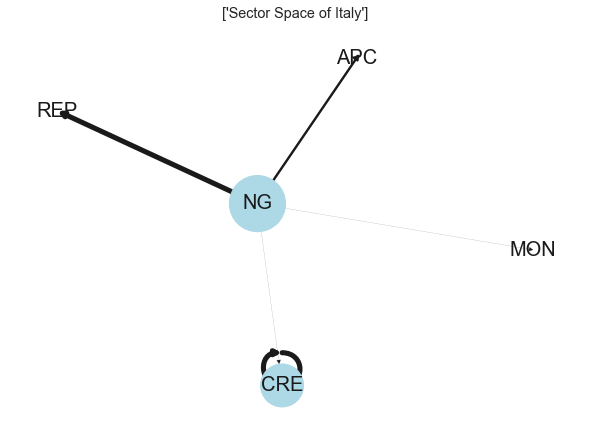

In [818]:
import networkx as nx
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'origin' is a list of unique identifiers for different subsets of edges

for o in origin:
    # Create a dictionary to store hub scores for each node and origin
    hub_scores_dict = {'origin': [], 'node': [], 'hub_score': []}
    d2 = data.loc[data['origin'] == o]
    cntry = d2.cntry.unique()
    
    # Check if 'weights' column exists in 'd2'
    if 'weight' in d2:
        df = d2[['source', 'target', 'weight']]
        g = nx.DiGraph()

        edges_with_weights = df.values
        for source, target, weight in edges_with_weights:
            g.add_edge(source, target, weight=weight)
    
        # Calculate hub and authority scores using the HITS algorithm
        hub_scores, authority_scores = nx.hits(g)

        # Scale node sizes based on hub scores (or use a different metric)
        node_sizes = [5000 * hub_scores[node] for node in g.nodes()] 
        
        # Calculate edge widths based on edge weights
        edge_weights = [d['weight'] for (u, v, d) in g.edges(data=True)]
        max_weight = max(edge_weights)
        min_weight = min(edge_weights) + 1
    
        # Scale edge widths based on weights
        edge_widths = [0.1 + 5 * (weight - min_weight) / (max_weight - min_weight) for weight in edge_weights]

        # Store hub scores for each node in the current origin
        for node, score in hub_scores.items():
            hub_scores_dict['origin'].append(o)
            hub_scores_dict['node'].append(node)
            hub_scores_dict['hub_score'].append(score)
            
        # Create a DataFrame from the hub data
        hub_df = pd.DataFrame(hub_scores_dict)
       
        # Visualize the graph with node sizes and edge widths
        pos = nx.spring_layout(g, k=0.15)  # Adjust 'k' to control node distance
        nx.draw(g, pos, with_labels=True, node_size= node_sizes, node_color='lightblue', font_size=20, width=edge_widths)
        plt.title("Sector Space of " + cntry )
        # Optionally, you can save or display the graph for each 'origin' here
        # plt.savefig(f'graph_{o}.png')
        # plt.show()

# Display or save the DataFrame
print(hub_df)


In [859]:
hub_values_dff = calculate_hub_values(edge_list)
print(hub_values_dff)

         Country Origin Node  eigenvector
0    Afghanistan    afg   NG     0.707107
1    Afghanistan    afg  WAT     0.707107
2        Albania    alb  APC     0.124930
3        Albania    alb  MON     0.297862
4        Albania    alb  CRE     0.254409
..           ...    ...  ...          ...
953     Zimbabwe    zwe   NG     0.653281
954     Zimbabwe    zwe  CRE     0.353552
955     Zimbabwe    zwe  REP     0.500002
956     Zimbabwe    zwe  WAT     0.353552
957     Zimbabwe    zwe  HEM     0.270600

[958 rows x 4 columns]


hub_values_dff.to_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Code_Produced\eigenvector_centrality2.csv', index = True)

### Frequency of Not Green Dependence In Green Economic growth

In [888]:
hub_data =hub_values_dff.copy()

#Read Centrality Data
hub_data = pd.read_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Code_Produced\eigenvector_centrality2.csv')

In [889]:
hub_data.rename(columns = {'Origin':'origin'}, inplace = True)
hub_data.rename(columns = {'eigenvector':'Centrality'}, inplace = True)

In [890]:
hub_data.head()

,Country,origin,Node,Centrality
0,Afghanistan,afg,NG,0.707107
1,Afghanistan,afg,WAT,0.707107
2,Albania,alb,APC,0.124930
3,Albania,alb,MON,0.297862
4,Albania,alb,CRE,0.254409


In [891]:
selected = ['origin','Economy_type']
Economy_type1 = Economy_type[selected]
Economy_type1.head()

,origin,Economy_type
0,hkg,Developing
1,stp,Developing
2,roc,Developing
3,gbr,Major Developed
4,cod,Developing


In [892]:
hub_data_f = pd.merge(hub_data, Economy_type1,on = 'origin', how = 'left')

In [893]:
hub_data_f

,Country,origin,Node,Centrality,Economy_type
0,Afghanistan,afg,NG,0.707107,Developing
1,Afghanistan,afg,WAT,0.707107,Developing
2,Albania,alb,APC,0.124930,Economy in Transition
3,Albania,alb,MON,0.297862,Economy in Transition
4,Albania,alb,CRE,0.254409,Economy in Transition
...,...,...,...,...,...
953,Zimbabwe,zwe,NG,0.653281,Developing
954,Zimbabwe,zwe,CRE,0.353552,Developing
955,Zimbabwe,zwe,REP,0.500002,Developing
956,Zimbabwe,zwe,WAT,0.353552,Developing


In [899]:
hub_data_f.Country.unique()

array(['Afghanistan', 'Albania', 'American Samoa', 'Andorra', 'Anguilla',
       'Antigua and Barbuda', 'Argentina', 'Armenia', 'Aruba',
       'Australia', 'Austria', 'Azerbaijan', 'Bahamas', 'Bahrain',
       'Bangladesh', 'Barbados', 'Belarus', 'Belize', 'Benin', 'Bermuda',
       'Bosnia and Herzegovina', 'Brazil', 'Brunei', 'Bulgaria',
       'Burkina Faso', 'Burma', 'Cabo Verde', 'Cambodia', 'Cameroon',
       'Canada', 'Cayman Islands', 'Chile', 'China', 'Colombia',
       'Congo, Republic of the', 'Cook Islands', 'Costa Rica',
       "Cote d'Ivoire", 'Croatia', 'Cuba', 'Cyprus', 'Czech Republic',
       'Denmark', 'Djibouti', 'Dominica', 'Dominican Republic', 'Ecuador',
       'Egypt', 'El Salvador', 'Estonia', 'Ethiopia', 'Fiji', 'Finland',
       'France', 'French Polynesia', 'Gabon', 'Gambia, The', 'Georgia',
       'Germany', 'Ghana', 'Gibraltar', 'Greece', 'Grenada', 'Guam',
       'Guatemala', 'Guinea', 'Guyana', 'Honduras', 'Hong Kong',
       'Hungary', 'Iceland', 'Indi

In [911]:
df = pd.DataFrame(hub_data_f)

# Values to remove
values_to_remove = ['Cayman Islands', 'Cook Islands', 'Northern Mariana Islands', 'Turks and Caicos Islands']

# Remove rows where 'cntry' is in the values_to_remove list
df_cleaned = df.loc[~df['Country'].isin(values_to_remove)]

# Pivot the data to create a single heatmap
heatmap_data = df_cleaned.pivot(index='Country', columns='Node', values='Centrality')

# Use a colorblind-friendly palette
#sns.set_palette("colorblind")
#plt.subplots_adjust(top=5, bottom=0.15, left=0.15, right=0.95)
# Set the font scale for all text
sns.set(font_scale=5)  # Adjust the scale as needed
# Adjust the x-axis label sizes
#plt.xticks(fontsize=10)  # Change the fontsize to your preferred size

# Create a heatmap
plt.figure(figsize=(120, 200))  # Adjust the figure size as needed
heatmap = sns.heatmap(heatmap_data, annot=True, cmap='YlGnBu', cbar=True, cbar_kws={'orientation': 'vertical','shrink': 0.3} , fmt=".2f") 

# Set the title and labels
#plt.title('Heatmap of Centrality Values')
plt.xlabel('Sector', size=100, labelpad=40)
plt.ylabel("")

# Set the font size for annotations
for _, t in enumerate(heatmap.texts):
    t.set(size=50)  # Adjust the font size as needed
plt.xticks(fontsize=100)
# Save the plot as a PDF
#.savefig('boxplot.pdf', format='pdf')

# You can save the plot with the custom colors to a specific file path

file_path = r'C:\Users\hanee\OneDrive\Desktop\Journa Submission\Resubmission File\Revised Graphs\Sectors_Heatmap_rev3.png'
plt.savefig(file_path, format='png')

# Display the plot
plt.show()

In [912]:
hub_data_f.Economy_type.unique()

array(['Developing', 'Economy in Transition', 'Developed',
       'Major Developed '], dtype=object)

In [913]:
#Define the colors in the desired order
colors = [ '#228B22','#228B22','#228B22','#228B22',
          #'#A9B200', '#A9B200','#A9B200','#A9B200','#7F9D00',
          '#7F9D00','#7F9D00','#7F9D00','#7F9D00','#7F9D00',
          #'#A8C17A','#A8C17A','#A8C17A','#A8C17A', '#A8C17A',
          #'#A9B200','#A9B200','#A9B200','#A9B200',
           '#A8C17A', '#A8C17A', '#A8C17A', '#A8C17A',
           '#FFE855','#FFE855','#FFE855','#FFE855','#FFE855','#FFE855']
          #'#D0C100','#D0C100','#FFE855','#D0C100',
          #'#A8C17A', '#A8C17A', '#A8C17A', '#A8C17A','#A8C17A','#A8C17A']
         #  '#98FF98', '#98FF98','#98FF98','#98FF98',
         # '#A9B200', '#D0C100','#7F9D00','#FFE855','#FFE855','#FFE855']

In [914]:
import seaborn as sns
sns.color_palette('YlGnBu')

[(0.9101268742791234, 0.9649365628604383, 0.6956401384083045),
 (0.6984544405997694, 0.8818608227604767, 0.7138485198000769),
 (0.39601691657054977, 0.7660745866974241, 0.7481430219146482),
 (0.1729642445213379, 0.6295117262591311, 0.759523260284506),
 (0.12764321414840446, 0.42666666666666664, 0.6861361014994233),
 (0.14357554786620533, 0.22523644752018454, 0.5905420991926182)]

In [915]:
import seaborn as sns
sns.color_palette('YlGnBu')

for i in sns.color_palette('YlGnBu'):
    print(i)

(0.9101268742791234, 0.9649365628604383, 0.6956401384083045)
(0.6984544405997694, 0.8818608227604767, 0.7138485198000769)
(0.39601691657054977, 0.7660745866974241, 0.7481430219146482)
(0.1729642445213379, 0.6295117262591311, 0.759523260284506)
(0.12764321414840446, 0.42666666666666664, 0.6861361014994233)
(0.14357554786620533, 0.22523644752018454, 0.5905420991926182)


In [916]:
custom_colors = [
    (0.9101268742791234, 0.9649365628604383, 0.6956401384083045),
    (0.6984544405997694, 0.8818608227604767, 0.7138485198000769),
    (0.39601691657054977, 0.7660745866974241, 0.7481430219146482),
    (0.14357554786620533, 0.22523644752018454, 0.5905420991926182),
    (0.1729642445213379, 0.6295117262591311, 0.759523260284506),
    (0.12764321414840446, 0.42666666666666664, 0.6861361014994233)
]

# Use your custom color palette
sns.set_palette(custom_colors)

<Figure size 720x432 with 0 Axes>

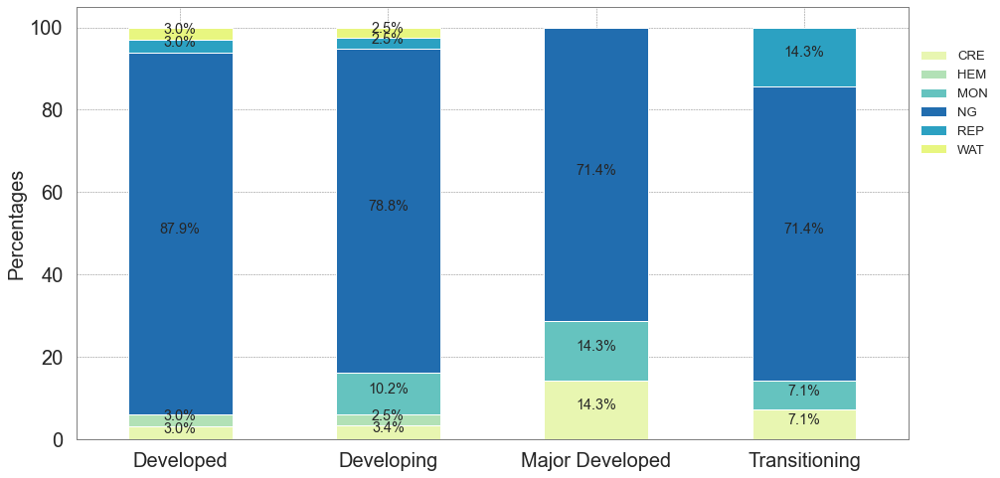

In [917]:
import pandas as pd

# Create a custom color mapping dictionary
# Your data and other code here...

# Create a stacked bar chart
plt.figure(figsize=(10, 6))
# Set the font scale for all text


custom_colors = [
    (0.9101268742791234, 0.9649365628604383, 0.6956401384083045),
(0.6984544405997694, 0.8818608227604767, 0.7138485198000769),
(0.39601691657054977, 0.7660745866974241, 0.7481430219146482),
(0.12764321414840446, 0.42666666666666664, 0.6861361014994233),
(0.1729642445213379, 0.6295117262591311, 0.759523260284506),
(0.9101268742791234, 0.9649365628604383, 0.5)

]



# Extend the "Economy Type" list with additional categories

data = {
    'Economy Type': ['Major Developed', 'Developed', 'Transitioning', 'Developing'],
    'NG': [5, 29, 10, 93],
    'MON': [1, 0, 1, 12],
    'CRE': [1, 1, 1, 4],
    'REP': [0, 1, 2, 3],
    'WAT': [0, 1, 0, 3],
    'HEM': [0, 1, 0, 3]
}

df = pd.DataFrame(data)

# Set the "Economy Type" column as the index
df.set_index('Economy Type', inplace=True)


# Define the order of the categories
order = ['Major Developed', 'Developed', 'Transitioning', 'Developing']


# Use the Pandas melt function to reshape the data
melted_df = df.reset_index().melt(id_vars=['Economy Type'], var_name='Node', value_name='Count')

# Create a stacked bar chart
plt.figure(figsize=(15, 8))

# Set the background to white
fig = plt.gcf()
fig.set_facecolor('white')

total_counts = melted_df.groupby('Economy Type')['Count'].transform('sum')
melted_df['Percentage'] = (melted_df['Count'] / total_counts) * 100

ax = melted_df.pivot(index='Economy Type', columns='Node', values='Percentage').plot(
    kind='bar', stacked=True, color=custom_colors, ax=plt.gca())

plt.gca().set_facecolor('white')
plt.grid(color='grey', linestyle='--', linewidth=0.5)
sns.set(font_scale=1.2)  # Adjust the scale as needed

# Set the title and labels (you can add labels if needed)
# plt.title('Stacked Bar Chart of Node Counts by Economy Type')

plt.ylabel("Percentages", size=20)
plt.xlabel("", size=10)


# Rotate x-axis labels to read horizontally
plt.xticks(rotation=0 ,size = 20)  # Adjust the rotation angle as needed
# Rotate x-axis labels to read horizontally
plt.yticks(rotation=0,size=20)  # Adjust the rotation angle as needed

# Add percentages in the middle of each segment of the bars
for p in ax.patches:
    width, height = p.get_width(), p.get_height()
    x, y = p.get_xy()
    percentage = height
    if percentage > 0:  # Add this condition to hide 0% values
        ax.annotate(f'{percentage:.1f}%', (x + width / 2, y + height / 2), ha='center')

ax.set_facecolor('white')
plt.grid(color='grey', linestyle='--', linewidth=0.5)

for spine in ax.spines.values():
    spine.set_edgecolor('grey')  # Set frame color to black
    spine.set_linewidth(1)  # Set frame linewidth
        
        
# Show the stacked bar chart
plt.legend(title=' ', loc='right', bbox_to_anchor=(1.11, .8))

#file_path = r'C:\Users\hanee\Hanin\Journal Paper 01\Extension\Results 2\DATA_EXTENSION\SEM Data\Graph\Final Figures\Sectors_hubs_Percentages.pdf'
#plt.savefig(file_path, format='pdf')

# Display the plot
plt.show()

In [333]:
major_developed_data = dd[dd['Economy_type'] == 'Major Developed ']['Products_Count']
developing_data = dd[dd['Economy_type'] == 'Developing']['Products_Count']
transitioning_data = dd[dd['Economy_type'] == 'Economy in Transition']['Products_Count']
developed_data = dd[dd['Economy_type'] == 'Developed']['Products_Count']
All_developed_data = dd[(dd['Economy_type'] == 'Developed') | (dd['Economy_type'] == 'Major Developed ')]['Products_Count']

In [920]:
hub_data_f

,Country,origin,Node,Centrality,Economy_type
0,Afghanistan,afg,NG,0.707107,Developing
1,Afghanistan,afg,WAT,0.707107,Developing
2,Albania,alb,APC,0.124930,Economy in Transition
3,Albania,alb,MON,0.297862,Economy in Transition
4,Albania,alb,CRE,0.254409,Economy in Transition
...,...,...,...,...,...
953,Zimbabwe,zwe,NG,0.653281,Developing
954,Zimbabwe,zwe,CRE,0.353552,Developing
955,Zimbabwe,zwe,REP,0.500002,Developing
956,Zimbabwe,zwe,WAT,0.353552,Developing


In [921]:
# Filter the DataFrame to include only rows where 'Node' is 'NG'
filtered_df = hub_data_f[hub_data_f['Node'] == 'NG']

# Pivot the filtered DataFrame to create columns based on 'Economy_type' and rows filled with 'Centrality'
pivot_df = filtered_df.pivot_table(index='Country', columns='Economy_type', values='Centrality', aggfunc='mean')

# Reset index to turn 'Country' into a column
pivot_df = pivot_df.reset_index()

# Drop the 'Country' column if it's no longer needed
pivot_df = pivot_df.drop(columns=['Country'])

print(pivot_df)

Economy_type  Developed  Developing  Economy in Transition  Major Developed 
0                   NaN    0.707107                    NaN               NaN
1                   NaN         NaN               0.585243               NaN
2                   NaN    0.601501                    NaN               NaN
3              0.652747         NaN                    NaN               NaN
4                   NaN    0.500000                    NaN               NaN
..                  ...         ...                    ...               ...
159                 NaN    0.707107                    NaN               NaN
160                 NaN    0.621174                    NaN               NaN
161                 NaN    0.707107                    NaN               NaN
162                 NaN    0.707107                    NaN               NaN
163                 NaN    0.653281                    NaN               NaN

[164 rows x 4 columns]


In [922]:
pivot_df.rename(columns = {'Economy in Transition':'Transitioning'}, inplace = True)
pivot_df.rename(columns = {'Major Developed ':'Major_Developed'}, inplace = True)

In [923]:
# Stack the values from Developed and Major_Developed
stacked_values = pivot_df[['Developed', 'Major_Developed']].stack().reset_index(level=1, drop=True)
stacked_values.name = 'All_Developed'
# Combine with the original DataFrame, ignoring the index for the new column
combined_df = pd.concat([pivot_df.reset_index(drop=True), stacked_values.reset_index(drop=True)], axis=1)

In [924]:
combined_df

,Developed,Developing,Transitioning,Major_Developed,All_Developed
0,NaN,0.707107,NaN,NaN,0.652747
1,NaN,NaN,0.585243,NaN,0.707107
2,NaN,0.601501,NaN,NaN,0.653169
3,0.652747,NaN,NaN,NaN,0.493675
4,NaN,0.500000,NaN,NaN,0.646051
...,...,...,...,...,...
159,NaN,0.707107,NaN,NaN,NaN
160,NaN,0.621174,NaN,NaN,NaN
161,NaN,0.707107,NaN,NaN,NaN
162,NaN,0.707107,NaN,NaN,NaN


In [925]:
# Function to stack columns without NaNs
def stack_column_values(*columns):
    values = []
    for col in columns:
        values.extend(combined_df[col].dropna().tolist())
    return values

# Create a new DataFrame with stacked columns
stacked_values = {
    'Developed': stack_column_values('Developed'),
    'Major_Developed': stack_column_values('Major_Developed'),
    'Developing': stack_column_values('Developing'),
    'Transitioning': stack_column_values('Transitioning'),
    'All_Developed': stack_column_values('All_Developed')
}

# Convert to DataFrame
max_len = max(map(len, stacked_values.values()))
stacked_df = pd.DataFrame({k: pd.Series(v).reindex(range(max_len)) for k, v in stacked_values.items()})

# Output the new DataFrame
print(stacked_df)

     Developed  Major_Developed  Developing  Transitioning  All_Developed
0     0.652747         0.646051    0.707107       0.585243       0.652747
1     0.707107         0.617816    0.601501       0.551865       0.707107
2     0.653169         0.577350    0.500000       0.601501       0.653169
3     0.493675         0.657024    0.707107       0.569386       0.493675
4     0.488204         0.644396    0.601501       0.467438       0.646051
..         ...              ...         ...            ...            ...
107        NaN              NaN    0.707107            NaN            NaN
108        NaN              NaN    0.621174            NaN            NaN
109        NaN              NaN    0.707107            NaN            NaN
110        NaN              NaN    0.707107            NaN            NaN
111        NaN              NaN    0.653281            NaN            NaN

[112 rows x 5 columns]


In [926]:
Transitioning = stacked_df.Transitioning.unique()
Major_Developed = stacked_df.Major_Developed.unique()
Developed = stacked_df.Developed.unique()
Developing = stacked_df.Developing.unique()
All_Developed = stacked_df.All_Developed.unique()

In [927]:
# Remove NaN values using NumPy
Developed = Developed[~np.isnan(Developed)]
Developing = Developing[~np.isnan(Developing)]
Transitioning = Transitioning[~np.isnan(Transitioning)]
Major_Developed = Major_Developed[~np.isnan(Major_Developed)]
All_Developed = All_Developed[~np.isnan(All_Developed)]

In [928]:
f_statistic, p_value = stats.f_oneway(Developing, Transitioning, All_Developed)

# Print the results
print("F-statistic:", f_statistic)
print("P-value:", p_value)

# Check if the p-value is less than the significance level (e.g., 0.05) to determine statistical significance
alpha = 0.05
if p_value < alpha:
    print("The groups have different means (statistically significant).")

    # Perform Tukey's HSD post-hoc test for pairwise comparisons
    data = np.concatenate([Developing, Transitioning, All_Developed])
    labels = ['Developing'] * len(Developing) + ['Transitioning'] * len(Transitioning) + ['All_Developed'] * len(All_Developed)
    df = pd.DataFrame({'Value': data, 'Group': labels})
    
    posthoc = pg.pairwise_gameshowell(data=df, dv='Value', between='Group')
    print(posthoc)
    
    #tukey = pairwise_tukeyhsd(data, labels)
    #print(tukey.summary())
    
else:
    print("The groups do not have different means (not statistically significant).")


F-statistic: 3.9758614952132936
P-value: 0.02159999482793552
The groups have different means (statistically significant).
               A              B   mean(A)   mean(B)      diff        se  \
0  All_Developed     Developing  0.584589  0.623405 -0.038817  0.014440   
1  All_Developed  Transitioning  0.584589  0.607712 -0.023124  0.021273   
2     Developing  Transitioning  0.623405  0.607712  0.015693  0.019141   

          T         df      pval    hedges  
0 -2.688096  65.125333  0.024408 -0.586209  
1 -1.086996  26.364497  0.530317 -0.317599  
2  0.819881  18.565973  0.695680  0.254213  


# Part 5: Preparing the PLS-SEM Model Data

In [ ]:
import semopy
import pandas as pd
import chardet

### Melting TI_Indicators and loading them again

In [559]:
Green_Indicators = pd.read_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Selected_Green_Indicators_for_melting.csv') #Import HS codes as strings to preserve formatting
Green_Indicators.head()

,REF_AREA,Reference area,TI1_2003-2013,TI1_2004-2014,TI1_2005-2015,TI2_2003-2013,TI2_2004-2014,TI2_2005-2015
0,SGP,Singapore,0.11,0.07,0.04,20.03,14.93,11.18
1,IRL,Ireland,-0.02,0.00,0.02,3.66,3.63,4.95
2,QAT,Qatar,0.00,0.01,0.02,0.78,2.24,3.42
3,PAN,Panama,-0.01,0.00,-0.01,0.05,0.23,-0.55
4,MLT,Malta,0.00,0.00,0.00,4.70,7.16,5.28


In [560]:
Green_Indicators.rename(columns = {'REF_AREA':'origin'}, inplace = True)
Green_Indicators.rename(columns = {'Reference area':'cntry'}, inplace = True)

In [562]:
Green_Indicators_melted = pd.melt(Green_Indicators, id_vars =['origin','cntry'], value_vars =['TI1_2003-2013','TI1_2004-2014','TI1_2005-2015','TI2_2003-2013','TI2_2004-2014','TI2_2005-2015'])

In [566]:
Green_Indicators_melted

,origin,cntry,variable,value
0,SGP,Singapore,TI1_2003-2013,0.11
1,IRL,Ireland,TI1_2003-2013,-0.02
2,QAT,Qatar,TI1_2003-2013,0.00
3,PAN,Panama,TI1_2003-2013,-0.01
4,MLT,Malta,TI1_2003-2013,0.00
...,...,...,...,...
805,GRC,Greece,TI2_2005-2015,-1.21
806,BRN,Brunei Darussalam,TI2_2005-2015,2.41
807,LBY,Libya,TI2_2005-2015,0.00
808,KWT,Kuwait,TI2_2005-2015,0.39


In [568]:

df = pd.DataFrame(Green_Indicators_melted)

# Convert 'origin' column to lowercase
df['origin'] = df['origin'].str.lower()

# Extract year and TI information from the 'variable' column
df[['TI', 'year_x_range']] = df['variable'].str.extract(r'(TI\d)_(\d{4}-\d{4})')
df['year_start'], df['year_end'] = df['year_x_range'].str.split('-', 1).str
df['year_start'] = df['year_start'].astype(int)
df['year_end'] = df['year_end'].astype(int)

# Create a new DataFrame with expanded years
df_expanded = pd.DataFrame({
    'origin': df['origin'].repeat(df['year_end'] - df['year_start'] + 1),
    'cntry': df['cntry'].repeat(df['year_end'] - df['year_start'] + 1),
    'TI': df['TI'].repeat(df['year_end'] - df['year_start'] + 1),
    'year_x': [year for start, end in zip(df['year_start'], df['year_end']) for year in range(start, end + 1)],
    'value': df['value'].repeat(df['year_end'] - df['year_start'] + 1)
})

# Pivot the expanded DataFrame to get TI1 and TI2 as separate columns
pivot_df3 = df_expanded.pivot_table(index=['cntry', 'origin', 'year_x'], columns='TI', values='value', fill_value=0).reset_index()

# Rename columns
pivot_df3.columns.name = None
pivot_df3.columns = ['cntry', 'origin', 'year_x', 'TI1', 'TI2']

print(pivot_df3)

         cntry origin  year_x       TI1       TI2
0      Algeria    dza    2003  0.000000  0.020000
1      Algeria    dza    2004  0.000000  0.020000
2      Algeria    dza    2005  0.003333  0.036667
3      Algeria    dza    2006  0.003333  0.036667
4      Algeria    dza    2007  0.003333  0.036667
...        ...    ...     ...       ...       ...
1750  Zimbabwe    zwe    2011 -0.003333 -0.050000
1751  Zimbabwe    zwe    2012 -0.003333 -0.050000
1752  Zimbabwe    zwe    2013 -0.003333 -0.050000
1753  Zimbabwe    zwe    2014  0.000000 -0.010000
1754  Zimbabwe    zwe    2015  0.000000 -0.040000

[1755 rows x 5 columns]


In [933]:
Melted_Data_10_span_fix1

,origin,HSCode,Medium_x,year_x,year_y,RCA_x,RCA_y,Max_proximity,num_related,variable,value,cntry,Theme,Color,Medium_y,TYPE,Economy_type
0,ben,841381,WAT,2004,2014,0.094683,1.144745,0.370370,1,P2,490199,Benin,Waste water management and potable water treat...,blue,NG,Not_green,Developing
1,ben,841440,APC,2005,2015,0.065212,6.071004,0.360000,1,P2,847910,Benin,Air pollution control,cyan,NG,Not_green,Developing
2,ben,846291,SWM,2005,2015,0.033671,5.207211,0.333333,1,P2,870540,Benin,Management of solid and hazardous waste and re...,orange,NG,Not_green,Developing
3,bfa,841440,APC,2004,2014,0.346844,4.290397,0.366667,1,P2,843790,Burkina Faso,Air pollution control,cyan,NG,Not_green,Developing
4,bfa,901590,MON,2004,2014,0.126350,1.014863,0.333333,1,P2,491199,Burkina Faso,"Environmental monitoring, analysis and assessm...",green,NG,Not_green,Developing
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3550,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P11,852691,Germany,Cleaner or more resource efficient technologie...,yellow,NG,Not_green,Major Developed
3551,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P11,847490,Portugal,Cleaner or more resource efficient technologie...,yellow,NG,Not_green,Developed
3552,deu,870390,CRE,2004,2014,0.415732,2.005875,0.375000,11,P12,854511,Germany,Cleaner or more resource efficient technologie...,yellow,NG,Not_green,Major Developed
3553,prt,730290,CRE,2003,2013,0.136678,2.339079,0.500000,12,P12,850423,Portugal,Cleaner or more resource efficient technologie...,yellow,REP,Green,Developed


In [977]:
DATA_Test.origin.nunique()

170

In [980]:
DATA_Test.variable.unique()

array(['P2'], dtype=object)

In [1023]:
# Create a copy with the specified columns
DATA_Test = Melted_Data_10_span_fix1[['cntry', 'origin', 'year_x', 'TYPE', 'num_related', 'variable']].copy()

# Keep only rows where 'variable' is 'P2'
DATA_Test = DATA_Test[DATA_Test['variable'] == 'P2']

# Step 1: Pivot the DataFrame to get counts for each TYPE
DATA_Test_pivot_df = DATA_Test.pivot_table(
    index=['cntry', 'origin', 'year_x'],
    columns='TYPE',
    values='num_related',
    aggfunc='count',
    fill_value=0
).reset_index()


# Calculate the sum of all green and not green by year from the pivoted DataFrame
sum_pivot = DATA_Test_pivot_df.groupby('year_x').agg(
    All_New_Green=('Green', 'sum'),
    All_New_Not_green=('Not_green', 'sum')
).reset_index()


# Merge the count pivot with the sum pivot on 'year_x'
merged_df1 = pd.merge(DATA_Test_pivot_df, sum_pivot, on='year_x', how='inner')



# Step 2: Pivot the DataFrame to get sums for each TYPE
DATA_Test_pivot_df2 = DATA_Test.pivot_table(
    index=['cntry', 'origin', 'year_x'],
    columns='TYPE',
    values='num_related',
    aggfunc='sum',
    fill_value=0
).reset_index()

# Rename the column
DATA_Test_pivot_df2 = DATA_Test_pivot_df2.rename(columns={'Green': 'Green_links'})
DATA_Test_pivot_df2 = DATA_Test_pivot_df2.rename(columns={'Not_green': 'Not_green_links'})

print(DATA_Test_pivot_df2)

# Merge the pivot DataFrames
merged_df = pd.merge(merged_df1, DATA_Test_pivot_df2, on=['cntry', 'origin', 'year_x'], how='inner')
print(merged_df)

# Calculate the shares
merged_df['share_green'] = merged_df['Green'] / merged_df['All_New_Green']
merged_df['share_not_green'] = merged_df['Not_green'] / merged_df['All_New_Not_green']

# Reorder columns to match the desired output
merged_df = merged_df[['cntry', 'origin', 'year_x', 'Green', 'Not_green', 'share_green', 'share_not_green', 'Green_links', 'Not_green_links']]

print(merged_df)


TYPE           cntry origin  year_x  Green_links  Not_green_links
0        Afghanistan    afg    2003            0                1
1            Albania    alb    2003            0               11
2            Albania    alb    2004            0                7
3            Albania    alb    2005            1                3
4     American Samoa    asm    2004            1                0
..               ...    ...     ...          ...              ...
419         Zimbabwe    zwe    2004            0                1
420         Zimbabwe    zwe    2005            1                1
421              blx    blx    2003            0               13
422              blx    blx    2004            0                3
423              blx    blx    2005            0                6

[424 rows x 5 columns]
                   cntry origin  year_x  Green  Not_green  All_New_Green  \
0            Afghanistan    afg    2003      0          1            131   
1                Albania    alb 

In [1013]:
merged_df.Not_green_links.max()

56

In [1032]:
## MAKING SURE TO HAVE YEARS THAT THERE WAS NO GREEN PRODUCTS FOR COUNTRIES 
##FOR HE COUNTRIES THAT HAD ATLEAST ONE GREEN PRODUCT EXPORTED OVER THE THREE TIME SPANS
import pandas as pd

# Assuming your data is in a DataFrame named df
df = merged_df.copy()  # Replace with your actual file path or DataFrame initialization

# Define the years you want to check for
required_years = [2003, 2004, 2005]

# Get unique combinations of 'cntry' and 'origin'
unique_combinations = df[['cntry', 'origin']].drop_duplicates()

# Create an empty DataFrame to store the new rows
new_rows = []

# Iterate over each unique combination of 'cntry' and 'origin'
for _, row in unique_combinations.iterrows():
    cntry = row['cntry']
    origin = row['origin']
    
    # Filter the DataFrame for the current combination
    subset = df[(df['cntry'] == cntry) & (df['origin'] == origin)]
    
    # Check for missing years
    existing_years = subset['year_x'].tolist()
    missing_years = [year for year in required_years if year not in existing_years]
    
    # Create new rows for missing years
    for year in missing_years:
        new_row = {
            'cntry': cntry,
            'origin': origin,
            'year_x': year,
            'Green': 0,
            'Not_green': 0,
            'share_green': 0,
            'share_not_green': 0,
            'Green_links': 0,
            'Not_green_links': 0
        }
        new_rows.append(new_row)

# Convert the new rows to a DataFrame
new_rows_df = pd.DataFrame(new_rows)

# Append the new rows to the original DataFrame
df_complete = pd.concat([df, new_rows_df], ignore_index=True)

# Sort the DataFrame by 'cntry', 'origin', and 'year_x'
df_complete = df_complete.sort_values(by=['cntry', 'origin', 'year_x']).reset_index(drop=True)

# View the updated DataFrame
print(df_complete)

# Save the updated DataFrame to a CSV file if needed
# df_complete.to_csv('updated_file.csv', index=False)

           cntry origin  year_x  Green  Not_green  share_green  \
0    Afghanistan    afg    2003      0          1     0.000000   
1    Afghanistan    afg    2004      0          0     0.000000   
2    Afghanistan    afg    2005      0          0     0.000000   
3        Albania    alb    2003      0          5     0.000000   
4        Albania    alb    2004      0          5     0.000000   
..           ...    ...     ...    ...        ...          ...   
505     Zimbabwe    zwe    2004      0          1     0.000000   
506     Zimbabwe    zwe    2005      1          1     0.007874   
507          blx    blx    2003      0          8     0.000000   
508          blx    blx    2004      0          3     0.000000   
509          blx    blx    2005      0          3     0.000000   

     share_not_green  Green_links  Not_green_links  
0           0.001272            0                1  
1           0.000000            0                0  
2           0.000000            0               

In [1033]:
# Fill any NaN values with zero
df_complete = df_complete.fillna(0)

### Merge two data

In [1046]:
pivot_df4 = pivot_df3.drop(columns=['cntry'])

In [1052]:
data3.TI2.max()

76.25

In [1051]:
data3 = pd.merge(df_complete, pivot_df4, on = ['origin', 'year_x'], how = 'left')#, indicator="indicator_column")

In [1053]:
Economy_type1 = Economy_type[['Economy_type', 'origin']]

In [1054]:
Economy_type1

,Economy_type,origin
0,Developing,hkg
1,Developing,stp
2,Developing,roc
3,Major Developed,gbr
4,Developing,cod
...,...,...
208,Developing,ncl
209,Developing,mnp
210,Developing,shn
211,Developing,tkl


In [1055]:
data4 = pd.merge(data3, Economy_type1, on = ['origin'], how = 'left')#, indicator="indicator_column")

In [1056]:
data4

,cntry,origin,year_x,Green,Not_green,share_green,share_not_green,Green_links,Not_green_links,TI1,TI2,Economy_type
0,Afghanistan,afg,2003,0,1,0.000000,0.001272,0,1,NaN,NaN,Developing
1,Afghanistan,afg,2004,0,0,0.000000,0.000000,0,0,NaN,NaN,Developing
2,Afghanistan,afg,2005,0,0,0.000000,0.000000,0,0,NaN,NaN,Developing
3,Albania,alb,2003,0,5,0.000000,0.006361,0,11,NaN,NaN,Economy in Transition
4,Albania,alb,2004,0,5,0.000000,0.006684,0,7,NaN,NaN,Economy in Transition
...,...,...,...,...,...,...,...,...,...,...,...,...
505,Zimbabwe,zwe,2004,0,1,0.000000,0.001337,0,1,-0.005000,-0.055,Developing
506,Zimbabwe,zwe,2005,1,1,0.007874,0.001433,1,1,-0.003333,-0.050,Developing
507,blx,blx,2003,0,8,0.000000,0.010178,0,13,NaN,NaN,NaN
508,blx,blx,2004,0,3,0.000000,0.004011,0,3,NaN,NaN,NaN


In [1057]:
data4.to_csv(r'C:\Users\hanee\OneDrive\Documents\GitHub\TI-Effect-on-Green-Capabilities-Spillovers\Data_Files\IN\Code_Produced\SEM_Data0.csv', index = False)